Imports

In [18]:
import numpy as np
import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
from torch.utils.data import DataLoader

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

from utils import extract_time
from utils import random_generator
from utils import MinMaxScaler
from utils import sine_data_generation
from utils import visualization

from modules_and_training import TimeGAN
from modules_and_training import Time_GAN_module

Parameters

In [22]:
gamma = 1
no, seq_len, dim = 12800, 24, 3

parameters = dict()
parameters['module'] = 'gru' 
parameters['hidden_dim'] = 10
parameters['num_layers'] = 3
parameters['iterations'] = 20
parameters['batch_size'] = 128
parameters['epoch'] = 3
parameters['device'] = 'cpu'

Data Generation:
12800 synthetic time multidimensional timeseries are created, with 24 timesteps each 

In [20]:
# create data and examine shape

data = sine_data_generation(no, seq_len, dim)
data = MinMaxScaler(data)
data = torch.Tensor(data)
data.shape

torch.Size([12800, 24, 3])

Training and Examination of generating process: for each epoch a single sample is generated from the current state of the generator and visualized alongside with the coressponding loss values

Start Embedding Network Training
step: 1/3, e_loss: 1.6633592
step: 2/3, e_loss: 1.565983
Finish Embedding Network Training
Start Training with Supervised Loss Only
step: 1/3, s_loss: 0.076769896
step: 2/3, s_loss: 0.04262442
Finish Training with Supervised Loss Only
Start Joint Training
step: 0/3, D_loss: 2.1491442, G_loss_U: 0.63318604, G_loss_S: 0.0009704537, E_loss_t0: 2.112696


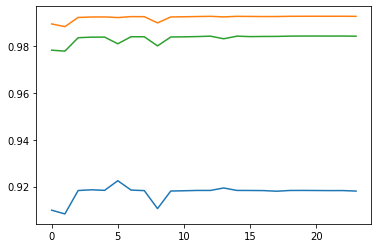

step: 0/3, D_loss: 2.1511967, G_loss_U: 0.64083844, G_loss_S: 0.0009464417, E_loss_t0: 2.1466193


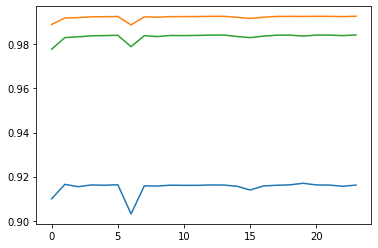

step: 0/3, D_loss: 2.1389432, G_loss_U: 0.6558197, G_loss_S: 0.0009839399, E_loss_t0: 2.122092


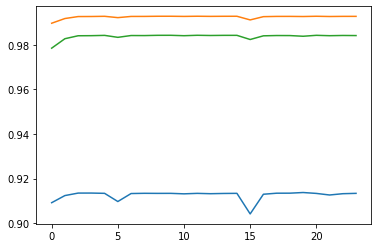

step: 0/3, D_loss: 2.1180372, G_loss_U: 0.67296463, G_loss_S: 0.00086383166, E_loss_t0: 2.1346922


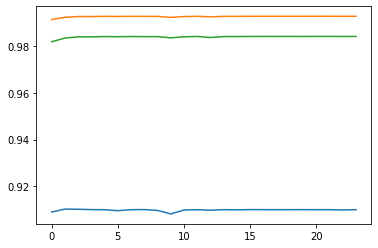

step: 0/3, D_loss: 2.0957365, G_loss_U: 0.6937652, G_loss_S: 0.0009090705, E_loss_t0: 2.1591437


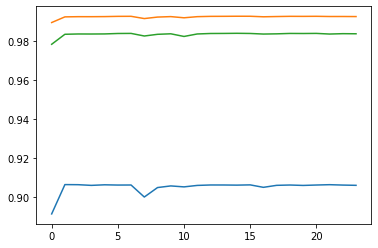

step: 0/3, D_loss: 2.0717497, G_loss_U: 0.71318793, G_loss_S: 0.0008772306, E_loss_t0: 2.1580927


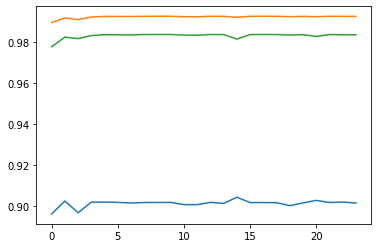

step: 0/3, D_loss: 2.04881, G_loss_U: 0.7351949, G_loss_S: 0.0009508167, E_loss_t0: 2.1003356


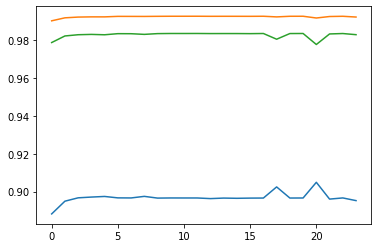

step: 0/3, D_loss: 2.02876, G_loss_U: 0.7565095, G_loss_S: 0.0009479666, E_loss_t0: 2.1542642


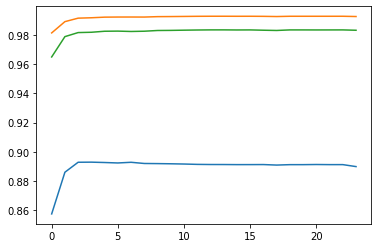

step: 0/3, D_loss: 2.008812, G_loss_U: 0.7814937, G_loss_S: 0.00095637375, E_loss_t0: 2.1112459


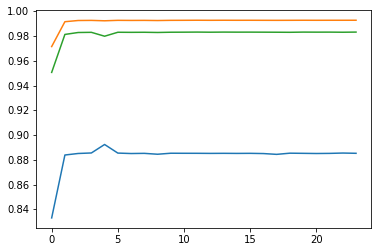

step: 0/3, D_loss: 1.9909613, G_loss_U: 0.8051252, G_loss_S: 0.00095275487, E_loss_t0: 2.1239767


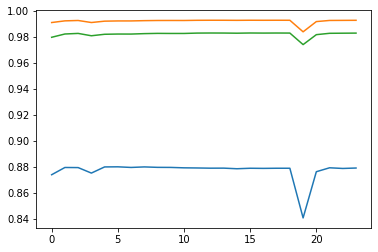

step: 0/3, D_loss: 1.9749274, G_loss_U: 0.8308725, G_loss_S: 0.00093515695, E_loss_t0: 2.1042125


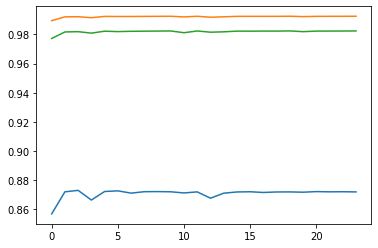

step: 0/3, D_loss: 1.9609053, G_loss_U: 0.85954237, G_loss_S: 0.0009622638, E_loss_t0: 2.163648


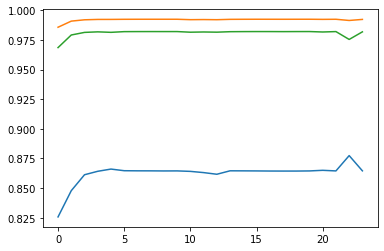

step: 0/3, D_loss: 1.9413304, G_loss_U: 0.88696593, G_loss_S: 0.0009786182, E_loss_t0: 2.1488934


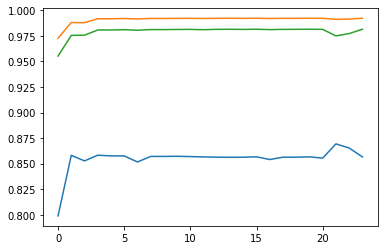

step: 0/3, D_loss: 1.9290378, G_loss_U: 0.9147566, G_loss_S: 0.00097294035, E_loss_t0: 2.1119225


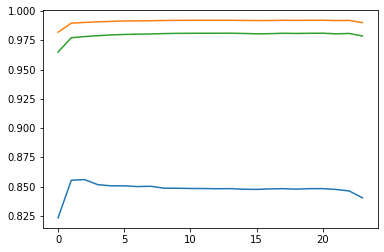

step: 0/3, D_loss: 1.9167681, G_loss_U: 0.945962, G_loss_S: 0.0009980937, E_loss_t0: 2.108878


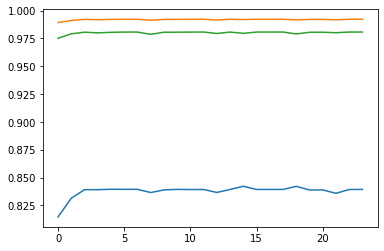

step: 0/3, D_loss: 1.9083544, G_loss_U: 0.9755085, G_loss_S: 0.0010423785, E_loss_t0: 2.147272


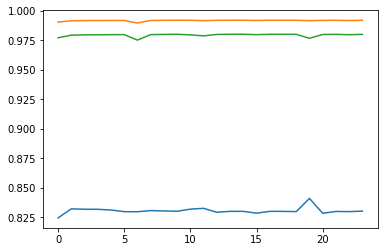

step: 0/3, D_loss: 1.8970215, G_loss_U: 1.0087758, G_loss_S: 0.0010794348, E_loss_t0: 2.0933084


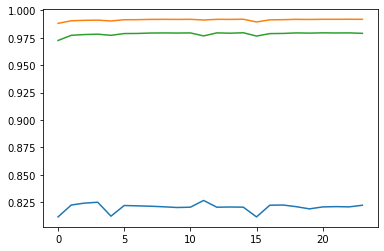

step: 0/3, D_loss: 1.893497, G_loss_U: 1.0357229, G_loss_S: 0.0010855349, E_loss_t0: 2.072604


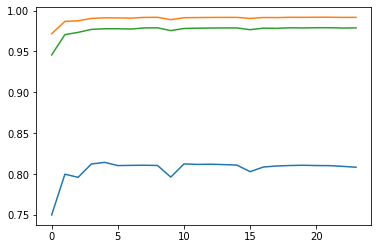

step: 0/3, D_loss: 1.8899438, G_loss_U: 1.0626706, G_loss_S: 0.0011185451, E_loss_t0: 2.0567844


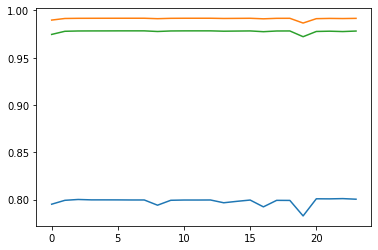

step: 0/3, D_loss: 1.8838078, G_loss_U: 1.0829258, G_loss_S: 0.0011574841, E_loss_t0: 2.0460117


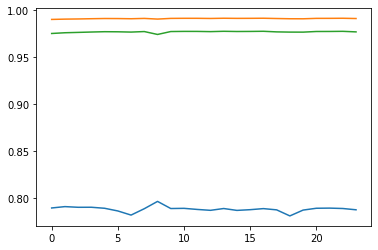

step: 0/3, D_loss: 1.8832587, G_loss_U: 1.1080514, G_loss_S: 0.0011751173, E_loss_t0: 2.0347369


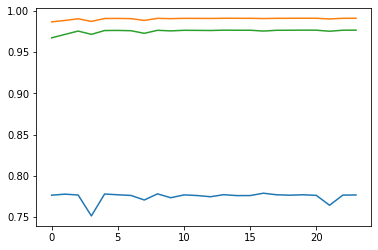

step: 0/3, D_loss: 1.8791022, G_loss_U: 1.1247395, G_loss_S: 0.0012529766, E_loss_t0: 2.0874856


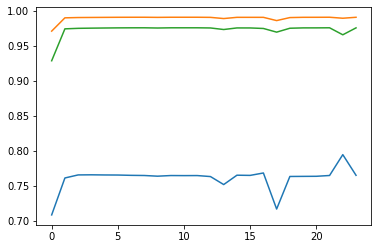

step: 0/3, D_loss: 1.8728895, G_loss_U: 1.1366386, G_loss_S: 0.001336209, E_loss_t0: 2.089949


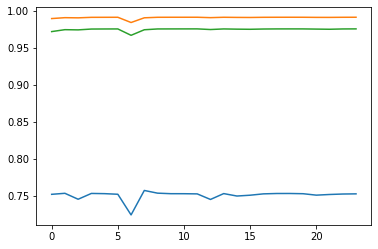

step: 0/3, D_loss: 1.8662617, G_loss_U: 1.1341532, G_loss_S: 0.0013788083, E_loss_t0: 2.0826814


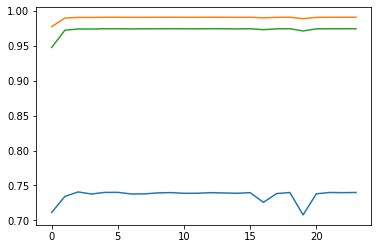

step: 0/3, D_loss: 1.8594476, G_loss_U: 1.1353786, G_loss_S: 0.0014241517, E_loss_t0: 2.1108475


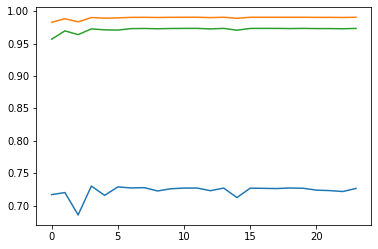

step: 0/3, D_loss: 1.8585385, G_loss_U: 1.1202835, G_loss_S: 0.001569918, E_loss_t0: 2.062104


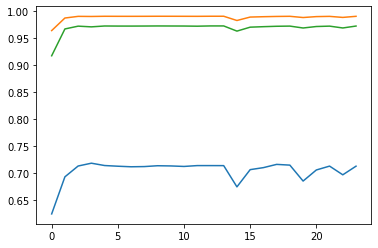

step: 0/3, D_loss: 1.838897, G_loss_U: 1.10361, G_loss_S: 0.0016814289, E_loss_t0: 2.0175462


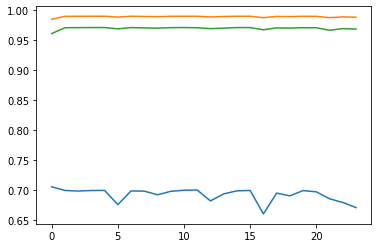

step: 0/3, D_loss: 1.8205874, G_loss_U: 1.0738379, G_loss_S: 0.0018702478, E_loss_t0: 2.0239978


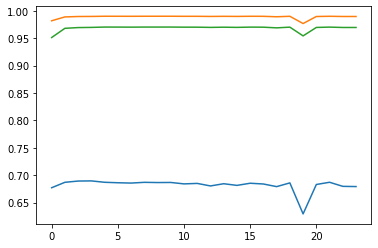

step: 0/3, D_loss: 1.8047493, G_loss_U: 1.0384566, G_loss_S: 0.002054933, E_loss_t0: 2.033882


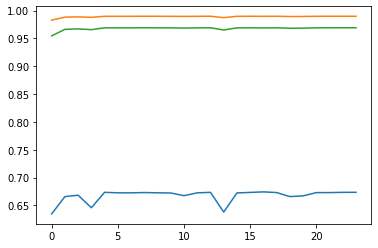

step: 0/3, D_loss: 1.7820842, G_loss_U: 1.0000731, G_loss_S: 0.002306919, E_loss_t0: 2.0542324


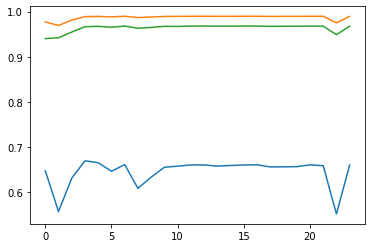

step: 0/3, D_loss: 1.7585043, G_loss_U: 0.9611109, G_loss_S: 0.0025701155, E_loss_t0: 2.0327983


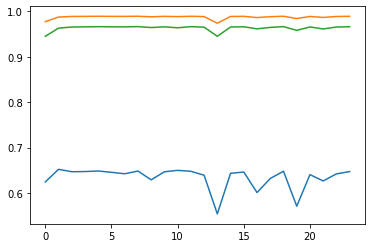

step: 0/3, D_loss: 1.7328644, G_loss_U: 0.92445683, G_loss_S: 0.0029697765, E_loss_t0: 2.090425


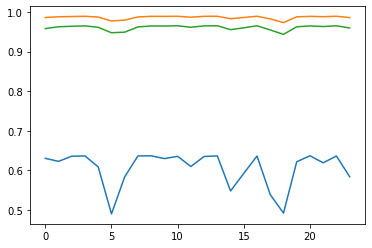

step: 0/3, D_loss: 1.7058474, G_loss_U: 0.8895688, G_loss_S: 0.003161742, E_loss_t0: 1.998318


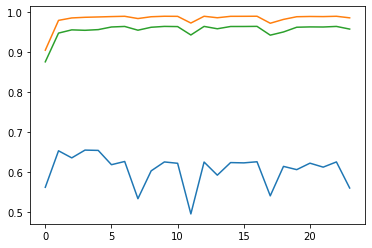

step: 0/3, D_loss: 1.6847525, G_loss_U: 0.85735434, G_loss_S: 0.0037252416, E_loss_t0: 2.0606873


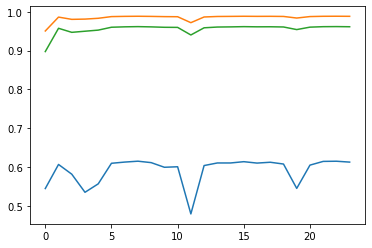

step: 0/3, D_loss: 1.6469129, G_loss_U: 0.8245862, G_loss_S: 0.004093749, E_loss_t0: 2.034399


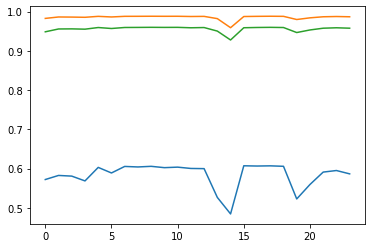

step: 0/3, D_loss: 1.6151317, G_loss_U: 0.80781794, G_loss_S: 0.004706257, E_loss_t0: 2.060787


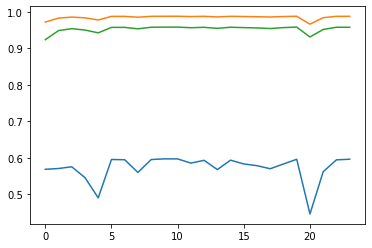

step: 0/3, D_loss: 1.5932631, G_loss_U: 0.785964, G_loss_S: 0.005356741, E_loss_t0: 2.088637


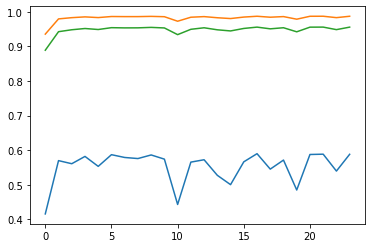

step: 0/3, D_loss: 1.5572195, G_loss_U: 0.7863028, G_loss_S: 0.005738674, E_loss_t0: 2.0654447


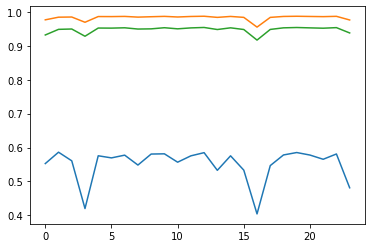

step: 0/3, D_loss: 1.520445, G_loss_U: 0.79178315, G_loss_S: 0.006472109, E_loss_t0: 2.0149581


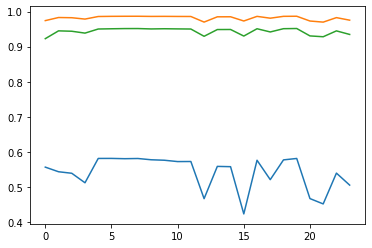

step: 0/3, D_loss: 1.4832914, G_loss_U: 0.8307888, G_loss_S: 0.007250883, E_loss_t0: 2.054406


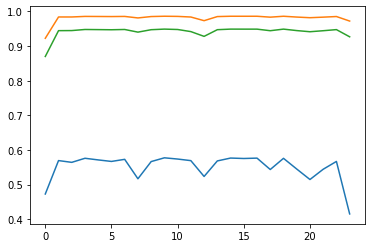

step: 0/3, D_loss: 1.4282614, G_loss_U: 0.9195263, G_loss_S: 0.008203329, E_loss_t0: 2.019781


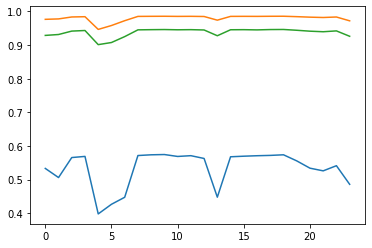

step: 0/3, D_loss: 1.3464885, G_loss_U: 1.0985929, G_loss_S: 0.0090840515, E_loss_t0: 2.0541072


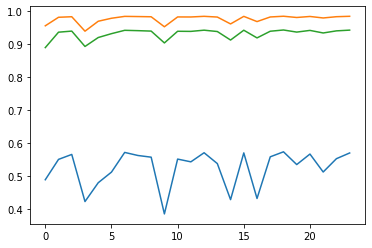

step: 0/3, D_loss: 1.2504241, G_loss_U: 1.3722895, G_loss_S: 0.010154293, E_loss_t0: 1.9909141


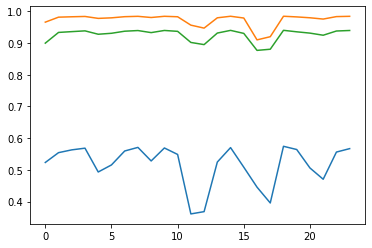

step: 0/3, D_loss: 1.1472769, G_loss_U: 1.5940518, G_loss_S: 0.01165973, E_loss_t0: 2.0464747


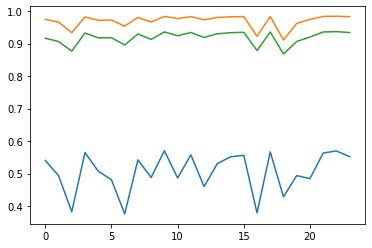

step: 0/3, D_loss: 1.0814797, G_loss_U: 1.7070489, G_loss_S: 0.013062331, E_loss_t0: 2.0016983


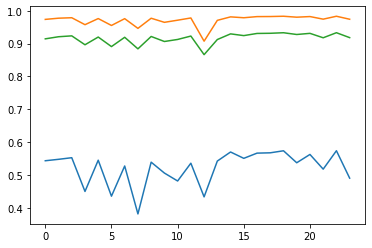

step: 0/3, D_loss: 0.9785727, G_loss_U: 1.7627751, G_loss_S: 0.015120059, E_loss_t0: 2.020244


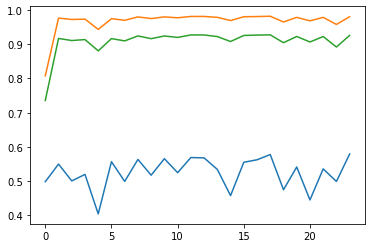

step: 0/3, D_loss: 0.8461232, G_loss_U: 1.769868, G_loss_S: 0.017465314, E_loss_t0: 1.9534955


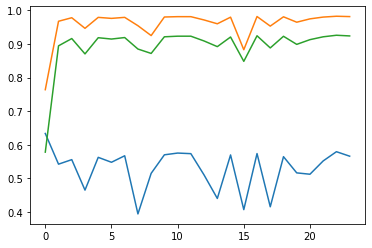

step: 0/3, D_loss: 0.7385611, G_loss_U: 1.786737, G_loss_S: 0.020192398, E_loss_t0: 1.9715891


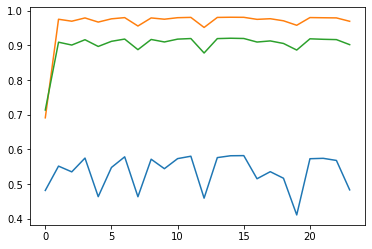

step: 0/3, D_loss: 0.6639837, G_loss_U: 1.8488461, G_loss_S: 0.023013797, E_loss_t0: 1.9783309


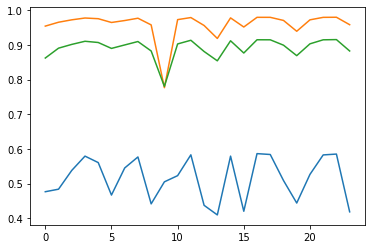

step: 0/3, D_loss: 0.5927714, G_loss_U: 1.9845539, G_loss_S: 0.026159523, E_loss_t0: 2.0046487


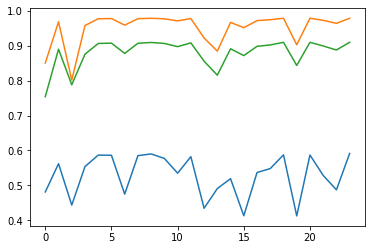

step: 0/3, D_loss: 0.52262354, G_loss_U: 2.168134, G_loss_S: 0.028976286, E_loss_t0: 2.002167


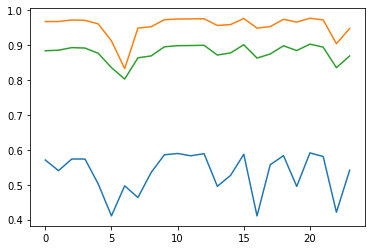

step: 0/3, D_loss: 0.46565133, G_loss_U: 2.3263953, G_loss_S: 0.031659253, E_loss_t0: 1.9926976


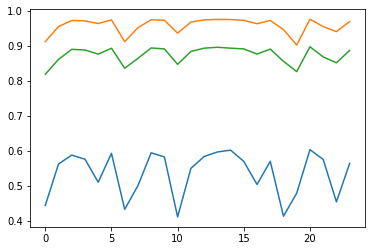

step: 0/3, D_loss: 0.4253391, G_loss_U: 2.4782703, G_loss_S: 0.034110937, E_loss_t0: 1.9714212


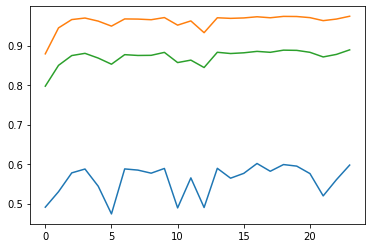

step: 0/3, D_loss: 0.38065204, G_loss_U: 2.5965517, G_loss_S: 0.03624963, E_loss_t0: 1.9384369


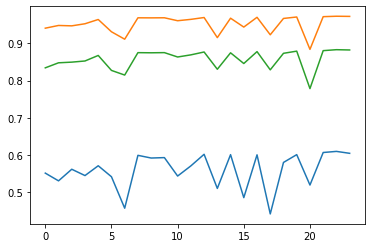

step: 0/3, D_loss: 0.3524521, G_loss_U: 2.700056, G_loss_S: 0.038603827, E_loss_t0: 1.9658077


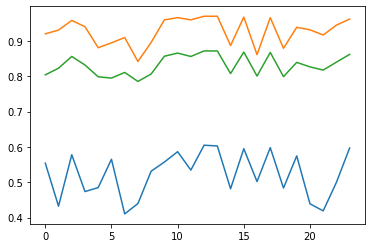

step: 0/3, D_loss: 0.32280335, G_loss_U: 2.7856805, G_loss_S: 0.040029008, E_loss_t0: 1.8991272


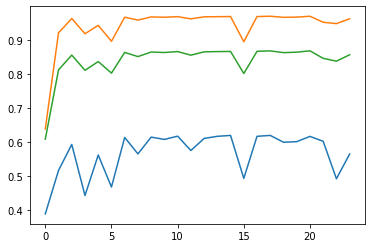

step: 0/3, D_loss: 0.29962558, G_loss_U: 2.8833714, G_loss_S: 0.04196046, E_loss_t0: 1.904729


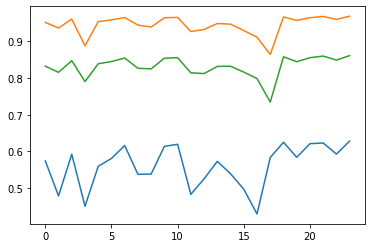

step: 0/3, D_loss: 0.27816042, G_loss_U: 2.9500015, G_loss_S: 0.043379195, E_loss_t0: 1.9188105


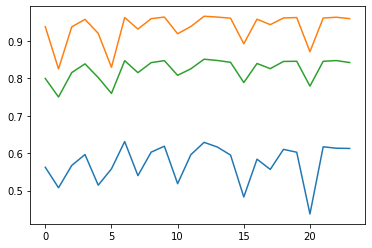

step: 0/3, D_loss: 0.25996682, G_loss_U: 3.020934, G_loss_S: 0.04441502, E_loss_t0: 1.9224371


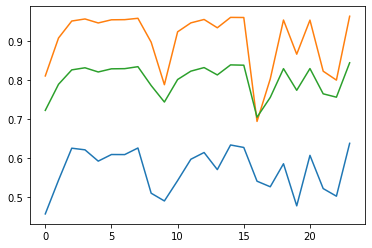

step: 0/3, D_loss: 0.24249573, G_loss_U: 3.1017764, G_loss_S: 0.04619799, E_loss_t0: 1.9470967


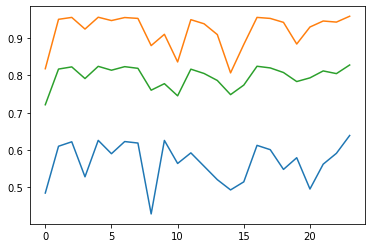

step: 0/3, D_loss: 0.22668763, G_loss_U: 3.1737368, G_loss_S: 0.04706015, E_loss_t0: 1.8771591


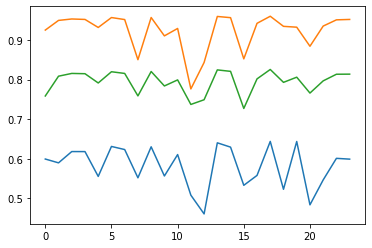

step: 0/3, D_loss: 0.21558368, G_loss_U: 3.214305, G_loss_S: 0.047601983, E_loss_t0: 1.8766954


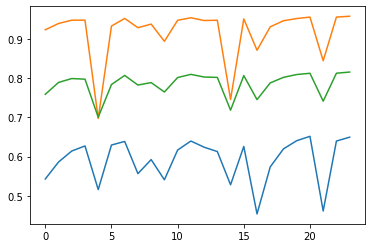

step: 0/3, D_loss: 0.20067045, G_loss_U: 3.2903078, G_loss_S: 0.048131015, E_loss_t0: 1.8746707


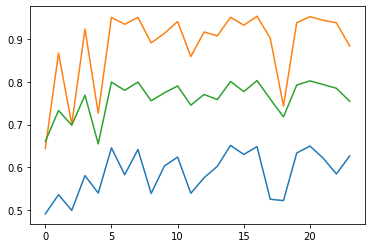

step: 0/3, D_loss: 0.19030036, G_loss_U: 3.3447425, G_loss_S: 0.048324145, E_loss_t0: 1.8366029


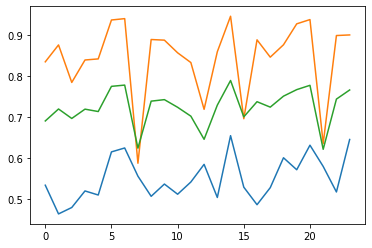

step: 0/3, D_loss: 0.1775952, G_loss_U: 3.4158275, G_loss_S: 0.04862728, E_loss_t0: 1.797333


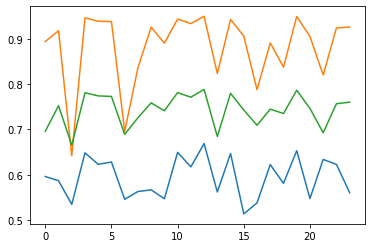

step: 0/3, D_loss: 0.17233685, G_loss_U: 3.4636147, G_loss_S: 0.048968587, E_loss_t0: 1.8254262


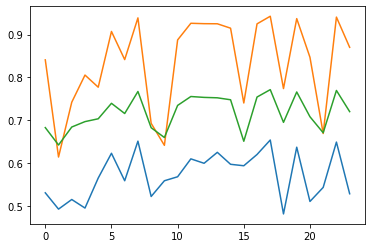

step: 0/3, D_loss: 0.15966909, G_loss_U: 3.518446, G_loss_S: 0.048803594, E_loss_t0: 1.7787714


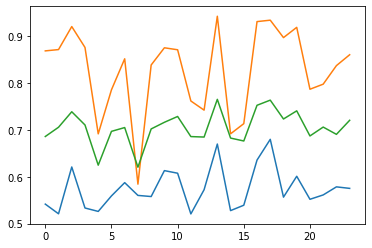

step: 0/3, D_loss: 0.15505269, G_loss_U: 3.5740573, G_loss_S: 0.048923373, E_loss_t0: 1.7664832


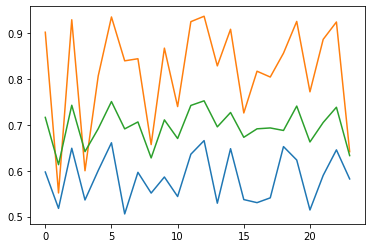

step: 0/3, D_loss: 0.14607124, G_loss_U: 3.5749733, G_loss_S: 0.048739713, E_loss_t0: 1.8161352


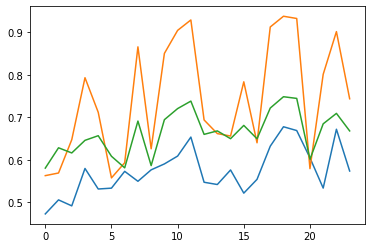

step: 0/3, D_loss: 0.14531131, G_loss_U: 3.5597403, G_loss_S: 0.048293687, E_loss_t0: 1.7661233


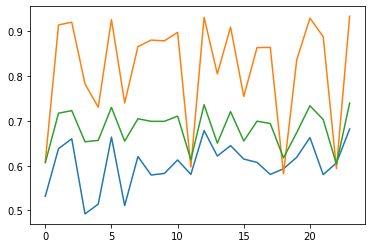

step: 0/3, D_loss: 0.14706591, G_loss_U: 3.5753067, G_loss_S: 0.047423378, E_loss_t0: 1.7317842


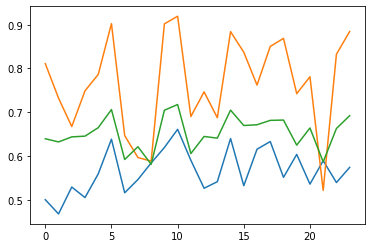

step: 0/3, D_loss: 0.14527448, G_loss_U: 3.5664194, G_loss_S: 0.047025576, E_loss_t0: 1.7425586


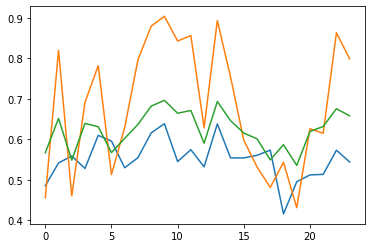

step: 0/3, D_loss: 0.14549167, G_loss_U: 3.5614417, G_loss_S: 0.046842143, E_loss_t0: 1.7618687


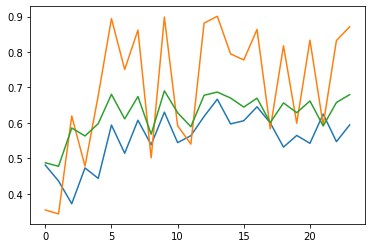

step: 0/3, D_loss: 0.14578621, G_loss_U: 3.5729856, G_loss_S: 0.046010837, E_loss_t0: 1.7538688


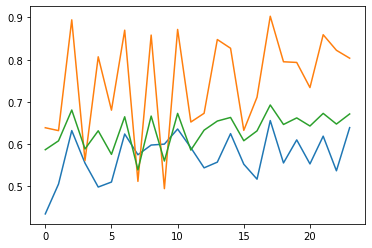

step: 0/3, D_loss: 0.1454024, G_loss_U: 3.5709145, G_loss_S: 0.045455012, E_loss_t0: 1.7290697


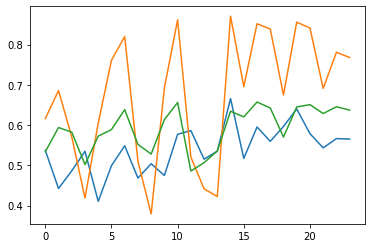

step: 0/3, D_loss: 0.1470825, G_loss_U: 3.5713205, G_loss_S: 0.044438437, E_loss_t0: 1.7225903


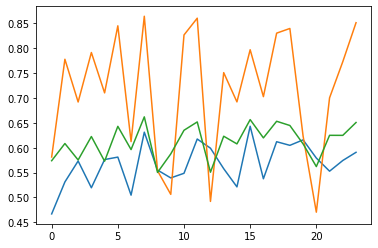

step: 0/3, D_loss: 0.14469875, G_loss_U: 3.5665424, G_loss_S: 0.043478496, E_loss_t0: 1.7046872


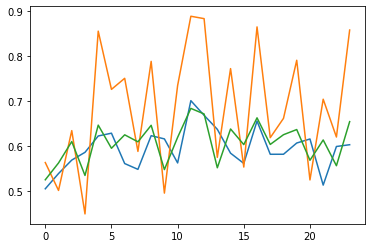

step: 0/3, D_loss: 0.14388026, G_loss_U: 3.5601826, G_loss_S: 0.042468335, E_loss_t0: 1.6962147


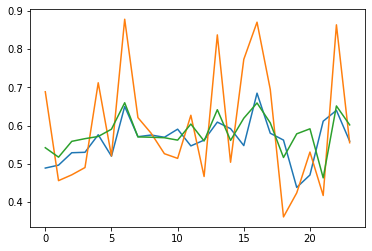

step: 0/3, D_loss: 0.14655988, G_loss_U: 3.576998, G_loss_S: 0.041519612, E_loss_t0: 1.7129562


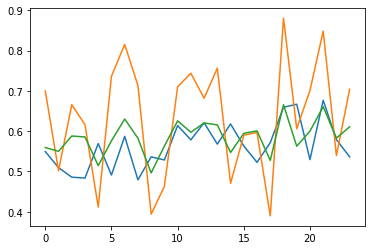

step: 0/3, D_loss: 0.14528124, G_loss_U: 3.572035, G_loss_S: 0.040471442, E_loss_t0: 1.7329555


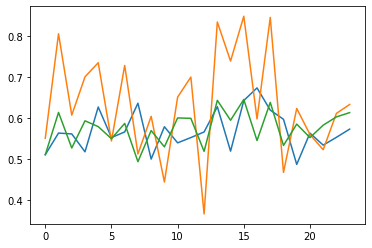

step: 0/3, D_loss: 0.14804715, G_loss_U: 3.5602913, G_loss_S: 0.039915796, E_loss_t0: 1.721533


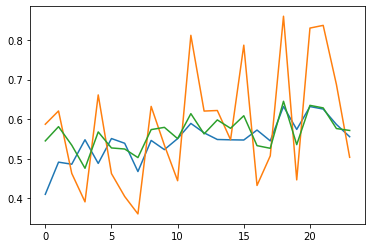

step: 0/3, D_loss: 0.14626825, G_loss_U: 3.5685015, G_loss_S: 0.039306227, E_loss_t0: 1.7267178


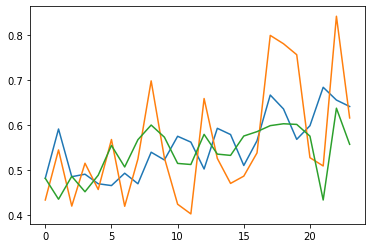

step: 0/3, D_loss: 0.14886841, G_loss_U: 3.563817, G_loss_S: 0.03803287, E_loss_t0: 1.6921333


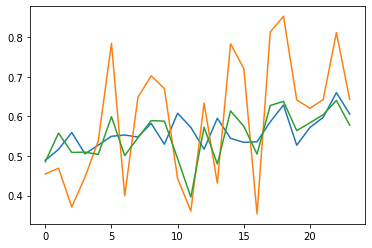

step: 0/3, D_loss: 0.14822799, G_loss_U: 3.567355, G_loss_S: 0.036855966, E_loss_t0: 1.7296318


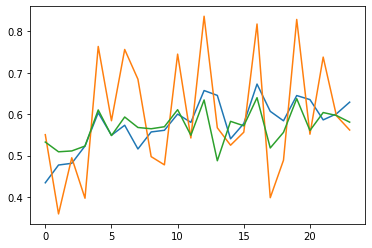

step: 0/3, D_loss: 0.1474878, G_loss_U: 3.5570533, G_loss_S: 0.03602387, E_loss_t0: 1.7042836


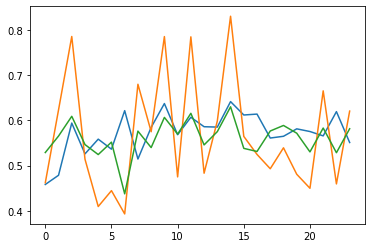

step: 0/3, D_loss: 0.14844126, G_loss_U: 3.5549753, G_loss_S: 0.035131536, E_loss_t0: 1.6970733


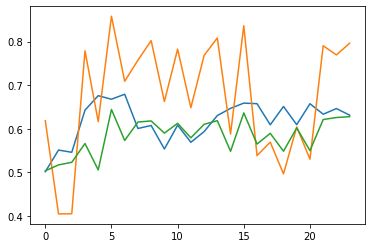

step: 0/3, D_loss: 0.15141304, G_loss_U: 3.622116, G_loss_S: 0.034477636, E_loss_t0: 1.6973941


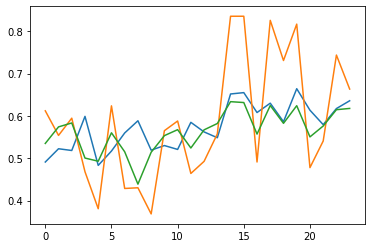

step: 0/3, D_loss: 0.14412533, G_loss_U: 3.6253529, G_loss_S: 0.03352607, E_loss_t0: 1.7070401


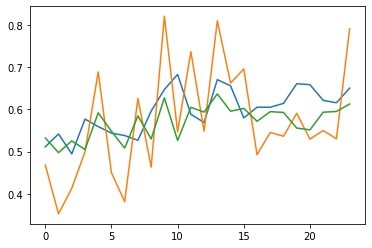

step: 0/3, D_loss: 0.14449444, G_loss_U: 3.6260414, G_loss_S: 0.032825664, E_loss_t0: 1.7166679


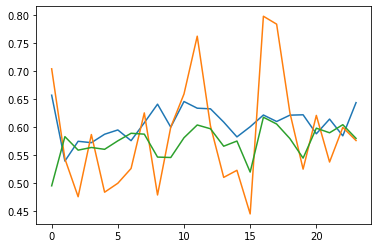

step: 0/3, D_loss: 0.14300996, G_loss_U: 3.6086607, G_loss_S: 0.031878706, E_loss_t0: 1.689673


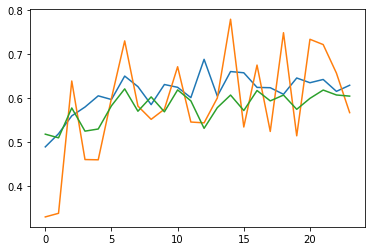

step: 0/3, D_loss: 0.14657232, G_loss_U: 3.6197252, G_loss_S: 0.031255048, E_loss_t0: 1.7163887


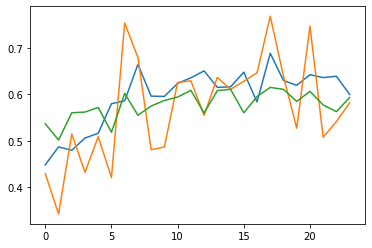

step: 0/3, D_loss: 0.14455964, G_loss_U: 3.6150846, G_loss_S: 0.029997673, E_loss_t0: 1.6845032


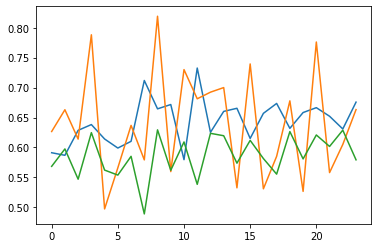

step: 0/3, D_loss: 0.14669552, G_loss_U: 3.6136665, G_loss_S: 0.029508423, E_loss_t0: 1.7148703


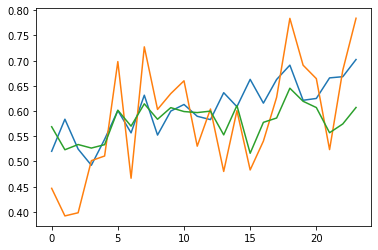

step: 0/3, D_loss: 0.14710294, G_loss_U: 3.611621, G_loss_S: 0.028745566, E_loss_t0: 1.6871012


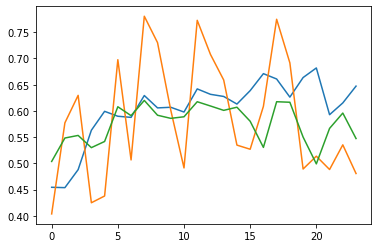

step: 0/3, D_loss: 0.14550349, G_loss_U: 3.6130095, G_loss_S: 0.028041732, E_loss_t0: 1.6865368


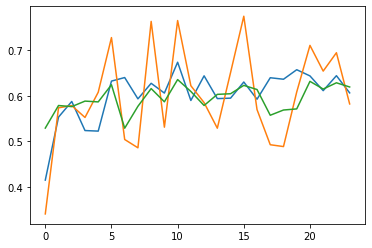

step: 0/3, D_loss: 0.14692935, G_loss_U: 3.6295955, G_loss_S: 0.027042247, E_loss_t0: 1.6868793


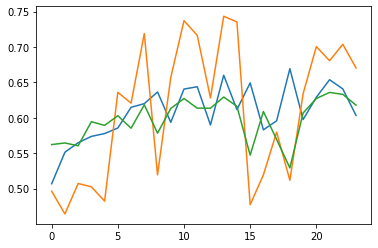

step: 0/3, D_loss: 0.1481473, G_loss_U: 3.611477, G_loss_S: 0.026571546, E_loss_t0: 1.6981808


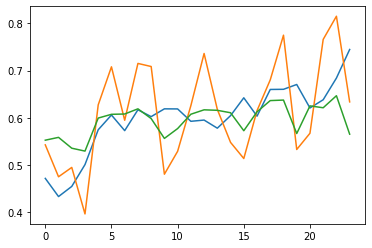

step: 0/3, D_loss: 0.14519797, G_loss_U: 3.6142008, G_loss_S: 0.025912628, E_loss_t0: 1.6400613


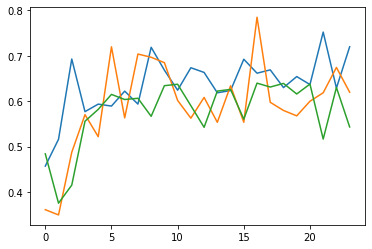

step: 0/3, D_loss: 0.14641431, G_loss_U: 3.6152031, G_loss_S: 0.02521977, E_loss_t0: 1.6976409


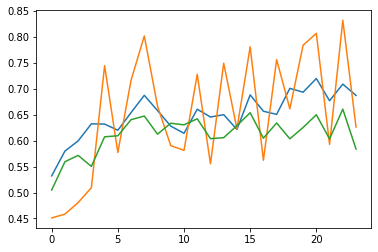

step: 0/3, D_loss: 0.14693385, G_loss_U: 3.6138313, G_loss_S: 0.024227718, E_loss_t0: 1.6587323


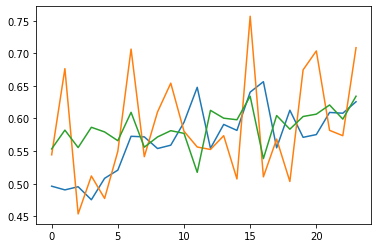

step: 1/3, D_loss: 0.1488697, G_loss_U: 3.530301, G_loss_S: 0.022640651, E_loss_t0: 1.6835679


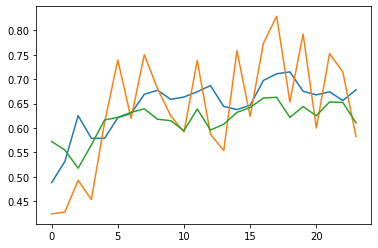

step: 1/3, D_loss: 0.14740238, G_loss_U: 3.5332782, G_loss_S: 0.022385791, E_loss_t0: 1.7034343


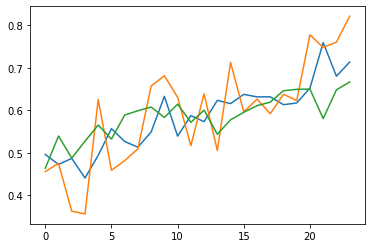

step: 1/3, D_loss: 0.14612065, G_loss_U: 3.5568945, G_loss_S: 0.021911802, E_loss_t0: 1.6764991


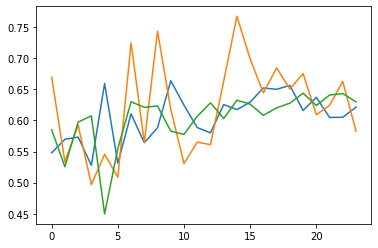

step: 1/3, D_loss: 0.14621384, G_loss_U: 3.5553818, G_loss_S: 0.021290505, E_loss_t0: 1.6317579


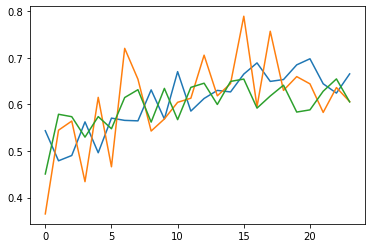

step: 1/3, D_loss: 0.1469192, G_loss_U: 3.5393536, G_loss_S: 0.020913105, E_loss_t0: 1.6879267


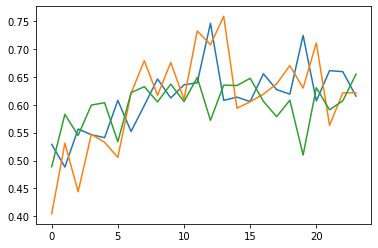

step: 1/3, D_loss: 0.14993872, G_loss_U: 3.5454168, G_loss_S: 0.020221882, E_loss_t0: 1.6395627


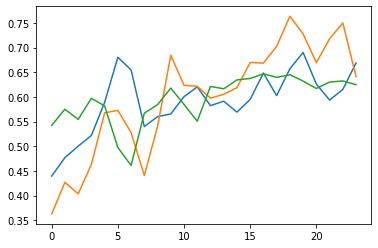

step: 1/3, D_loss: 0.1518017, G_loss_U: 3.4790428, G_loss_S: 0.020252619, E_loss_t0: 1.7012362


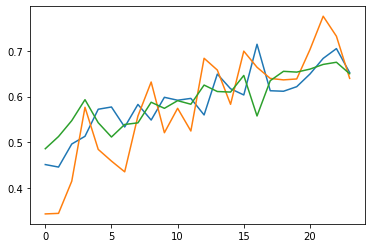

step: 1/3, D_loss: 0.15316162, G_loss_U: 3.4165351, G_loss_S: 0.019719562, E_loss_t0: 1.7056626


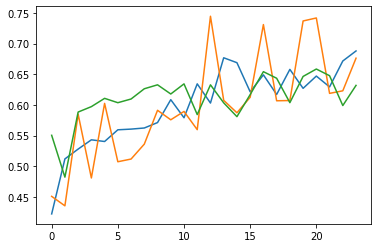

step: 1/3, D_loss: 0.16011716, G_loss_U: 3.3744175, G_loss_S: 0.019434378, E_loss_t0: 1.7071586


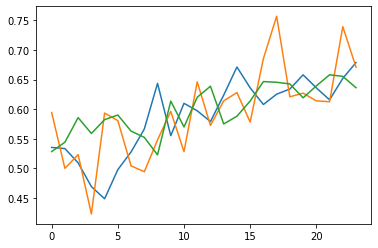

step: 1/3, D_loss: 0.16623735, G_loss_U: 3.3525836, G_loss_S: 0.01884876, E_loss_t0: 1.6542822


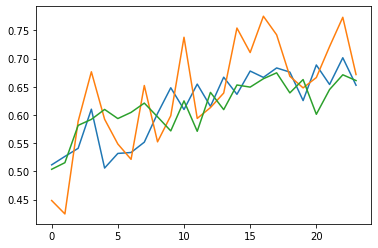

step: 1/3, D_loss: 0.16835459, G_loss_U: 3.3817348, G_loss_S: 0.0185148, E_loss_t0: 1.6409076


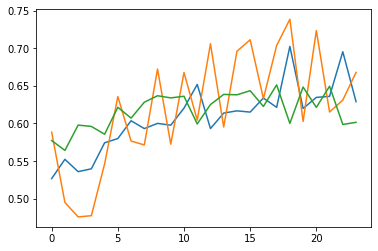

step: 1/3, D_loss: 0.16188186, G_loss_U: 3.4168327, G_loss_S: 0.018047266, E_loss_t0: 1.6668137


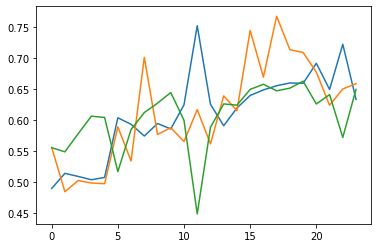

step: 1/3, D_loss: 0.15897994, G_loss_U: 3.431366, G_loss_S: 0.017794933, E_loss_t0: 1.6833854


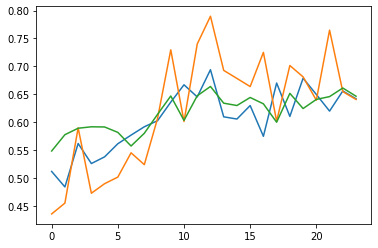

step: 1/3, D_loss: 0.14539391, G_loss_U: 3.4455652, G_loss_S: 0.017305315, E_loss_t0: 1.65311


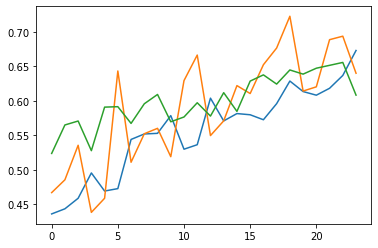

step: 1/3, D_loss: 0.14908515, G_loss_U: 3.4521964, G_loss_S: 0.017469663, E_loss_t0: 1.6663637


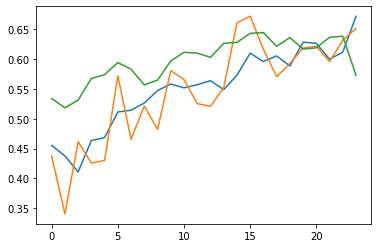

step: 1/3, D_loss: 0.15111443, G_loss_U: 3.4886396, G_loss_S: 0.0166528, E_loss_t0: 1.690631


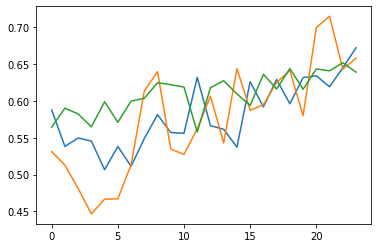

step: 1/3, D_loss: 0.14828429, G_loss_U: 3.4985964, G_loss_S: 0.01647383, E_loss_t0: 1.6732194


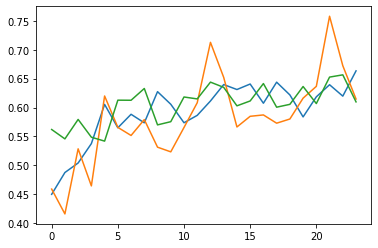

step: 1/3, D_loss: 0.14874518, G_loss_U: 3.503898, G_loss_S: 0.016292814, E_loss_t0: 1.7059671


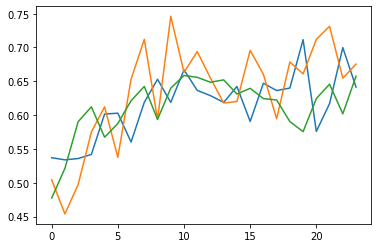

step: 1/3, D_loss: 0.14759272, G_loss_U: 3.493004, G_loss_S: 0.015741033, E_loss_t0: 1.6687896


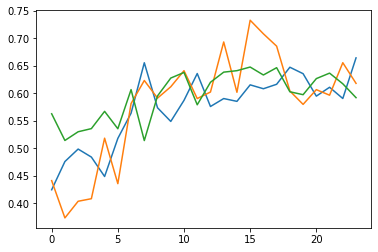

step: 1/3, D_loss: 0.1496172, G_loss_U: 3.4876373, G_loss_S: 0.015642023, E_loss_t0: 1.6800597


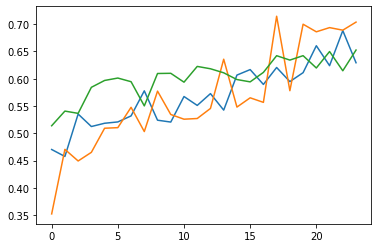

step: 1/3, D_loss: 0.14913963, G_loss_U: 3.493743, G_loss_S: 0.015495943, E_loss_t0: 1.6664937


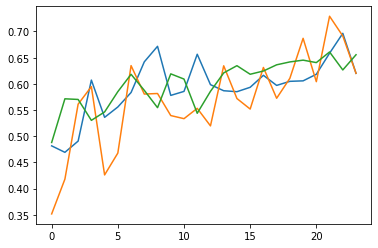

step: 1/3, D_loss: 0.14979376, G_loss_U: 3.4978774, G_loss_S: 0.015102454, E_loss_t0: 1.6687573


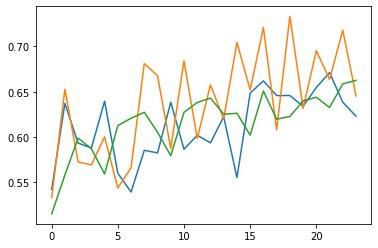

step: 1/3, D_loss: 0.14756495, G_loss_U: 3.493687, G_loss_S: 0.014582908, E_loss_t0: 1.6713415


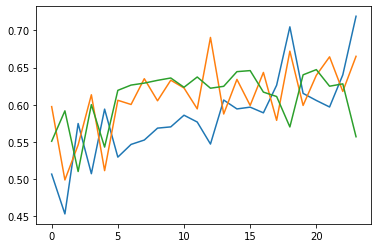

step: 1/3, D_loss: 0.14734644, G_loss_U: 3.4885266, G_loss_S: 0.014343225, E_loss_t0: 1.6596469


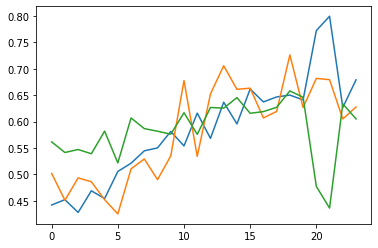

step: 1/3, D_loss: 0.14729704, G_loss_U: 3.4951613, G_loss_S: 0.014165992, E_loss_t0: 1.6845369


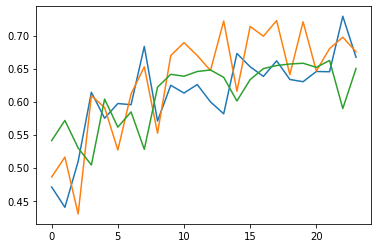

step: 1/3, D_loss: 0.1517276, G_loss_U: 3.523463, G_loss_S: 0.013916905, E_loss_t0: 1.6726103


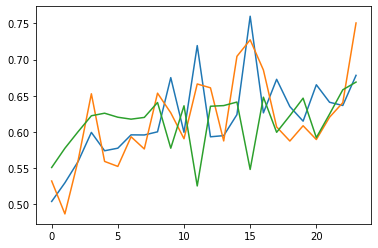

step: 1/3, D_loss: 0.14665931, G_loss_U: 3.5143998, G_loss_S: 0.013704408, E_loss_t0: 1.6916314


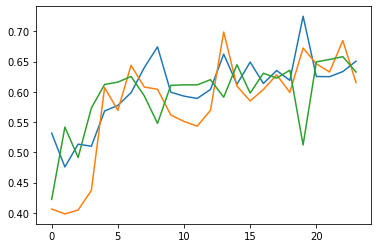

step: 1/3, D_loss: 0.14661913, G_loss_U: 3.5202549, G_loss_S: 0.013753842, E_loss_t0: 1.6873633


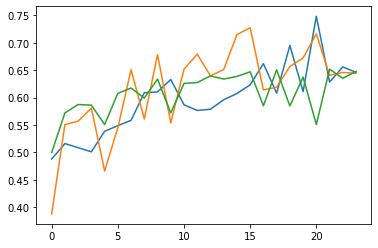

step: 1/3, D_loss: 0.14477725, G_loss_U: 3.519624, G_loss_S: 0.013194886, E_loss_t0: 1.6598847


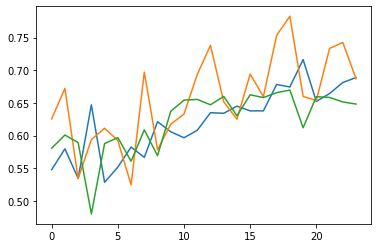

step: 1/3, D_loss: 0.14558533, G_loss_U: 3.5222466, G_loss_S: 0.013014261, E_loss_t0: 1.6719975


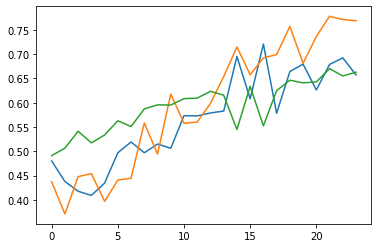

step: 1/3, D_loss: 0.14541687, G_loss_U: 3.518528, G_loss_S: 0.0127982935, E_loss_t0: 1.6627936


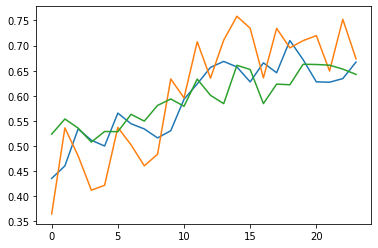

step: 1/3, D_loss: 0.14659673, G_loss_U: 3.521185, G_loss_S: 0.0125468215, E_loss_t0: 1.6743281


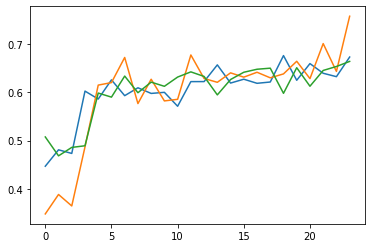

step: 1/3, D_loss: 0.14692928, G_loss_U: 3.5157154, G_loss_S: 0.012374411, E_loss_t0: 1.6655499


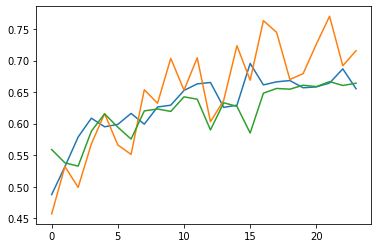

step: 1/3, D_loss: 0.14594807, G_loss_U: 3.5201654, G_loss_S: 0.012136876, E_loss_t0: 1.6619412


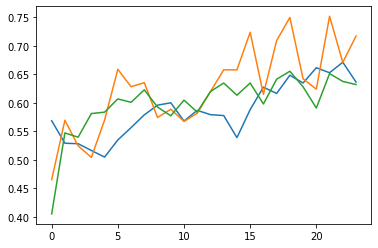

step: 1/3, D_loss: 0.15005276, G_loss_U: 3.5491238, G_loss_S: 0.012008402, E_loss_t0: 1.6912813


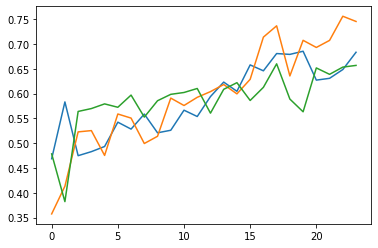

step: 1/3, D_loss: 0.14567511, G_loss_U: 3.5547144, G_loss_S: 0.011713312, E_loss_t0: 1.6621914


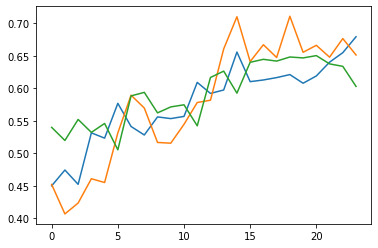

step: 1/3, D_loss: 0.14627627, G_loss_U: 3.550213, G_loss_S: 0.011481072, E_loss_t0: 1.6620562


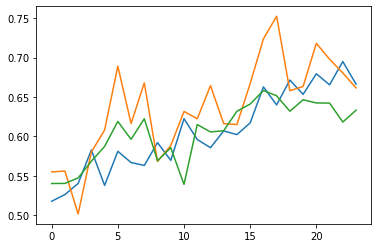

step: 1/3, D_loss: 0.14652477, G_loss_U: 3.5530035, G_loss_S: 0.011272748, E_loss_t0: 1.6705173


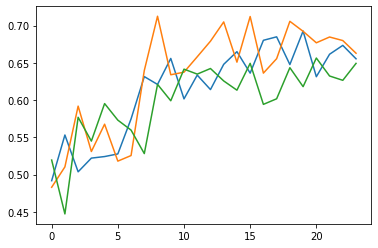

step: 1/3, D_loss: 0.14630002, G_loss_U: 3.543563, G_loss_S: 0.010976866, E_loss_t0: 1.6506999


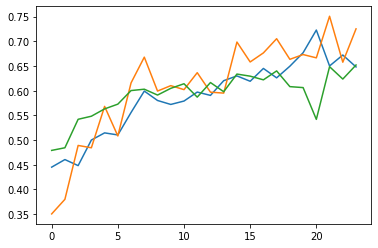

step: 1/3, D_loss: 0.14764103, G_loss_U: 3.5576775, G_loss_S: 0.010961124, E_loss_t0: 1.6908423


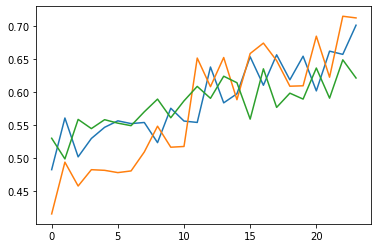

step: 1/3, D_loss: 0.14747953, G_loss_U: 3.551303, G_loss_S: 0.010716743, E_loss_t0: 1.6443788


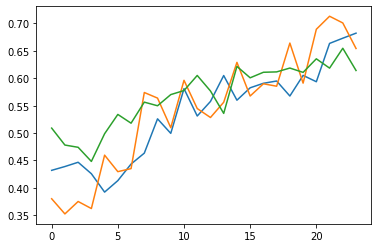

step: 1/3, D_loss: 0.14786214, G_loss_U: 3.541055, G_loss_S: 0.010653105, E_loss_t0: 1.6381365


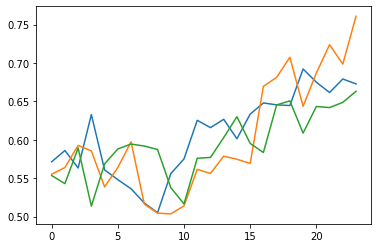

step: 1/3, D_loss: 0.14977355, G_loss_U: 3.5501125, G_loss_S: 0.010555042, E_loss_t0: 1.6521193


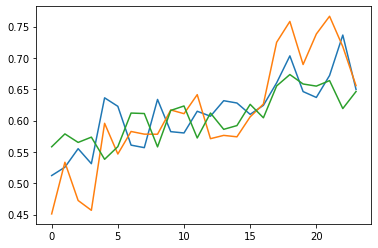

step: 1/3, D_loss: 0.14831206, G_loss_U: 3.5583858, G_loss_S: 0.010261859, E_loss_t0: 1.6598485


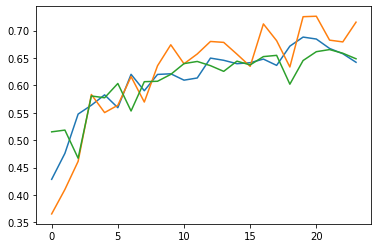

step: 1/3, D_loss: 0.14599264, G_loss_U: 3.5571773, G_loss_S: 0.010103543, E_loss_t0: 1.672062


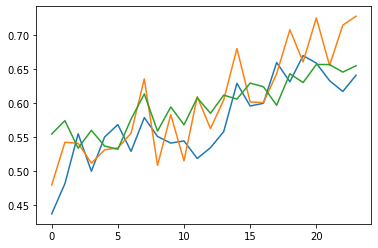

step: 1/3, D_loss: 0.15114315, G_loss_U: 3.5732567, G_loss_S: 0.009926127, E_loss_t0: 1.6565648


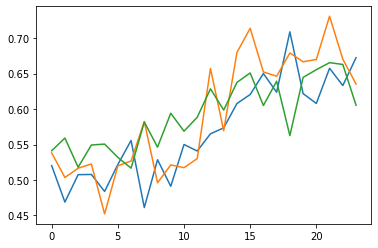

step: 1/3, D_loss: 0.14878684, G_loss_U: 3.588003, G_loss_S: 0.009737584, E_loss_t0: 1.6474458


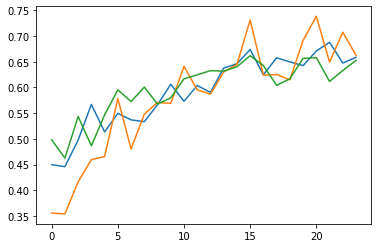

step: 1/3, D_loss: 0.14858109, G_loss_U: 3.5833828, G_loss_S: 0.009644643, E_loss_t0: 1.6428539


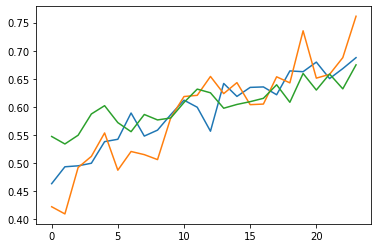

step: 1/3, D_loss: 0.15243292, G_loss_U: 3.6027727, G_loss_S: 0.00961901, E_loss_t0: 1.6517652


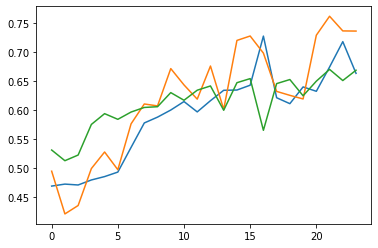

step: 1/3, D_loss: 0.15161605, G_loss_U: 3.6148863, G_loss_S: 0.009336101, E_loss_t0: 1.6670634


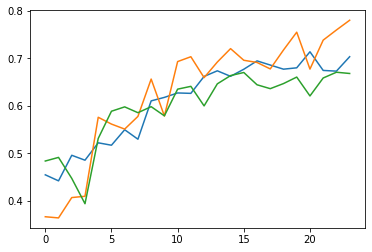

step: 1/3, D_loss: 0.14600007, G_loss_U: 3.6158884, G_loss_S: 0.009350125, E_loss_t0: 1.6385093


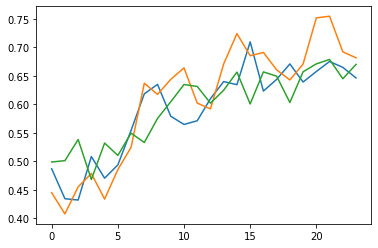

step: 1/3, D_loss: 0.14983109, G_loss_U: 3.6149654, G_loss_S: 0.009205783, E_loss_t0: 1.6321026


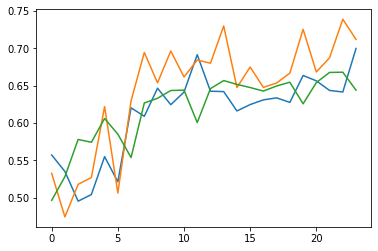

step: 1/3, D_loss: 0.15095268, G_loss_U: 3.6233342, G_loss_S: 0.009155437, E_loss_t0: 1.6862856


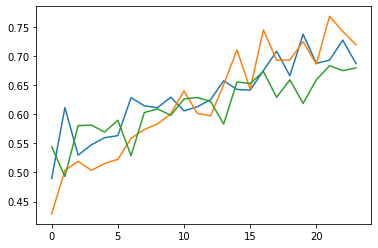

step: 1/3, D_loss: 0.14505412, G_loss_U: 3.61953, G_loss_S: 0.009358354, E_loss_t0: 1.7066263


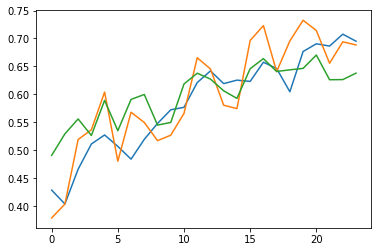

step: 1/3, D_loss: 0.14400627, G_loss_U: 3.625598, G_loss_S: 0.00932159, E_loss_t0: 1.6812936


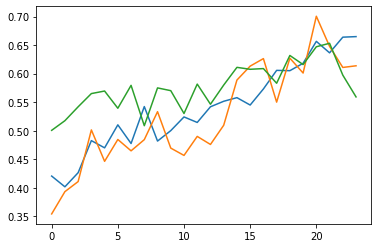

step: 1/3, D_loss: 0.14184195, G_loss_U: 3.632469, G_loss_S: 0.009373986, E_loss_t0: 1.6624166


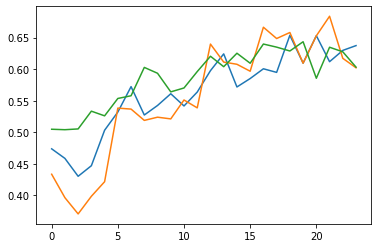

step: 1/3, D_loss: 0.14242712, G_loss_U: 3.6289532, G_loss_S: 0.009304963, E_loss_t0: 1.6614828


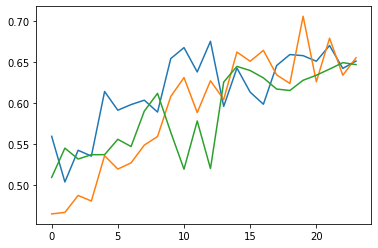

step: 1/3, D_loss: 0.14330135, G_loss_U: 3.6152925, G_loss_S: 0.009278897, E_loss_t0: 1.6744936


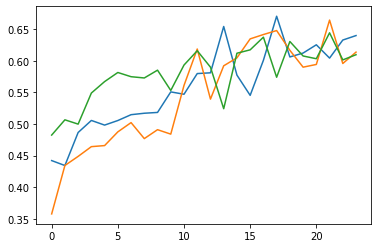

step: 1/3, D_loss: 0.1454567, G_loss_U: 3.6211216, G_loss_S: 0.009226016, E_loss_t0: 1.6696972


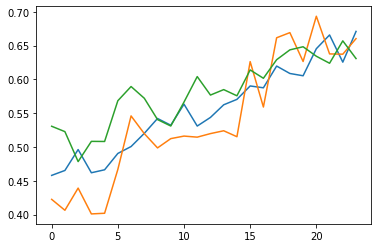

step: 1/3, D_loss: 0.14325346, G_loss_U: 3.627059, G_loss_S: 0.009222916, E_loss_t0: 1.6845014


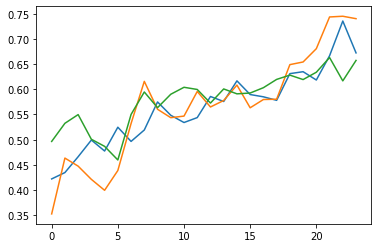

step: 1/3, D_loss: 0.1408752, G_loss_U: 3.6254103, G_loss_S: 0.009110104, E_loss_t0: 1.6535759


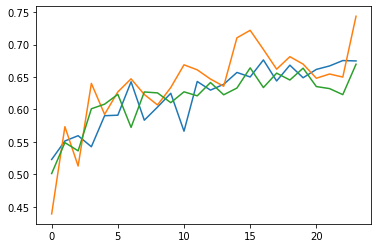

step: 1/3, D_loss: 0.14605045, G_loss_U: 3.6208858, G_loss_S: 0.009045856, E_loss_t0: 1.6448405


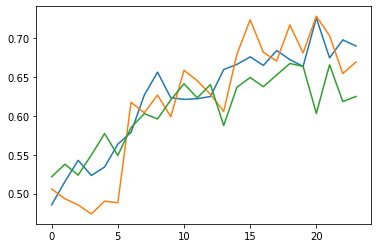

step: 1/3, D_loss: 0.14085971, G_loss_U: 3.625748, G_loss_S: 0.009091035, E_loss_t0: 1.6572618


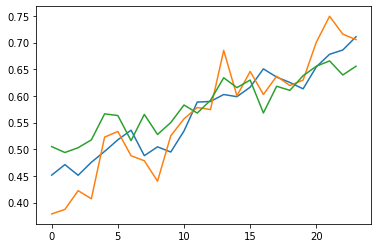

step: 1/3, D_loss: 0.14381292, G_loss_U: 3.6212237, G_loss_S: 0.008964971, E_loss_t0: 1.6587584


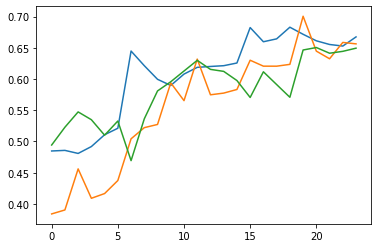

step: 1/3, D_loss: 0.1444477, G_loss_U: 3.6324654, G_loss_S: 0.008734339, E_loss_t0: 1.6521609


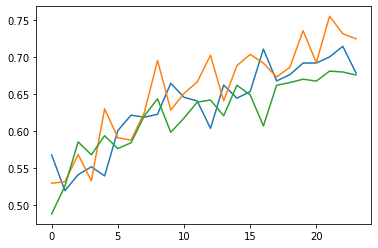

step: 1/3, D_loss: 0.14337225, G_loss_U: 3.6168137, G_loss_S: 0.008865145, E_loss_t0: 1.6743284


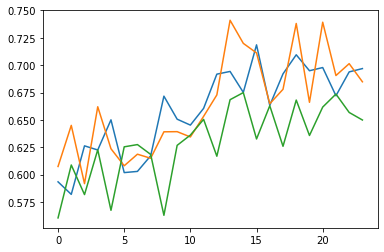

step: 1/3, D_loss: 0.14351448, G_loss_U: 3.6284292, G_loss_S: 0.008716066, E_loss_t0: 1.6531771


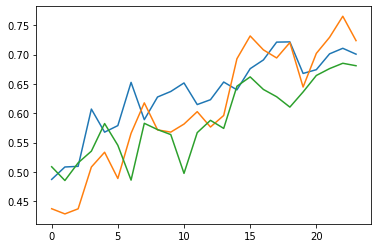

step: 1/3, D_loss: 0.14405109, G_loss_U: 3.6093216, G_loss_S: 0.008667253, E_loss_t0: 1.6700554


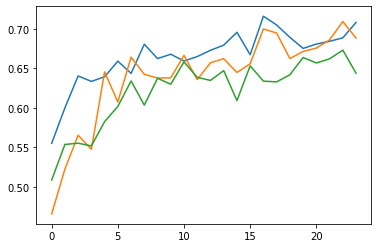

step: 1/3, D_loss: 0.14284314, G_loss_U: 3.613306, G_loss_S: 0.008615257, E_loss_t0: 1.6706412


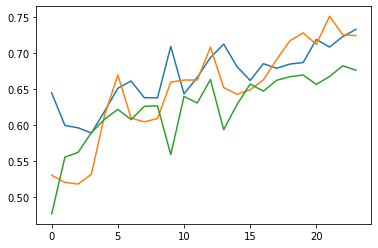

step: 1/3, D_loss: 0.14237943, G_loss_U: 3.622203, G_loss_S: 0.008380042, E_loss_t0: 1.6906391


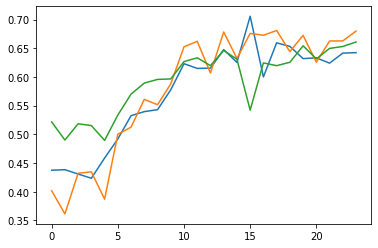

step: 1/3, D_loss: 0.1445247, G_loss_U: 3.6282485, G_loss_S: 0.008455627, E_loss_t0: 1.6609228


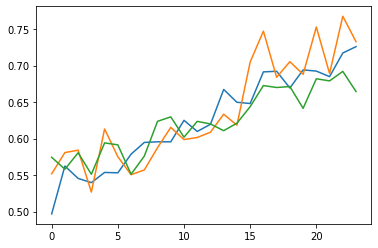

step: 1/3, D_loss: 0.14215931, G_loss_U: 3.621432, G_loss_S: 0.008261014, E_loss_t0: 1.6459334


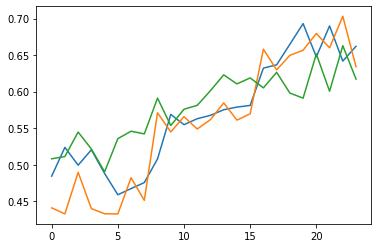

step: 1/3, D_loss: 0.14423656, G_loss_U: 3.626016, G_loss_S: 0.008010413, E_loss_t0: 1.658747


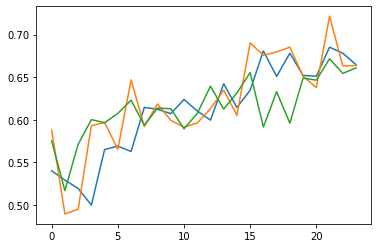

step: 1/3, D_loss: 0.1411108, G_loss_U: 3.63329, G_loss_S: 0.008033726, E_loss_t0: 1.6769835


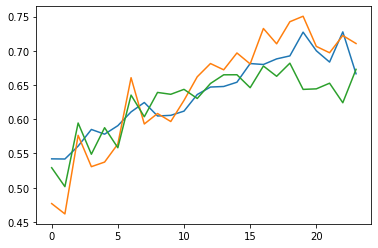

step: 1/3, D_loss: 0.14221157, G_loss_U: 3.6187994, G_loss_S: 0.007939432, E_loss_t0: 1.6864185


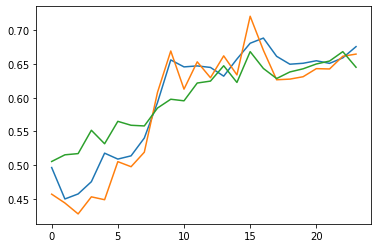

step: 1/3, D_loss: 0.14520772, G_loss_U: 3.6301181, G_loss_S: 0.007796238, E_loss_t0: 1.6356218


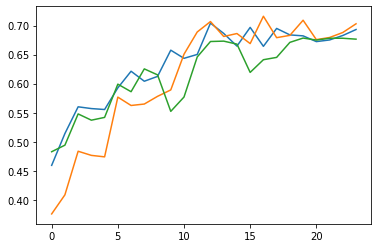

step: 1/3, D_loss: 0.14732875, G_loss_U: 3.6199782, G_loss_S: 0.0076863547, E_loss_t0: 1.6884727


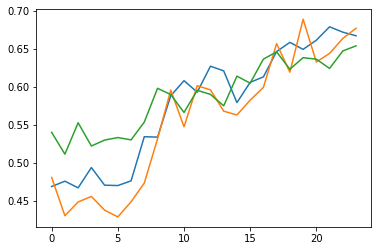

step: 1/3, D_loss: 0.14553474, G_loss_U: 3.6236947, G_loss_S: 0.007496258, E_loss_t0: 1.698456


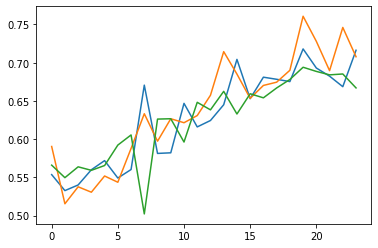

step: 1/3, D_loss: 0.14683549, G_loss_U: 3.6270924, G_loss_S: 0.007469003, E_loss_t0: 1.657465


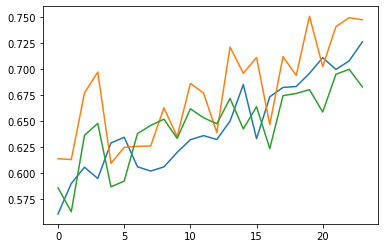

step: 1/3, D_loss: 0.14567354, G_loss_U: 3.6185277, G_loss_S: 0.0074850065, E_loss_t0: 1.7139313


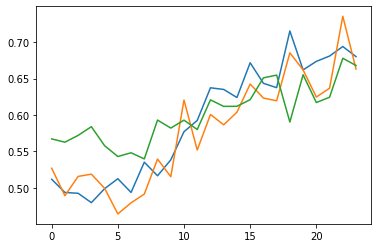

step: 1/3, D_loss: 0.1468665, G_loss_U: 3.6222808, G_loss_S: 0.0072927154, E_loss_t0: 1.6774124


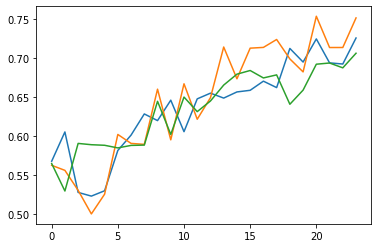

step: 1/3, D_loss: 0.15360954, G_loss_U: 3.6118202, G_loss_S: 0.007201676, E_loss_t0: 1.668291


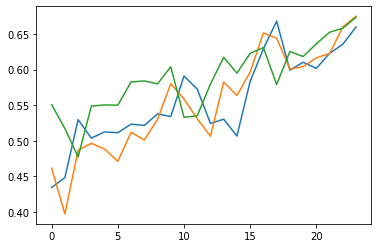

step: 1/3, D_loss: 0.14183071, G_loss_U: 3.6101398, G_loss_S: 0.007312198, E_loss_t0: 1.6802464


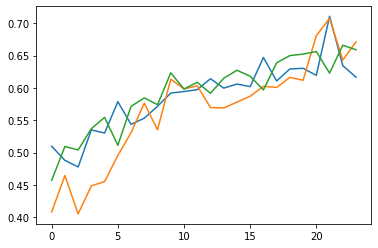

step: 1/3, D_loss: 0.13829699, G_loss_U: 3.6209147, G_loss_S: 0.0074974345, E_loss_t0: 1.6368756


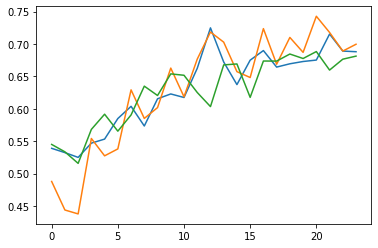

step: 1/3, D_loss: 0.13830955, G_loss_U: 3.615796, G_loss_S: 0.0075563043, E_loss_t0: 1.6773638


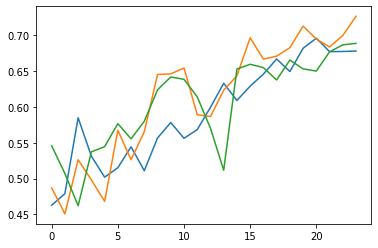

step: 1/3, D_loss: 0.13746962, G_loss_U: 3.6181247, G_loss_S: 0.007730497, E_loss_t0: 1.7013448


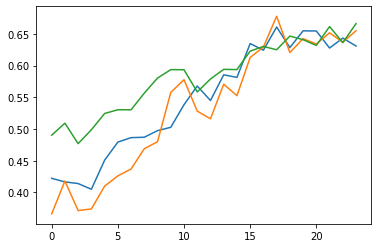

step: 1/3, D_loss: 0.13847758, G_loss_U: 3.6101887, G_loss_S: 0.0077911615, E_loss_t0: 1.6310103


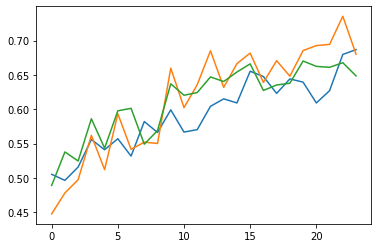

step: 1/3, D_loss: 0.14104813, G_loss_U: 3.6141644, G_loss_S: 0.007718156, E_loss_t0: 1.6653354


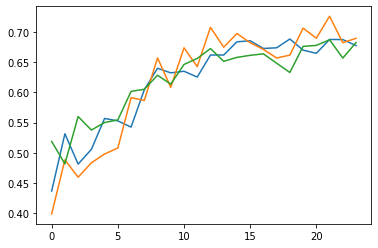

step: 1/3, D_loss: 0.14096703, G_loss_U: 3.6293335, G_loss_S: 0.007853936, E_loss_t0: 1.6700974


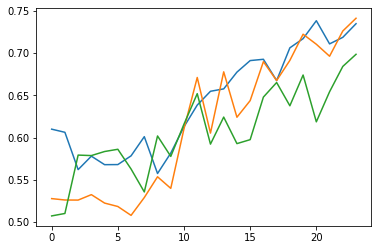

step: 1/3, D_loss: 0.13843179, G_loss_U: 3.6013157, G_loss_S: 0.007933764, E_loss_t0: 1.6519494


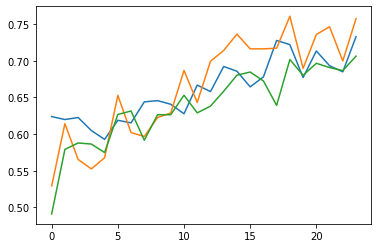

step: 1/3, D_loss: 0.13982314, G_loss_U: 3.6169631, G_loss_S: 0.007897185, E_loss_t0: 1.6494201


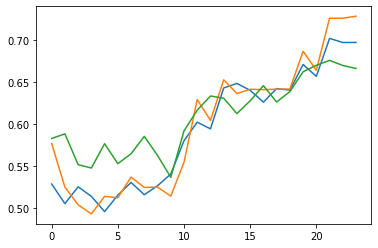

step: 1/3, D_loss: 0.13971268, G_loss_U: 3.6030035, G_loss_S: 0.007895842, E_loss_t0: 1.6295314


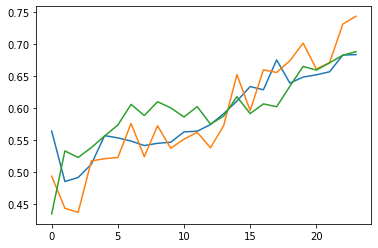

step: 1/3, D_loss: 0.13700788, G_loss_U: 3.6148098, G_loss_S: 0.007941131, E_loss_t0: 1.6845416


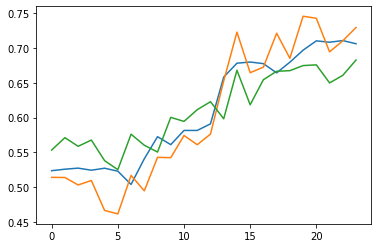

step: 1/3, D_loss: 0.1356433, G_loss_U: 3.609046, G_loss_S: 0.0077935117, E_loss_t0: 1.6436664


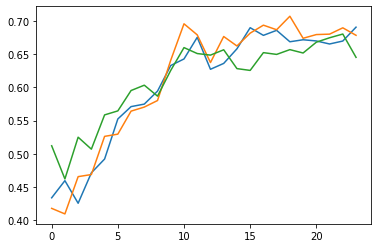

step: 1/3, D_loss: 0.13846551, G_loss_U: 3.6117241, G_loss_S: 0.007821847, E_loss_t0: 1.6622401


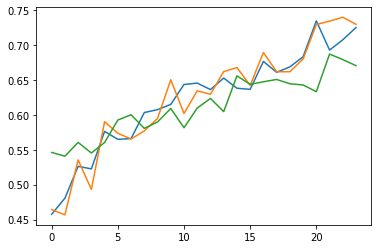

step: 1/3, D_loss: 0.13850348, G_loss_U: 3.6054761, G_loss_S: 0.007818734, E_loss_t0: 1.6834425


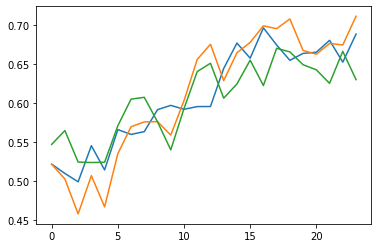

step: 1/3, D_loss: 0.1382444, G_loss_U: 3.619797, G_loss_S: 0.007853423, E_loss_t0: 1.6563604


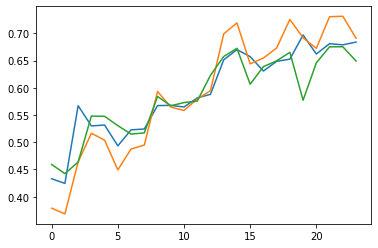

step: 1/3, D_loss: 0.13643438, G_loss_U: 3.6107159, G_loss_S: 0.007815644, E_loss_t0: 1.6595763


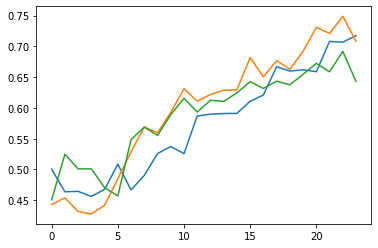

step: 1/3, D_loss: 0.13792062, G_loss_U: 3.6234004, G_loss_S: 0.007698501, E_loss_t0: 1.6841835


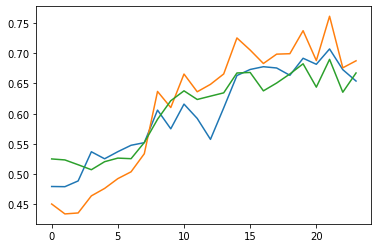

step: 1/3, D_loss: 0.1365243, G_loss_U: 3.6153402, G_loss_S: 0.0076475423, E_loss_t0: 1.6449778


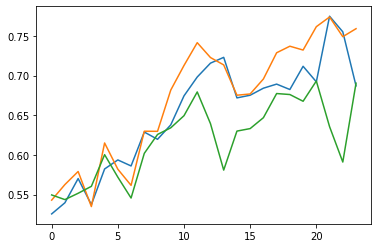

step: 2/3, D_loss: 0.15646835, G_loss_U: 3.0568826, G_loss_S: 0.0074295904, E_loss_t0: 1.6893984


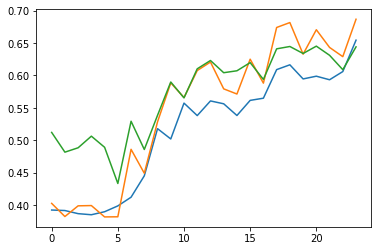

step: 2/3, D_loss: 0.22255124, G_loss_U: 3.1388588, G_loss_S: 0.007399195, E_loss_t0: 1.6646634


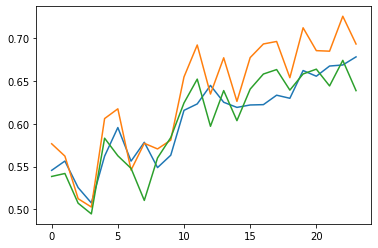

step: 2/3, D_loss: 0.18673187, G_loss_U: 3.2867613, G_loss_S: 0.007305817, E_loss_t0: 1.6595013


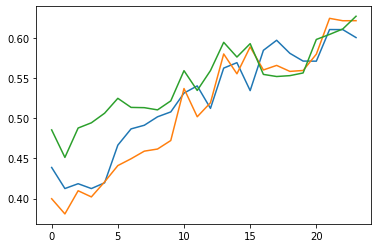

step: 2/3, D_loss: 0.16130863, G_loss_U: 3.3707435, G_loss_S: 0.0071515795, E_loss_t0: 1.6541781


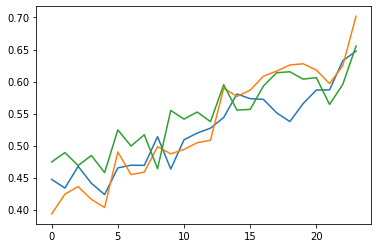

step: 2/3, D_loss: 0.15341395, G_loss_U: 3.418334, G_loss_S: 0.0071698106, E_loss_t0: 1.6478887


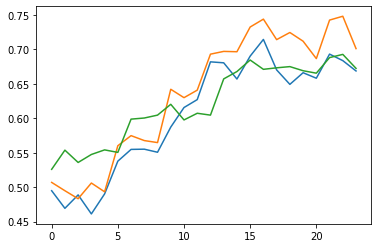

step: 2/3, D_loss: 0.14977533, G_loss_U: 3.4208295, G_loss_S: 0.0071628126, E_loss_t0: 1.6848646


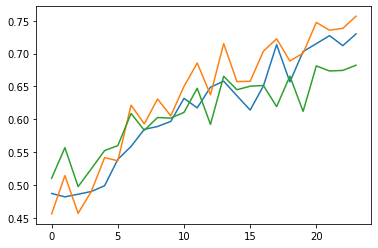

step: 2/3, D_loss: 0.15042955, G_loss_U: 3.4388683, G_loss_S: 0.0070234993, E_loss_t0: 1.6736821


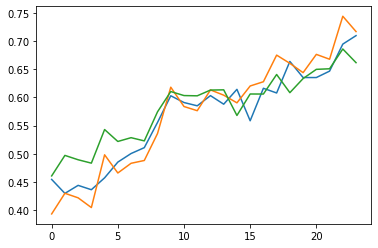

step: 2/3, D_loss: 0.14774306, G_loss_U: 3.4391346, G_loss_S: 0.007123916, E_loss_t0: 1.674812


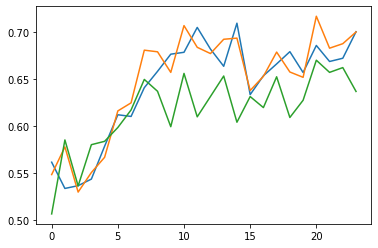

step: 2/3, D_loss: 0.14613873, G_loss_U: 3.435547, G_loss_S: 0.006969539, E_loss_t0: 1.6691761


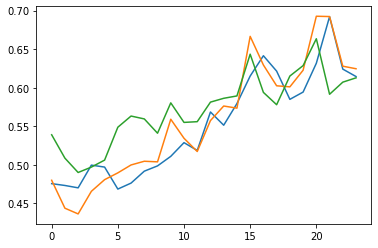

step: 2/3, D_loss: 0.14715947, G_loss_U: 3.4390204, G_loss_S: 0.0069576683, E_loss_t0: 1.6248132


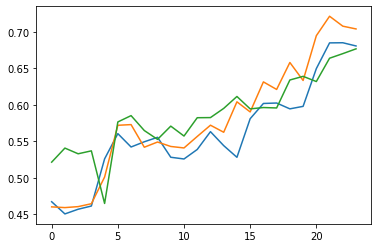

step: 2/3, D_loss: 0.14813858, G_loss_U: 3.4365988, G_loss_S: 0.006969149, E_loss_t0: 1.6701628


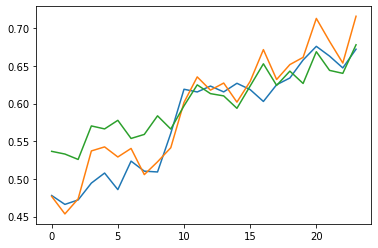

step: 2/3, D_loss: 0.14824098, G_loss_U: 3.4363787, G_loss_S: 0.006857233, E_loss_t0: 1.6711502


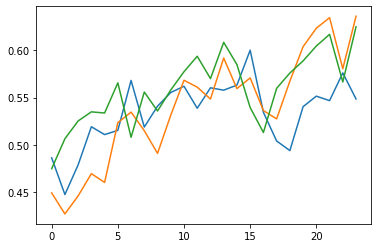

step: 2/3, D_loss: 0.14853084, G_loss_U: 3.4306214, G_loss_S: 0.0067434493, E_loss_t0: 1.6451051


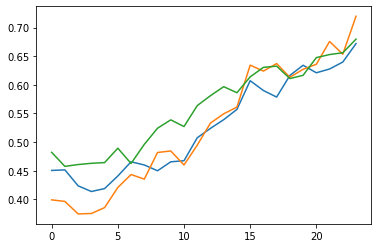

step: 2/3, D_loss: 0.14646079, G_loss_U: 3.43556, G_loss_S: 0.006643599, E_loss_t0: 1.656015


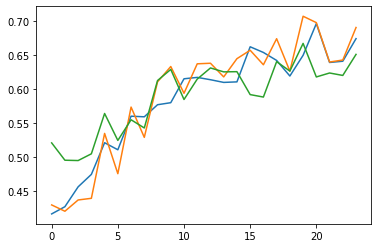

step: 2/3, D_loss: 0.14961378, G_loss_U: 3.4469492, G_loss_S: 0.0066380044, E_loss_t0: 1.6423976


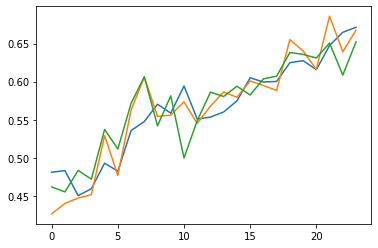

step: 2/3, D_loss: 0.15070742, G_loss_U: 3.4675741, G_loss_S: 0.006519546, E_loss_t0: 1.6866784


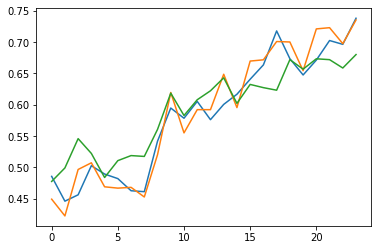

step: 2/3, D_loss: 0.1511946, G_loss_U: 3.4718313, G_loss_S: 0.006442628, E_loss_t0: 1.6854804


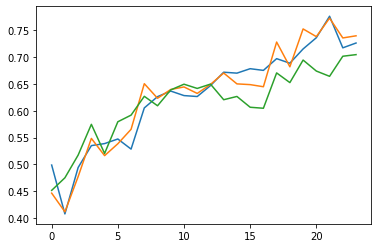

step: 2/3, D_loss: 0.15560575, G_loss_U: 3.4857008, G_loss_S: 0.0064737373, E_loss_t0: 1.6815977


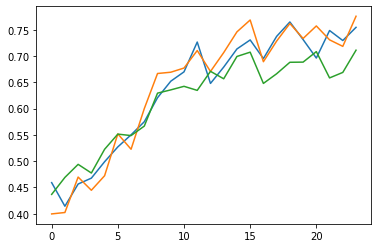

step: 2/3, D_loss: 0.15598714, G_loss_U: 3.5030506, G_loss_S: 0.0065619885, E_loss_t0: 1.6271309


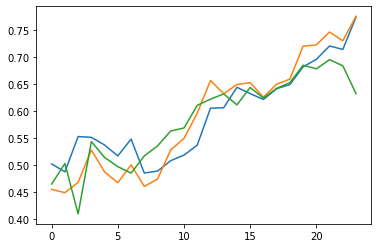

step: 2/3, D_loss: 0.1692965, G_loss_U: 3.4792721, G_loss_S: 0.006581424, E_loss_t0: 1.6402669


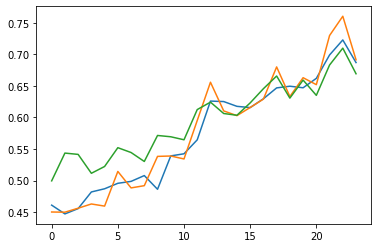

step: 2/3, D_loss: 0.14655793, G_loss_U: 3.4843137, G_loss_S: 0.0070403325, E_loss_t0: 1.6794149


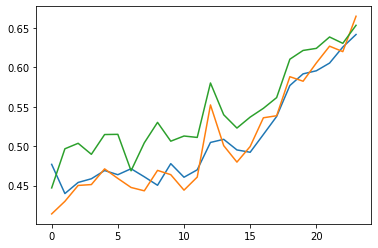

step: 2/3, D_loss: 0.14454839, G_loss_U: 3.4802558, G_loss_S: 0.0076748864, E_loss_t0: 1.641534


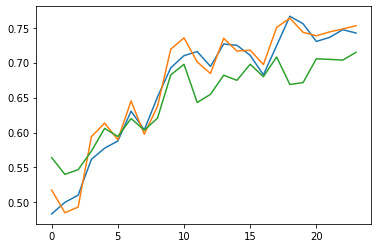

step: 2/3, D_loss: 0.1460268, G_loss_U: 3.4832623, G_loss_S: 0.008334425, E_loss_t0: 1.6545186


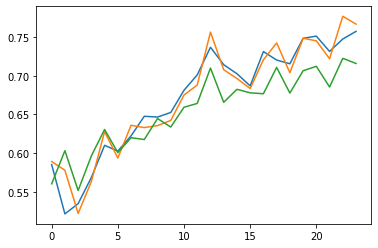

step: 2/3, D_loss: 0.1467431, G_loss_U: 3.4861755, G_loss_S: 0.008808659, E_loss_t0: 1.6772377


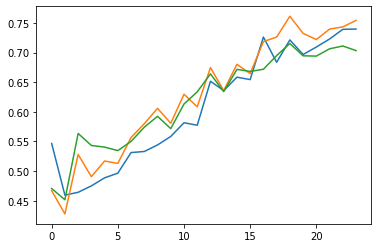

step: 2/3, D_loss: 0.14080095, G_loss_U: 3.4715843, G_loss_S: 0.009156063, E_loss_t0: 1.6832289


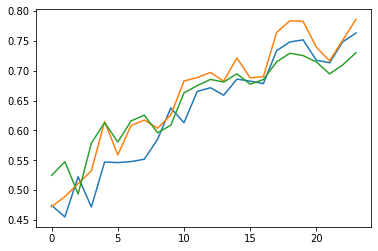

step: 2/3, D_loss: 0.14051901, G_loss_U: 3.4874637, G_loss_S: 0.00973463, E_loss_t0: 1.6434245


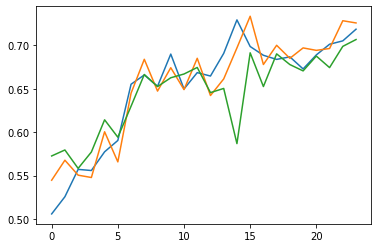

step: 2/3, D_loss: 0.14516939, G_loss_U: 3.4764302, G_loss_S: 0.010023835, E_loss_t0: 1.6633734


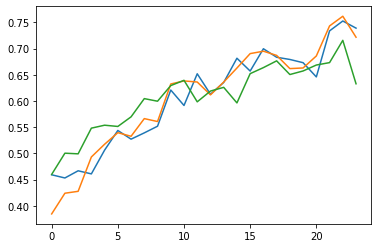

step: 2/3, D_loss: 0.14345005, G_loss_U: 3.4881446, G_loss_S: 0.0104578035, E_loss_t0: 1.6566217


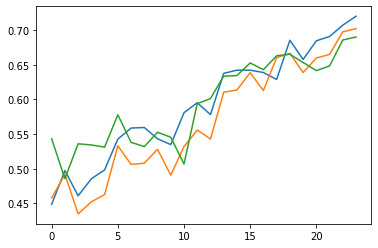

step: 2/3, D_loss: 0.1409812, G_loss_U: 3.4842112, G_loss_S: 0.0108181415, E_loss_t0: 1.6909007


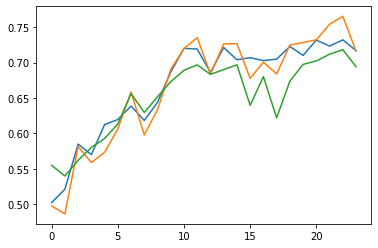

step: 2/3, D_loss: 0.14125657, G_loss_U: 3.481315, G_loss_S: 0.011073132, E_loss_t0: 1.6423128


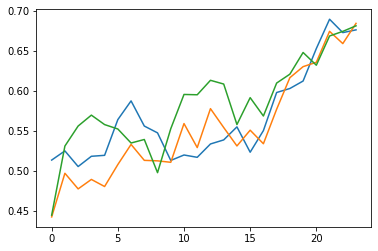

step: 2/3, D_loss: 0.14082143, G_loss_U: 3.4689295, G_loss_S: 0.011205804, E_loss_t0: 1.6891264


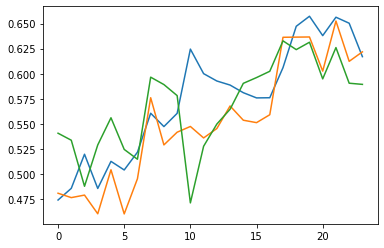

step: 2/3, D_loss: 0.14060459, G_loss_U: 3.4667227, G_loss_S: 0.011374235, E_loss_t0: 1.6289893


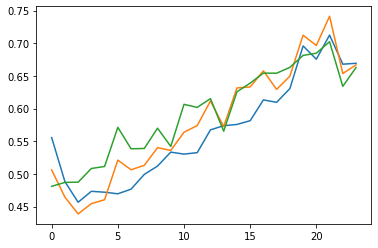

step: 2/3, D_loss: 0.14053912, G_loss_U: 3.473198, G_loss_S: 0.0115268305, E_loss_t0: 1.6585032


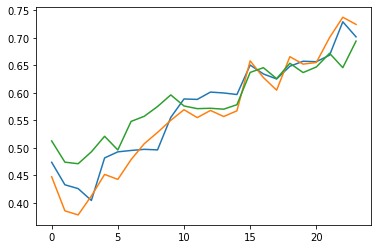

step: 2/3, D_loss: 0.13856399, G_loss_U: 3.4827344, G_loss_S: 0.011783975, E_loss_t0: 1.642763


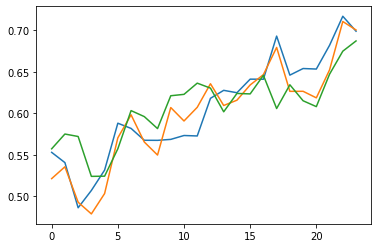

step: 2/3, D_loss: 0.13957526, G_loss_U: 3.4917526, G_loss_S: 0.011831107, E_loss_t0: 1.6408793


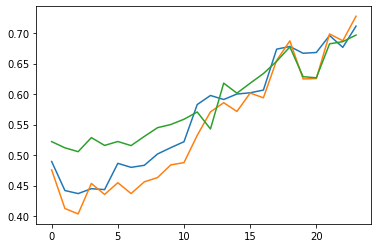

step: 2/3, D_loss: 0.13771535, G_loss_U: 3.4730837, G_loss_S: 0.011902791, E_loss_t0: 1.6697737


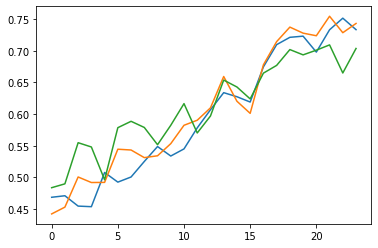

step: 2/3, D_loss: 0.13742222, G_loss_U: 3.4760392, G_loss_S: 0.011928026, E_loss_t0: 1.6638908


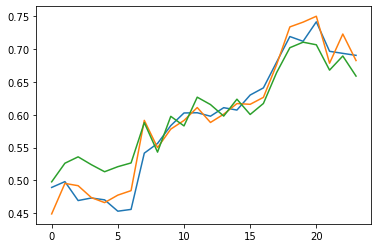

step: 2/3, D_loss: 0.1381716, G_loss_U: 3.4774096, G_loss_S: 0.011930333, E_loss_t0: 1.6763223


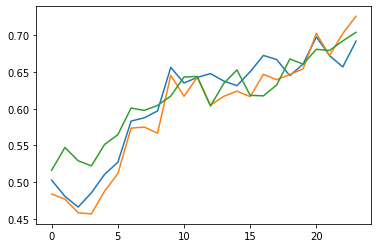

step: 2/3, D_loss: 0.13600604, G_loss_U: 3.4753475, G_loss_S: 0.011810918, E_loss_t0: 1.682451


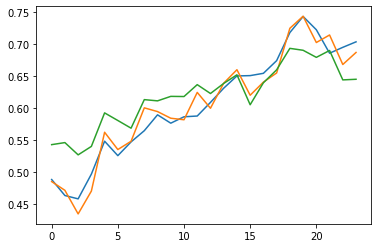

step: 2/3, D_loss: 0.13874257, G_loss_U: 3.4867775, G_loss_S: 0.011966475, E_loss_t0: 1.6631147


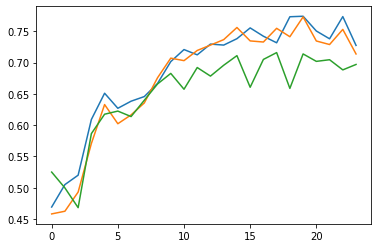

step: 2/3, D_loss: 0.13823111, G_loss_U: 3.4813423, G_loss_S: 0.011899869, E_loss_t0: 1.6590271


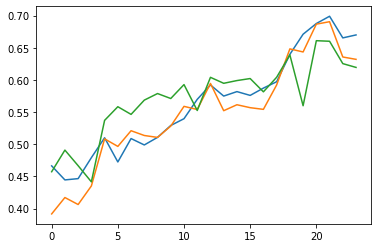

step: 2/3, D_loss: 0.13690144, G_loss_U: 3.4796207, G_loss_S: 0.011901886, E_loss_t0: 1.6551646


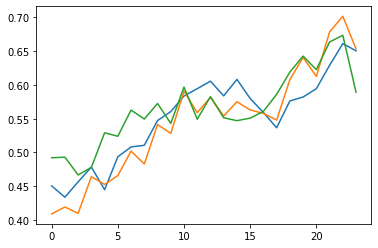

step: 2/3, D_loss: 0.1371059, G_loss_U: 3.4835892, G_loss_S: 0.011797501, E_loss_t0: 1.6741765


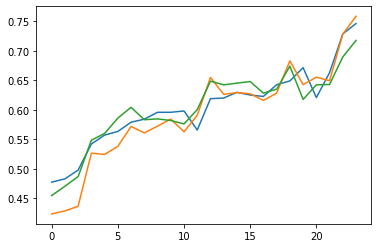

step: 2/3, D_loss: 0.13694587, G_loss_U: 3.4732409, G_loss_S: 0.011828162, E_loss_t0: 1.6865515


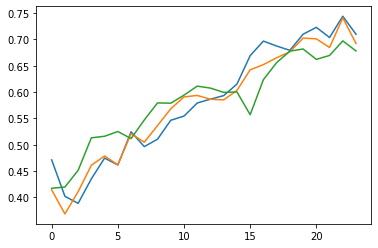

step: 2/3, D_loss: 0.14011228, G_loss_U: 3.4782875, G_loss_S: 0.011582604, E_loss_t0: 1.6467394


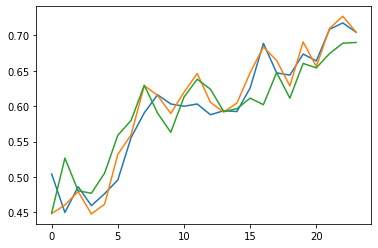

step: 2/3, D_loss: 0.1411783, G_loss_U: 3.4768393, G_loss_S: 0.011510222, E_loss_t0: 1.6831801


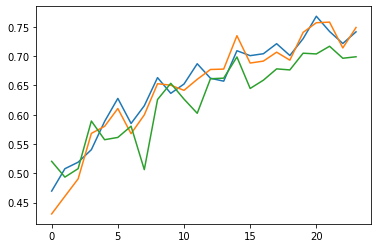

step: 2/3, D_loss: 0.1395203, G_loss_U: 3.4776294, G_loss_S: 0.011597129, E_loss_t0: 1.6555892


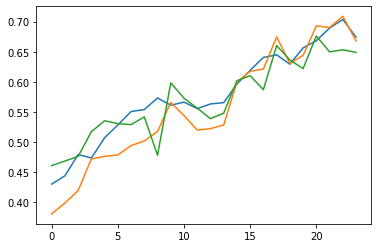

step: 2/3, D_loss: 0.14272708, G_loss_U: 3.4727914, G_loss_S: 0.011409511, E_loss_t0: 1.6846061


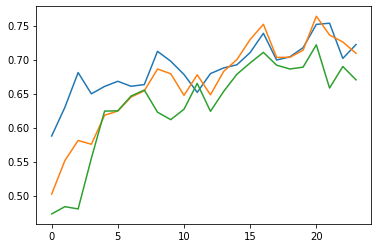

step: 2/3, D_loss: 0.13829306, G_loss_U: 3.4889605, G_loss_S: 0.011302743, E_loss_t0: 1.6664844


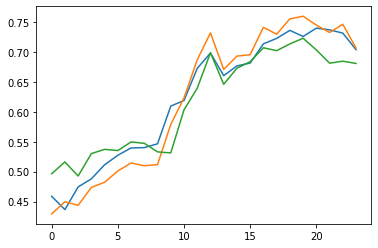

step: 2/3, D_loss: 0.14078698, G_loss_U: 3.4809554, G_loss_S: 0.011116379, E_loss_t0: 1.6990317


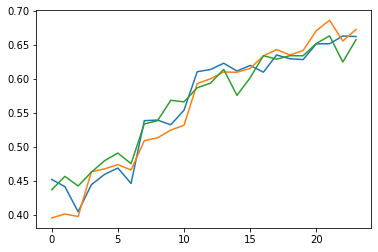

step: 2/3, D_loss: 0.14047414, G_loss_U: 3.4831922, G_loss_S: 0.01117271, E_loss_t0: 1.6559308


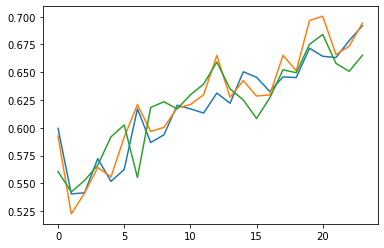

step: 2/3, D_loss: 0.14055052, G_loss_U: 3.4815223, G_loss_S: 0.011019761, E_loss_t0: 1.6475558


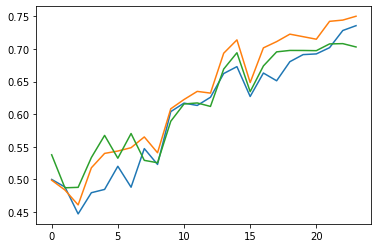

step: 2/3, D_loss: 0.13869238, G_loss_U: 3.4787362, G_loss_S: 0.010851792, E_loss_t0: 1.6707646


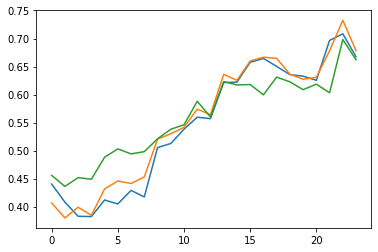

step: 2/3, D_loss: 0.1410715, G_loss_U: 3.4731426, G_loss_S: 0.010737699, E_loss_t0: 1.6641724


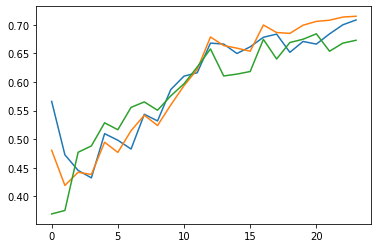

step: 2/3, D_loss: 0.14062676, G_loss_U: 3.4873295, G_loss_S: 0.010588733, E_loss_t0: 1.6240925


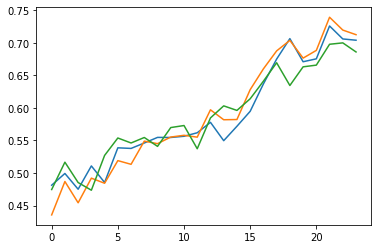

step: 2/3, D_loss: 0.14168987, G_loss_U: 3.4830225, G_loss_S: 0.010494252, E_loss_t0: 1.6675622


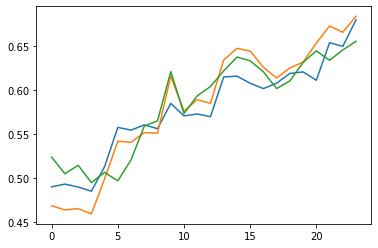

step: 2/3, D_loss: 0.14176846, G_loss_U: 3.4862964, G_loss_S: 0.010456161, E_loss_t0: 1.6536479


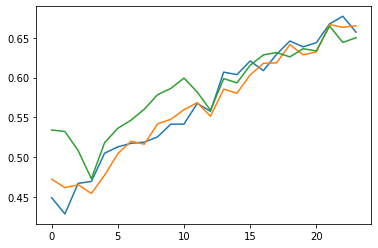

step: 2/3, D_loss: 0.14067817, G_loss_U: 3.4831674, G_loss_S: 0.010282554, E_loss_t0: 1.6674696


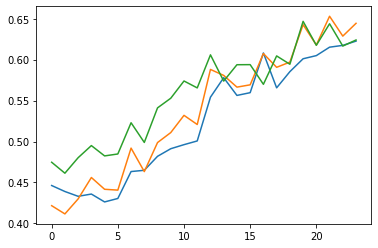

step: 2/3, D_loss: 0.13719472, G_loss_U: 3.4924867, G_loss_S: 0.010245359, E_loss_t0: 1.6521622


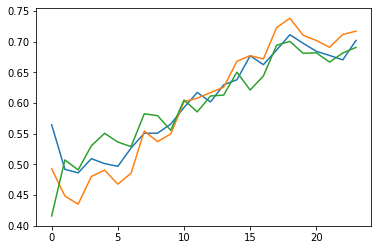

step: 2/3, D_loss: 0.14144617, G_loss_U: 3.4835293, G_loss_S: 0.01001108, E_loss_t0: 1.6724278


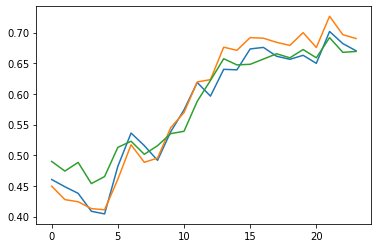

step: 2/3, D_loss: 0.1402307, G_loss_U: 3.48477, G_loss_S: 0.009868609, E_loss_t0: 1.6445626


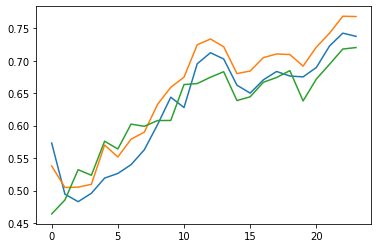

step: 2/3, D_loss: 0.14063317, G_loss_U: 3.4881523, G_loss_S: 0.009704705, E_loss_t0: 1.6761547


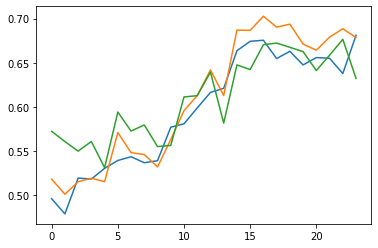

step: 2/3, D_loss: 0.14142875, G_loss_U: 3.4729455, G_loss_S: 0.009654026, E_loss_t0: 1.6590409


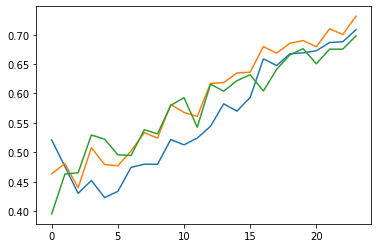

step: 2/3, D_loss: 0.14340878, G_loss_U: 3.4750223, G_loss_S: 0.009516122, E_loss_t0: 1.6361196


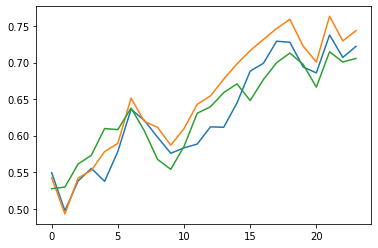

step: 2/3, D_loss: 0.14067636, G_loss_U: 3.4775164, G_loss_S: 0.009466617, E_loss_t0: 1.6872239


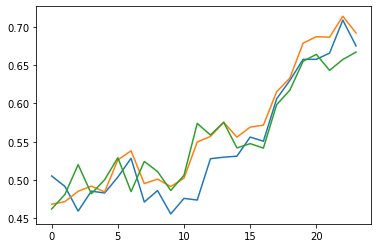

step: 2/3, D_loss: 0.14233217, G_loss_U: 3.4794753, G_loss_S: 0.009268509, E_loss_t0: 1.6461277


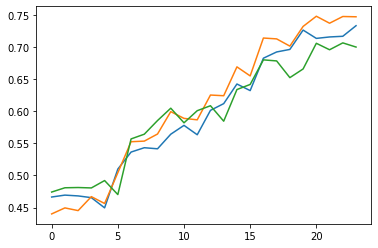

step: 2/3, D_loss: 0.14546295, G_loss_U: 3.4866192, G_loss_S: 0.009347273, E_loss_t0: 1.6584487


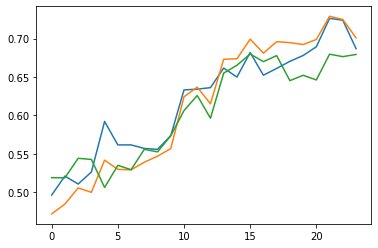

step: 2/3, D_loss: 0.14021607, G_loss_U: 3.47499, G_loss_S: 0.009054801, E_loss_t0: 1.6603125


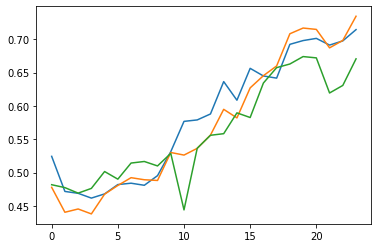

step: 2/3, D_loss: 0.14222299, G_loss_U: 3.4739854, G_loss_S: 0.008897084, E_loss_t0: 1.6641098


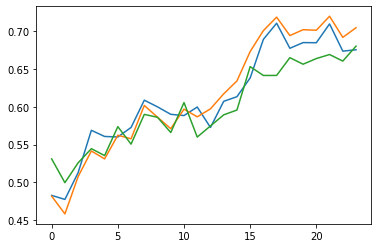

step: 2/3, D_loss: 0.14370137, G_loss_U: 3.485859, G_loss_S: 0.00881286, E_loss_t0: 1.6666362


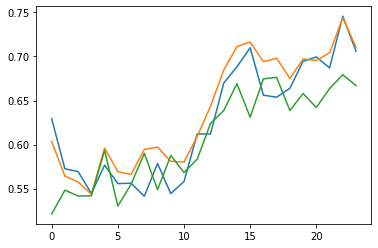

step: 2/3, D_loss: 0.14616424, G_loss_U: 3.4874134, G_loss_S: 0.008792586, E_loss_t0: 1.6476119


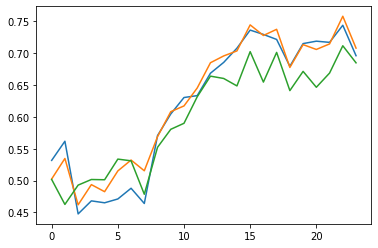

step: 2/3, D_loss: 0.14372034, G_loss_U: 3.4774952, G_loss_S: 0.008639158, E_loss_t0: 1.6717416


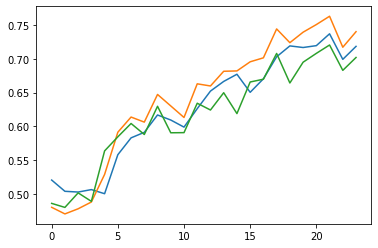

step: 2/3, D_loss: 0.14386521, G_loss_U: 3.478873, G_loss_S: 0.008580885, E_loss_t0: 1.6736449


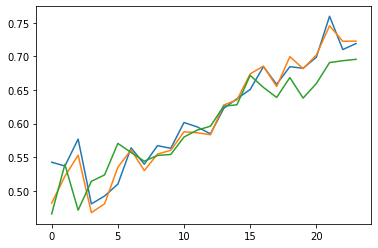

step: 2/3, D_loss: 0.1452285, G_loss_U: 3.4876316, G_loss_S: 0.008443069, E_loss_t0: 1.6507593


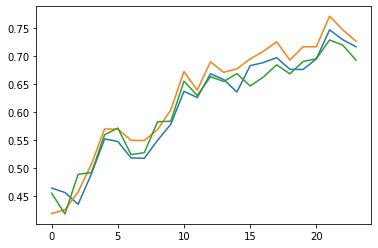

step: 2/3, D_loss: 0.1418029, G_loss_U: 3.486703, G_loss_S: 0.00836788, E_loss_t0: 1.6713216


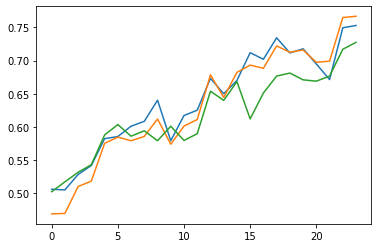

step: 2/3, D_loss: 0.14348911, G_loss_U: 3.484115, G_loss_S: 0.008199661, E_loss_t0: 1.6427108


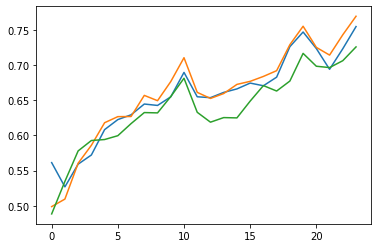

step: 2/3, D_loss: 0.14564402, G_loss_U: 3.4797153, G_loss_S: 0.008143019, E_loss_t0: 1.6417233


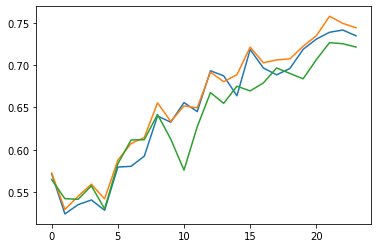

step: 2/3, D_loss: 0.14412218, G_loss_U: 3.479902, G_loss_S: 0.007967138, E_loss_t0: 1.6251407


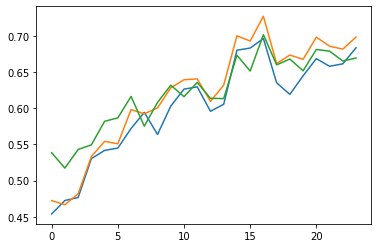

step: 2/3, D_loss: 0.14425859, G_loss_U: 3.4826355, G_loss_S: 0.008025351, E_loss_t0: 1.6711298


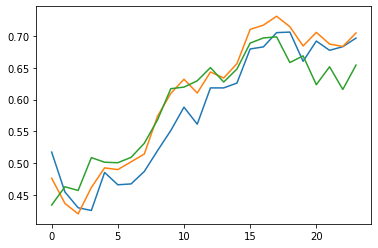

step: 2/3, D_loss: 0.14551008, G_loss_U: 3.4826062, G_loss_S: 0.007915697, E_loss_t0: 1.6590221


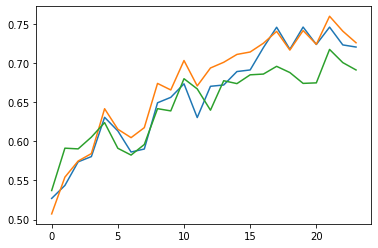

step: 2/3, D_loss: 0.14436272, G_loss_U: 3.4744854, G_loss_S: 0.007896564, E_loss_t0: 1.6555029


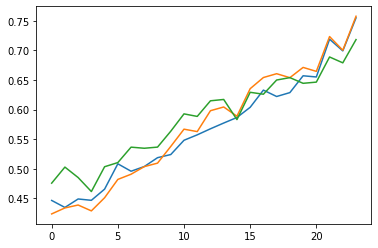

step: 2/3, D_loss: 0.1466402, G_loss_U: 3.477725, G_loss_S: 0.007673017, E_loss_t0: 1.6342087


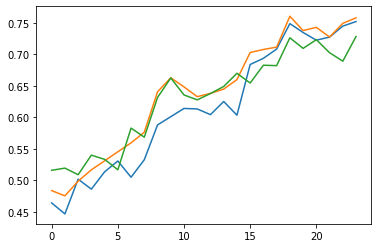

step: 2/3, D_loss: 0.14741328, G_loss_U: 3.4824746, G_loss_S: 0.0075913346, E_loss_t0: 1.6905797


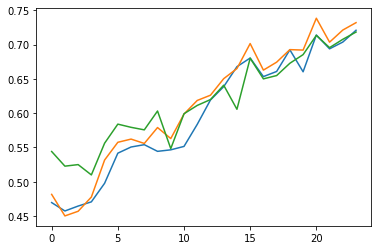

step: 2/3, D_loss: 0.14706045, G_loss_U: 3.4745634, G_loss_S: 0.0074944114, E_loss_t0: 1.6425827


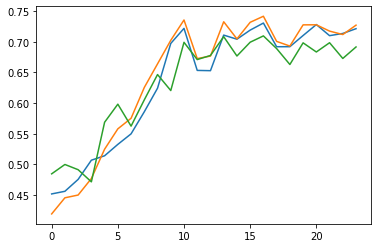

step: 2/3, D_loss: 0.14447388, G_loss_U: 3.481367, G_loss_S: 0.0073946724, E_loss_t0: 1.6524436


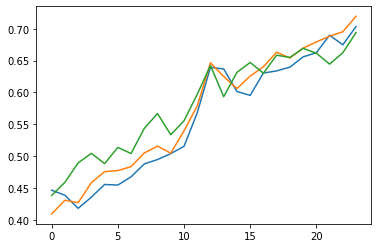

step: 2/3, D_loss: 0.146995, G_loss_U: 3.4789307, G_loss_S: 0.007352236, E_loss_t0: 1.6080998


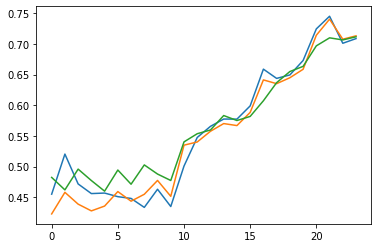

step: 2/3, D_loss: 0.14820777, G_loss_U: 3.4792016, G_loss_S: 0.0072630015, E_loss_t0: 1.6748796


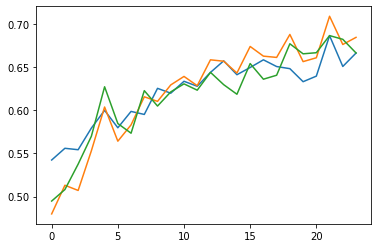

step: 2/3, D_loss: 0.14475457, G_loss_U: 3.4915593, G_loss_S: 0.0071910103, E_loss_t0: 1.6579125


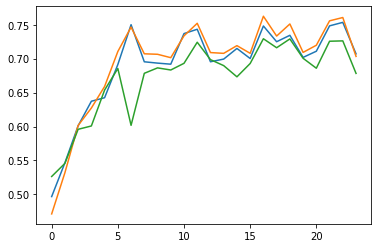

step: 2/3, D_loss: 0.14560817, G_loss_U: 3.4882624, G_loss_S: 0.007062822, E_loss_t0: 1.682144


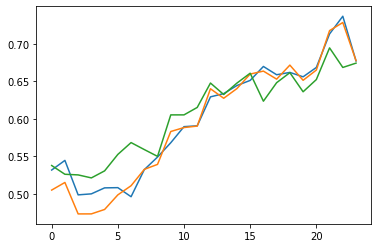

step: 2/3, D_loss: 0.1477922, G_loss_U: 3.4609244, G_loss_S: 0.007030943, E_loss_t0: 1.6589525


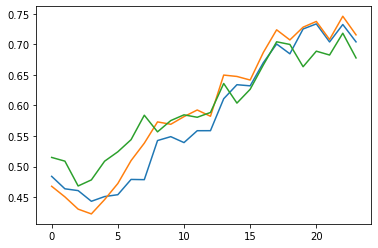

step: 2/3, D_loss: 0.14701104, G_loss_U: 3.478276, G_loss_S: 0.006905309, E_loss_t0: 1.6587563


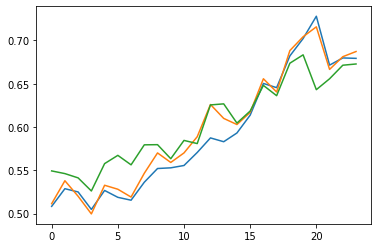

step: 2/3, D_loss: 0.1454325, G_loss_U: 3.4801395, G_loss_S: 0.0068197497, E_loss_t0: 1.6977926


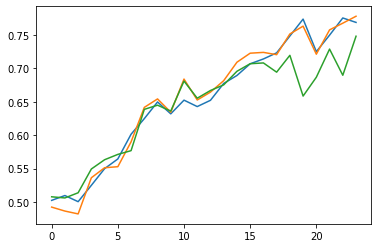

step: 2/3, D_loss: 0.14846505, G_loss_U: 3.4749758, G_loss_S: 0.006840719, E_loss_t0: 1.6661456


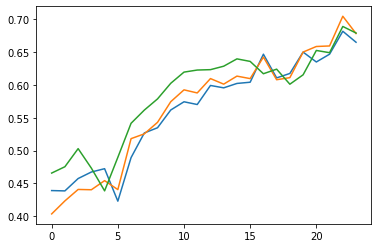

step: 2/3, D_loss: 0.14891912, G_loss_U: 3.4796202, G_loss_S: 0.0068139764, E_loss_t0: 1.6804914


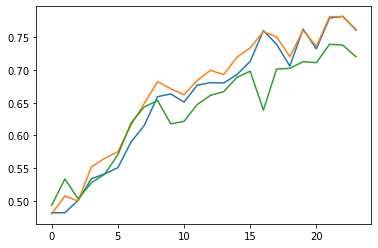

step: 2/3, D_loss: 0.14751923, G_loss_U: 3.4768903, G_loss_S: 0.0065820767, E_loss_t0: 1.6392043


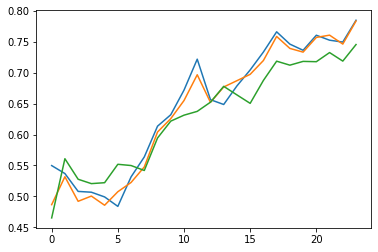

step: 2/3, D_loss: 0.14805195, G_loss_U: 3.4755318, G_loss_S: 0.0066235065, E_loss_t0: 1.6240598


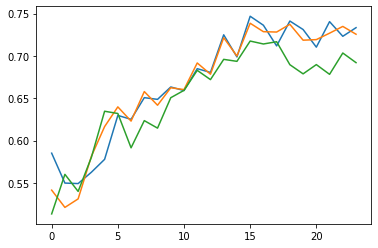

step: 2/3, D_loss: 0.14636843, G_loss_U: 3.4717102, G_loss_S: 0.0065406784, E_loss_t0: 1.6821203


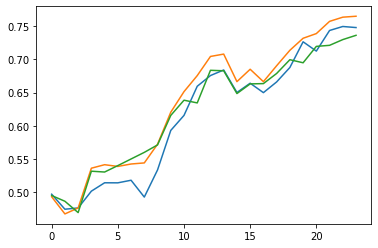

step: 2/3, D_loss: 0.1505787, G_loss_U: 3.4735105, G_loss_S: 0.006475544, E_loss_t0: 1.6813219


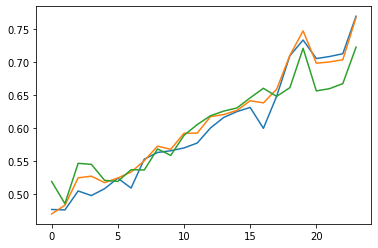

step: 2/3, D_loss: 0.14402682, G_loss_U: 3.472699, G_loss_S: 0.0064476584, E_loss_t0: 1.6598759


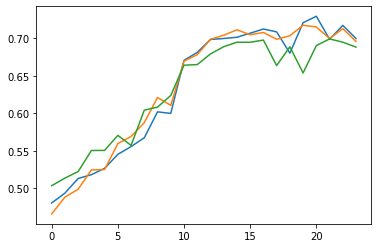

step: 2/3, D_loss: 0.14472108, G_loss_U: 3.4681466, G_loss_S: 0.0062776892, E_loss_t0: 1.6713738


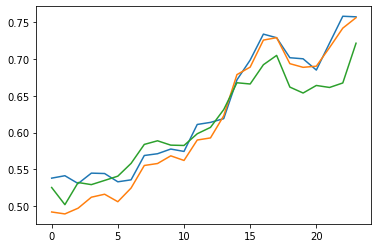

Finish Joint Training


In [23]:
Generator, Embedder, Supervisor, Recovery, Discriminator, checkpoints, generated = TimeGAN(data, parameters)

In [24]:
# examine shape of output

torch.cat(generated).shape

torch.Size([300, 24, 3])

Evaluation of Synthetic Data

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 400 samples in 0.001s...
[t-SNE] Computed neighbors for 400 samples in 0.009s...
[t-SNE] Computed conditional probabilities for sample 400 / 400
[t-SNE] Mean sigma: 0.143739
[t-SNE] KL divergence after 250 iterations with early exaggeration: 56.685368
[t-SNE] KL divergence after 300 iterations: 0.448658


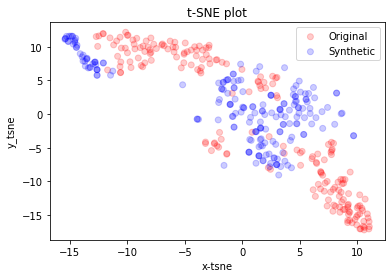

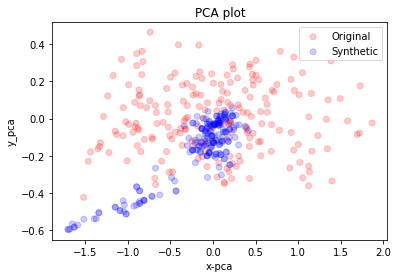

In [25]:
# create t-SNE and pca plot. This was one of the evaluation methods of the original paper. The more closely the shapes
# and the spread out of syntehtic and original data overlap, the better the generated data was considered. Careful: 
# if you run less epochs, less sample are generated and the number of repeats in the lines below has to be increased.
visualization(data, torch.cat(generated).repeat(1000,1,1).detach().numpy(), 'tsne')
visualization(data, torch.cat(generated).repeat(1000,1,1).detach().numpy(), 'pca')

In [26]:
# Save Generator and Recovery for Reproducibility
torch.save(Generator.state_dict(), "../generator_no_ada_fnn")
torch.save(Recovery.state_dict(), "../recovery_no_ada_fnn")

As we can see, with increasing training time the Generator is more and more able to approach the original data. However if we look at the individual samples, they are really wobbly. In the next step, I try intgerating an ADA fnn layer and see if it helps smoothen the generated samples.

The Logic for the modules of the ADA fnn layers follows the implementation of the ADA fnn paper, with a few simplifictaions. The layer is integrated between the rnn layers and the fully connected layer in the Generator. Adaptions to the original workflow are highlighted with blocks of #### to see the differences more clearly.

At first additional neccesary classes are defined: A normalization Layer, a Feed Forward Module, and an ADA Fnn Class that constructs the whole layer:

In [27]:
class LayerNorm(nn.Module):

    def __init__(self, d, eps=1e-6):
        super().__init__()
        # d is the normalization dimension
        self.d = d
        self.eps = eps
        self.alpha = nn.Parameter(torch.randn(d))
        self.beta = nn.Parameter(torch.randn(d))

    def forward(self, x):
        # x is a torch.Tensor
        # avg is the mean value of a layer
        avg = x.mean(dim=-1, keepdim=True)
        # std is the standard deviation of a layer (eps is added to prevent dividing by zero)
        std = x.std(dim=-1, keepdim=True) + self.eps
        return (x - avg) / std * self.alpha + self.beta

In [28]:
class FeedForward(nn.Module):

    def __init__(self, in_d=1, hidden=[4,4,4], dropout=0.1, activation=F.relu):
        # in_d      : input dimension, integer
        # hidden    : hidden layer dimension, array of integers
        # dropout   : dropout probability, a float between 0.0 and 1.0
        # activation: activation function at each layer
        super().__init__()
        self.sigma = activation
        dim = [in_d] + hidden + [parameters['hidden_dim']]
        self.layers = nn.ModuleList([nn.Linear(dim[i-1], dim[i]) for i in range(1, len(dim))])
        self.ln = nn.ModuleList([LayerNorm(k) for k in hidden])
        self.dp = nn.ModuleList([nn.Dropout(dropout) for _ in range(len(hidden))])

    def forward(self, t):
        for i in range(len(self.layers)-1):
            t = self.layers[i](t)
            # skipping connection
            t = t + self.ln[i](t)
            t = self.sigma(t)
            # apply dropout
            t = self.dp[i](t)
        # linear activation at the last layer
        return self.layers[-1](t)

In [29]:
class AdaFNN(nn.Module):

    def __init__(self, n_base=4, base_hidden=[64, 64, 64], grid=(0, 1),
                 sub_hidden=[128, 128, 128], dropout=0.1, lambda1=0.0, lambda2=0.0,
                 device=None):
        """
        n_base      : number of basis nodes, integer
        base_hidden : hidden layers used in each basis node, array of integers
        grid        : observation time grid, array of sorted floats including 0.0 and 1.0
        sub_hidden  : hidden layers in the subsequent network, array of integers
        dropout     : dropout probability
        device      : device for the training
        """
        super().__init__()
        self.n_base = n_base

        self.device = device
        # grid should include both end points
        grid = np.array(grid)
        # send the time grid tensor to device
        self.t = torch.tensor(grid).to(device).float()
        self.h = torch.tensor(grid[1:] - grid[:-1]).to(device).float()
        # instantiate each basis node in the basis layer
        self.BL = nn.ModuleList([FeedForward(1, hidden=base_hidden, dropout=dropout, activation=F.selu) for _ in range(n_base)])
        # instantiate the subsequent network
        self.FF = FeedForward(n_base, sub_hidden, dropout)

    def forward(self, x):
        B = x.size()[0]
        #assert J == self.h.size()[0] + 1
        T = self.t.unsqueeze(dim=-1)
        # evaluate the current basis nodes at time grid
        self.bases = [basis(T).transpose(-1, -2) for basis in self.BL]

        out = self.FF(x)
        return out

Time_GAN_module() class and training routine are adapted to integrate the ada fnn layer:

In [31]:
class Time_GAN_module(nn.Module):
    """
  Function for creation of Time GAN modules consitisting of Embedder, Recovery, Generator, Supervisor and Discriminator
  as well as training and monitoring of Generator Output
  Args: 
    - data : torch.tensor 
        time series data, three dimensional, first dimensions is number of training examples, 
        second dimension is number of time points, third dimension is dimension of time series
    - parameters : dict
        Dictionary containg all necessary parameters
  
          hidden_dim : int 
              dimension of hidden layers
          num_layers : int 
              number of recurrent layers
          iterations : int 
              number of training iterations every epoch
          batch_size : int
              number of samples passed in every training batch
          epoch : int 
              number of training epochs
          device : str 
              specifies if model operates on cpu or gpu, one of 'cpu' or 'gpu'
              
         ############################### Additional ADA FNN Parameters #######################
         base_hidden : array of ints
             hidden layers used in each basis node
         sub_hidden : array of ints
             hidden layers in the subsequent network, array of integers
         dropout : float
             dropout chance of ada fnn layer
             
         
    """
    def __init__(self, input_size, output_size, hidden_dim, num_layers, base_hidden, sub_hidden, seq_len, device, 
                  activation=torch.sigmoid, rnn_type="gru", generator=False, dropout=0.1):
        super(Time_GAN_module, self).__init__()

        # Parameters
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.sigma = activation
        self.rnn_type = rnn_type
        self.generator = generator
        self.base_hidden = base_hidden
        self.grid = list(range(0,seq_len))
        self.sub_hidden = sub_hidden
        self.n_base = hidden_dim
        self.dropout = dropout
        self.device = device

        #Defining the layers
        # RNN Layer
        if self.rnn_type == "gru":
          # fixed rate for dropout as this worked good in the test runs
          self.rnn = nn.GRU(input_size, hidden_dim, num_layers, batch_first=True, dropout=0.2)
        elif self.rnn_type == "rnn":
          self.rnn = nn.RNN(input_size, hidden_dim, num_layers, batch_first = True) 
        elif self.rnn_type == "lstm": # input params still the same for lstm
          self.rnn = nn.LSTM(input_size, hidden_dim, num_layers, batch_first = True)
        
        ####################################################################################
        #If Module is specified as the Generator, the Ada FNN Layer is added
        
        if self.generator == True:
          self.adafnn = AdaFNN(n_base=self.n_base,
               base_hidden=base_hidden,
               grid=self.grid,
               sub_hidden=sub_hidden,
               dropout=dropout, 
               device=device)
        ####################################################################################
        
        # Fully connected layer
        self.fc = nn.Linear(hidden_dim, output_size)
        
    def forward(self, x):
    
            batch_size = x.size(0)

            # Initializing hidden state for first input using method defined below
            if self.rnn_type in ["rnn", "gru"]:
              hidden = self.init_hidden(batch_size)
            elif self.rnn_type == "lstm": # additional initial cell state for lstm
              h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device).float()
              c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device).float()
              hidden = (h0, c0)
            # Passing in the input and hidden state into the model and obtaining outputs
            out, hidden = self.rnn(x, hidden)
            
            #################################################################################
            if self.generator == True:
                out = self.adafnn(out.unsqueeze(0))
            ##################################################################################
            
            # Reshaping the outputs such that it can be fit into the fully connected layer
            out = out.contiguous().view(-1, self.hidden_dim)
            out = self.fc(out)
            
            if self.sigma == nn.Identity:
                idendity = nn.Identity()
                return idendity(out)
                
            out = self.sigma(out)
                        
            return out, hidden
    
    def init_hidden(self, batch_size):
        # Computing of hidden States
        hidden = torch.zeros(self.num_layers, batch_size, self.hidden_dim)
        return hidden
    
def TimeGAN(data, parameters):
  """
  Function for creation of Time GAN modules consitisting of Embedder, Recovery, Generator, Supervisor and Discriminator
  as well as training and monitoring of Generator Output
  Args: 
    - data : torch.tensor 
        time series data, three dimensional, first dimensions is number of training examples, 
        second dimension is number of time points, third dimension is dimension of time series
    - parameters : dict
        Dictionary containg all necessary parameters
  
          hidden_dim : int 
              dimension of hidden layers
          num_layers : int 
              number of recurrent layers
          iterations : int 
              number of training iterations every epoch
          batch_size : int
              number of samples passed in every training batch
          epoch : int 
              number of training epochs
          device : str 
              specifies if model operates on cpu or gpu, one of 'cpu' or 'gpu'
              
              
        ##################### Additional Ada FNN Parameters ###############################
          base_hidden : array of ints
              hidden layers used in each basis node
          sub_hidden : array of ints
              hidden layers in the subsequent network, array of integers
          dropout : float
              dropout chance of ada fnn layer
        ###################################################################################
        
  """
  hidden_dim = parameters["hidden_dim"]
  num_layers = parameters["num_layers"]
  iterations = parameters["iterations"]
  batch_size = parameters["batch_size"]
  module = parameters["module"]
  base_hidden = parameters["base_hidden"]
  sub_hidden = parameters["sub_hidden"]
  epoch = parameters["epoch"]
  device = parameters["device"]
  no, seq_len, dim = np.asarray(data).shape
  z_dim = dim
  gamma = 1
  generated_data = []

  checkpoints = {}

  # Initialize Time GAN modules
  Embedder = Time_GAN_module(input_size=z_dim, output_size=hidden_dim, hidden_dim=hidden_dim, num_layers=num_layers,
                            base_hidden=base_hidden, seq_len = seq_len, sub_hidden=sub_hidden, device=device)
  Recovery = Time_GAN_module(input_size=hidden_dim, output_size=dim, hidden_dim=hidden_dim, num_layers=num_layers,
                            base_hidden=base_hidden, seq_len = seq_len, sub_hidden=sub_hidden, device=device)
  Generator = Time_GAN_module(input_size=dim, output_size=hidden_dim, hidden_dim=hidden_dim, num_layers=num_layers,
                             seq_len=seq_len, base_hidden=base_hidden, sub_hidden=sub_hidden, generator=True, device=device)
  Supervisor = Time_GAN_module(input_size=hidden_dim, output_size=hidden_dim, hidden_dim=hidden_dim, num_layers=num_layers,
                              base_hidden=base_hidden, seq_len = seq_len, sub_hidden=sub_hidden,device=device)
  Discriminator = Time_GAN_module(input_size=hidden_dim, output_size=1, hidden_dim=hidden_dim, num_layers=num_layers, activation=nn.Identity,
                                 base_hidden=base_hidden, seq_len = seq_len, sub_hidden=sub_hidden,device=device)
  
  Embedder.to(device)
  Recovery.to(device)
  Generator.to(device) 
  Supervisor.to(device)
  Discriminator.to(device)
  
  # Initialize Optimizers
  embedder_optimizer = optim.Adam(Embedder.parameters(), lr=0.001)
  recovery_optimizer = optim.Adam(Recovery.parameters(), lr=0.001)
  supervisor_optimizer = optim.Adam(Supervisor.parameters(), lr=0.001)
  discriminator_optimizer = optim.Adam(Discriminator.parameters(), lr=0.005)
  generator_optimizer = optim.Adam(Generator.parameters(), lr=0.01)
  
  # Initialize Loss Functions and Data Loader
  binary_cross_entropy_loss = nn.BCEWithLogitsLoss()
  MSE_loss = nn.MSELoss()
  loader = DataLoader(data, parameters['batch_size'], shuffle=True)
  
  # Start training. The training is split into 3 parts, and each step follows the original implementation of the time 
  # Time GAN paper as closely as possible.
 
    
  # First Step: Embedding Network Training
  # Train Embedding and Recovery network
  print('Start Embedding Network Training')
  for e in range(epoch): 
    for batch_index, X in enumerate(loader):
        
        X.to(device)
        
        H, _ = Embedder(X.float())
        H = torch.reshape(H, (batch_size, seq_len, hidden_dim))

        X_tilde, _ = Recovery(H)
        X_tilde = torch.reshape(X_tilde, (batch_size, seq_len, dim))

        E_loss0 = 10 * torch.sqrt(MSE_loss(X, X_tilde))  

        Embedder.zero_grad()
        Recovery.zero_grad()

        E_loss0.backward(retain_graph=True)

        embedder_optimizer.step()
        recovery_optimizer.step()

        if e in range(1,epoch) and batch_index == 0:
            print('step: '+ str(e) + '/' + str(epoch) + ', e_loss: ' + str(np.sqrt(E_loss0.detach().numpy())))

  print('Finish Embedding Network Training')

  # Second Step: Training on Supervised Loss
  print('Start Training with Supervised Loss Only')
  for e in range(epoch): 
    for batch_index, X in enumerate(loader):
        
        X.to(device)
        
        H, _ = Embedder(X.float())
        H = torch.reshape(H, (batch_size, seq_len, hidden_dim))

        H_hat_supervise, _ = Supervisor(H)
        H_hat_supervise = torch.reshape(H_hat_supervise, (batch_size, seq_len, hidden_dim))  

        G_loss_S = MSE_loss(H[:,1:,:], H_hat_supervise[:,:-1,:])

        Embedder.zero_grad()
        Supervisor.zero_grad()

        G_loss_S.backward(retain_graph=True)

        embedder_optimizer.step()
        supervisor_optimizer.step()

        if e in range(1,epoch) and batch_index == 0:
            print('step: '+ str(e) + '/' + str(epoch) + ', s_loss: ' + str(np.sqrt(G_loss_S.detach().numpy())))

  print('Finish Training with Supervised Loss Only')
  
  
 # Third Step: Joint Training of modules
  print('Start Joint Training')
  
  #############################################################################################################
  #increase epoch size (higher number of epochs in the first two steps gets the generator stuck in very simple 
  # curve shapes)
  #############################################################################################################
  epoch = epoch * 4
  for itt in range(epoch):
  

    # the generator, supervisor and discriminator are trained for an extra two steps as in the original paper
    for kk in range(2):
      X = next(iter(loader))
      X.to(device)
      random_data = random_generator(batch_size=batch_size, z_dim=dim, 
                                       T_mb=extract_time(data)[0], max_seq_len=extract_time(data)[1])
        
      # Generator Training 
      ## Train Generator
      z = torch.tensor(random_data)
      z = z.float()
        
      e_hat, _ = Generator(z)
      e_hat = torch.reshape(e_hat, (batch_size, seq_len, hidden_dim))
        
      H_hat, _ = Supervisor(e_hat)
      H_hat = torch.reshape(H_hat, (batch_size, seq_len, hidden_dim))
        
      Y_fake = Discriminator(H_hat)
      Y_fake = torch.reshape(Y_fake, (batch_size, seq_len, 1))
        
      x_hat, _ = Recovery(H_hat)
      x_hat = torch.reshape(x_hat, (batch_size, seq_len, dim))
        
      H, _ = Embedder(X.float())
      H = torch.reshape(H, (batch_size, seq_len, hidden_dim))

      H_hat_supervise, _ = Supervisor(H)
      H_hat_supervise = torch.reshape(H_hat_supervise, (batch_size, seq_len, hidden_dim))

      Generator.zero_grad()
      Supervisor.zero_grad()
      Discriminator.zero_grad()
      Recovery.zero_grad()

      # G_loss_U, G_loss_S, G_loss_V
      G_loss_S = MSE_loss(H[:,1:,:], H_hat_supervise[:,:-1,:])
      binary_cross_entropy_loss = nn.BCEWithLogitsLoss()

      # D_loss_real(Y_real, torch.ones_like(Y_real))
      G_loss_U = binary_cross_entropy_loss(Y_fake, torch.ones_like(Y_fake))
        
      G_loss_V1 = torch.mean(torch.abs((torch.std(x_hat, [0], unbiased = False)) + 1e-6 - (torch.std(X, [0]) + 1e-6)))
      G_loss_V2 = torch.mean(torch.abs((torch.mean(x_hat, [0]) - (torch.mean(X, [0])))))
      G_loss_V = G_loss_V1 + G_loss_V2

      G_loss_S.backward(retain_graph=True)#
      G_loss_U.backward(retain_graph=True)
      G_loss_V.backward(retain_graph=True)#

      generator_optimizer.step()
      supervisor_optimizer.step()
      discriminator_optimizer.step()
      
      # Train Embedder 
      MSE_loss = nn.MSELoss()
        
      H, _ = Embedder(X.float())
      H = torch.reshape(H, (batch_size, seq_len, hidden_dim))

      X_tilde, _ = Recovery(H)
      X_tilde = torch.reshape(X_tilde, (batch_size, seq_len, dim))

      E_loss_T0 = MSE_loss(X, X_tilde)
      E_loss0 = 10 * torch.sqrt(MSE_loss(X, X_tilde))  
        
      H_hat_supervise, _ = Supervisor(H)
      H_hat_supervise = torch.reshape(H_hat_supervise, (batch_size, seq_len, hidden_dim))  

      G_loss_S = MSE_loss(H[:,1:,:], H_hat_supervise[:,:-1,:])
      E_loss = E_loss0  + 0.1 * G_loss_S
        
      G_loss_S.backward(retain_graph=True)
      E_loss_T0.backward()
        
      Embedder.zero_grad()
      Recovery.zero_grad()
      Supervisor.zero_grad()
        
      embedder_optimizer.step()
      recovery_optimizer.step()
      supervisor_optimizer.step()
    
    # train Discriminator
    for batch_index, X in enumerate(loader):
        
      X.to(device)
      random_data = random_generator(batch_size=batch_size, z_dim=dim, 
                                       T_mb=extract_time(data)[0], max_seq_len=extract_time(data)[1])
      
      z = torch.tensor(random_data)
      z = z.float()

      H, _ = Embedder(X)
      H = torch.reshape(H, (batch_size, seq_len, hidden_dim))

      Y_real = Discriminator(H)
      Y_real = torch.reshape(Y_real, (batch_size, seq_len, 1))
      
      e_hat, _ = Generator(z)
      e_hat = torch.reshape(e_hat, (batch_size, seq_len, hidden_dim))

      Y_fake_e = Discriminator(e_hat)
      Y_fake_e = torch.reshape(Y_fake_e, (batch_size, seq_len, 1))
        
      H_hat, _ = Supervisor(e_hat)
      H_hat = torch.reshape(H_hat, (batch_size, seq_len, hidden_dim))
        
      Y_fake = Discriminator(H_hat)
      Y_fake = torch.reshape(Y_fake, (batch_size, seq_len, 1))
        
      x_hat, _ = Recovery(H_hat)
      x_hat = torch.reshape(x_hat, (batch_size, seq_len, dim))

      Generator.zero_grad()
      Supervisor.zero_grad()
      Discriminator.zero_grad()
      Recovery.zero_grad()
      Embedder.zero_grad()

      # D_loss_real(Y_real, torch.ones_like(Y_real))
      D_loss_real = nn.BCEWithLogitsLoss()
      DLR = D_loss_real(Y_real, torch.ones_like(Y_real))

      D_loss_fake = nn.BCEWithLogitsLoss()
      DLF = D_loss_fake(Y_fake, torch.zeros_like(Y_fake))

      D_loss_fake_e = nn.BCEWithLogitsLoss()
      DLF_e = D_loss_fake_e(Y_fake_e, torch.zeros_like(Y_fake_e))

      D_loss = DLR + DLF + gamma * DLF_e

      # check discriminator loss before updating
      check_d_loss = D_loss
    
    # backward step only if loss > 0.15. This is implented as in the original paper.
      if (check_d_loss > 0.15):
        D_loss.backward(retain_graph=True)
        discriminator_optimizer.step()        
        
      H, _ = Embedder(X.float())
      H = torch.reshape(H, (batch_size, seq_len, hidden_dim)) 
        
      X_tilde, _ = Recovery(H)
      X_tilde = torch.reshape(X_tilde, (batch_size, seq_len, dim))

      z = torch.tensor(random_data)
      z = z.float()
        
      e_hat, _ = Generator(z)
      e_hat = torch.reshape(e_hat, (batch_size, seq_len, hidden_dim))
        
      H_hat, _ = Supervisor(e_hat)
      H_hat = torch.reshape(H_hat, (batch_size, seq_len, hidden_dim))
        
      Y_fake = Discriminator(H_hat)
      Y_fake = torch.reshape(Y_fake, (batch_size, seq_len, 1))
        
      x_hat, _ = Recovery(H_hat)
      x_hat = torch.reshape(x_hat, (batch_size, seq_len, dim))
        
      H, _ = Embedder(X.float())
      H = torch.reshape(H, (batch_size, seq_len, hidden_dim))

      H_hat_supervise, _ = Supervisor(H)
      H_hat_supervise = torch.reshape(H_hat_supervise, (batch_size, seq_len, hidden_dim))

      G_loss_S = MSE_loss(H[:,1:,:], H_hat_supervise[:,:-1,:])
      binary_cross_entropy_loss = nn.BCEWithLogitsLoss()

      G_loss_U = binary_cross_entropy_loss(Y_fake, torch.ones_like(Y_fake))
        
      G_loss_V1 = torch.mean(torch.abs((torch.std(x_hat, [0], unbiased = False)) + 1e-6 - (torch.std(X, [0]) + 1e-6)))
      G_loss_V2 = torch.mean(torch.abs((torch.mean(x_hat, [0]) - (torch.mean(X, [0])))))
      G_loss_V = G_loss_V1 + G_loss_V2
    
      E_loss_T0 = MSE_loss(X, X_tilde)
      E_loss0 = 10 * torch.sqrt(MSE_loss(X, X_tilde))  
      E_loss = E_loss0  + 0.1 * G_loss_S
        

      G_loss_S.backward(retain_graph=True)
      G_loss_U.backward(retain_graph=True)
      G_loss_V.backward(retain_graph=True)
      E_loss.backward()

      generator_optimizer.step()
      supervisor_optimizer.step()
      embedder_optimizer.step()
      recovery_optimizer.step()
            
      print('step: '+ str(itt) + '/' + str(epoch) + 
            ', D_loss: ' + str(D_loss.detach().numpy()) +
            ', G_loss_U: ' + str(G_loss_U.detach().numpy()) + 
            ', G_loss_S: ' + str(G_loss_S.detach().numpy()) + 
            ', E_loss_t0: ' + str(np.sqrt(E_loss0.detach().numpy())))
         

      # generate a sample from the current state of the Generator and print it in order to monitor 
      # the evolution of the gegenerated samples
      random_test = random_generator(1, dim, extract_time(data)[0], extract_time(data)[1])        
      test_sample = Generator(torch.tensor(random_generator(1, dim, extract_time(data)[0], extract_time(data)[1])).float())[0]      
      test_sample = torch.reshape(test_sample, (1, seq_len, hidden_dim))
      test_recovery = Recovery(test_sample)
      test_recovery = torch.reshape(test_recovery[0], (1, seq_len, dim))
      fig, ax = plt.subplots()
      ax1 = plt.plot(test_recovery[0].detach().numpy())
      plt.show()
    
      generated_data.append(test_recovery)
      
      if itt % 2:
        checkpoints[itt] = [Generator.state_dict(), Discriminator.state_dict(), Embedder.state_dict(), Recovery.state_dict,
                    Supervisor.state_dict()]
             
  print('Finish Joint Training')
                
  return Generator, Embedder, Supervisor, Recovery, Discriminator, checkpoints, generated_data

Set additional Parameters:

In [32]:
no, seq_len, dim = 12800, 24, 1

parameters = dict()
parameters['module'] = 'gru' 
parameters['hidden_dim'] = 10
parameters['num_layers'] = 3
parameters['base_hidden'] = [256, 256, 256, 256]
parameters['sub_hidden'] = [64, 64]
parameters['seq_len'] = 24
parameters['n_base'] = 10
parameters['dropout'] = 0.2
parameters['iterations'] = 20
parameters['batch_size'] = 128
parameters['epoch'] = 1
parameters['device'] = 'cpu'

Generate One Dimensional Time Series Data:

In [33]:
data = sine_data_generation(no, seq_len, dim)
data = MinMaxScaler(data)
data = torch.Tensor(data)
data.shape

torch.Size([12800, 24, 1])

Start Embedding Network Training
Finish Embedding Network Training
Start Training with Supervised Loss Only
Finish Training with Supervised Loss Only
Start Joint Training
step: 0/4, D_loss: 2.4217644, G_loss_U: 0.4792926, G_loss_S: 0.0051717423, E_loss_t0: 1.3686614


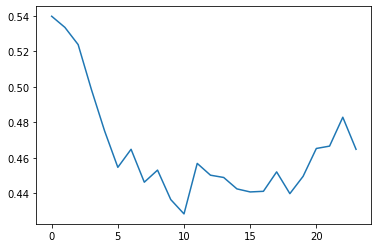

step: 0/4, D_loss: 2.4125307, G_loss_U: 0.49071994, G_loss_S: 0.0052937805, E_loss_t0: 1.3587674


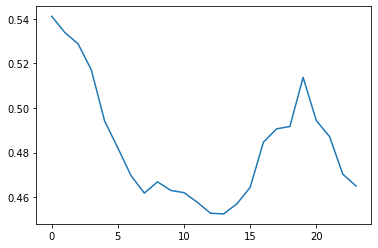

step: 0/4, D_loss: 2.38667, G_loss_U: 0.50511783, G_loss_S: 0.0053157993, E_loss_t0: 1.3568842


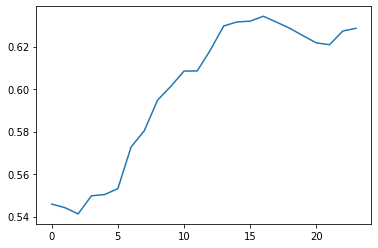

step: 0/4, D_loss: 2.357215, G_loss_U: 0.5216549, G_loss_S: 0.0055242223, E_loss_t0: 1.3734196


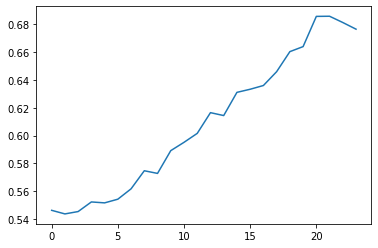

step: 0/4, D_loss: 2.3226268, G_loss_U: 0.54028946, G_loss_S: 0.0058905133, E_loss_t0: 1.345267


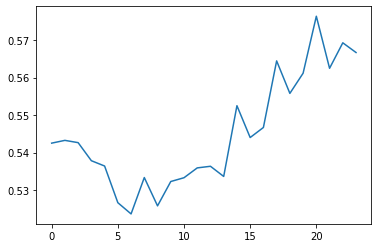

step: 0/4, D_loss: 2.2888649, G_loss_U: 0.5599597, G_loss_S: 0.0060831546, E_loss_t0: 1.3375752


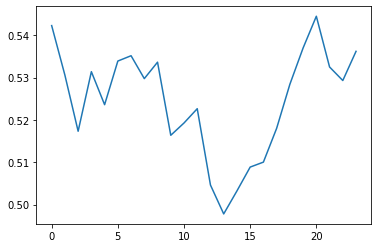

step: 0/4, D_loss: 2.2533305, G_loss_U: 0.5811158, G_loss_S: 0.0054916637, E_loss_t0: 1.2842529


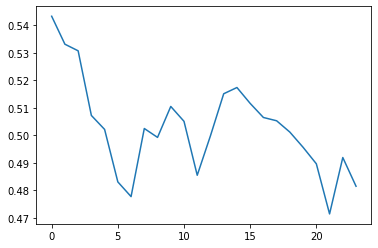

step: 0/4, D_loss: 2.2191842, G_loss_U: 0.6037722, G_loss_S: 0.006289247, E_loss_t0: 1.3006707


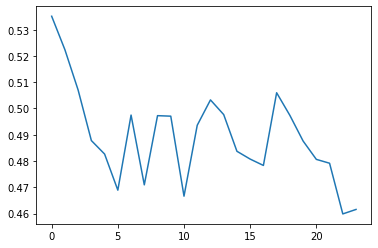

step: 0/4, D_loss: 2.185688, G_loss_U: 0.6283985, G_loss_S: 0.007535507, E_loss_t0: 1.3775216


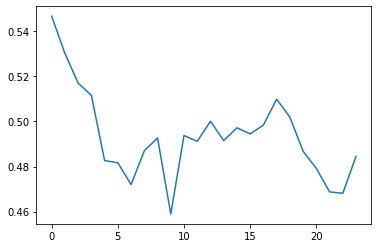

step: 0/4, D_loss: 2.1518836, G_loss_U: 0.65484554, G_loss_S: 0.007038699, E_loss_t0: 1.2967073


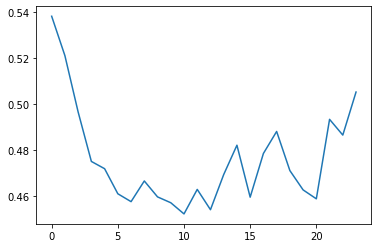

step: 0/4, D_loss: 2.1190681, G_loss_U: 0.6824207, G_loss_S: 0.0070141274, E_loss_t0: 1.2987205


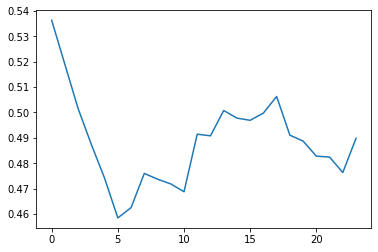

step: 0/4, D_loss: 2.0904646, G_loss_U: 0.71182185, G_loss_S: 0.0070329458, E_loss_t0: 1.2657701


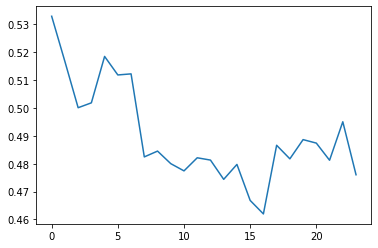

step: 0/4, D_loss: 2.0613236, G_loss_U: 0.74177796, G_loss_S: 0.0072222315, E_loss_t0: 1.2784878


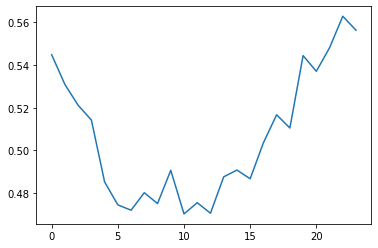

step: 0/4, D_loss: 2.0368278, G_loss_U: 0.775331, G_loss_S: 0.008047371, E_loss_t0: 1.325323


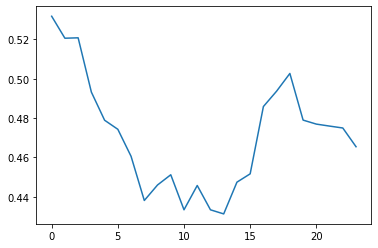

step: 0/4, D_loss: 2.011347, G_loss_U: 0.80936575, G_loss_S: 0.0074107544, E_loss_t0: 1.272506


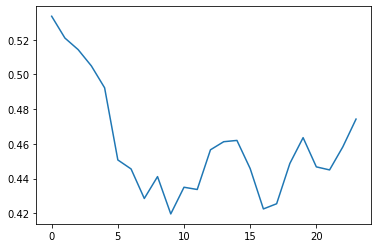

step: 0/4, D_loss: 1.9908185, G_loss_U: 0.84303826, G_loss_S: 0.0068769087, E_loss_t0: 1.2423182


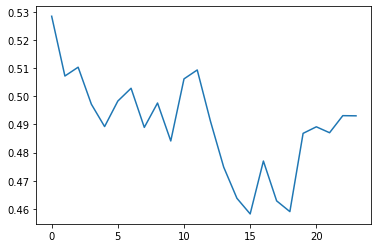

step: 0/4, D_loss: 1.9727762, G_loss_U: 0.87911797, G_loss_S: 0.0071321465, E_loss_t0: 1.2488645


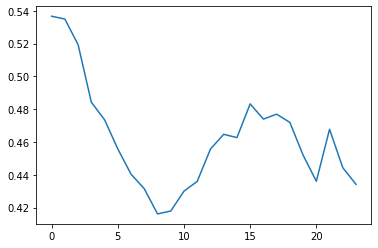

step: 0/4, D_loss: 1.957104, G_loss_U: 0.91605115, G_loss_S: 0.007816307, E_loss_t0: 1.2792232


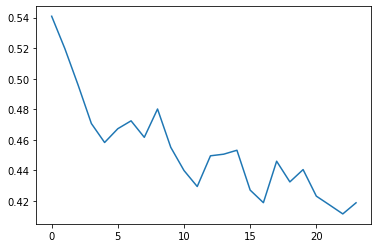

step: 0/4, D_loss: 1.9433577, G_loss_U: 0.9528553, G_loss_S: 0.007625986, E_loss_t0: 1.2616069


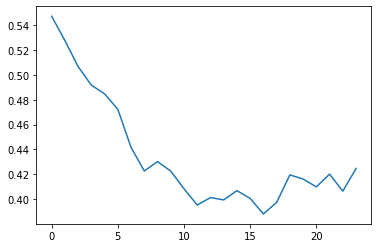

step: 0/4, D_loss: 1.9336321, G_loss_U: 0.98797923, G_loss_S: 0.007922614, E_loss_t0: 1.2966344


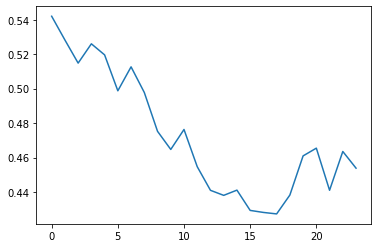

step: 0/4, D_loss: 1.9268459, G_loss_U: 1.022731, G_loss_S: 0.0069753425, E_loss_t0: 1.2354407


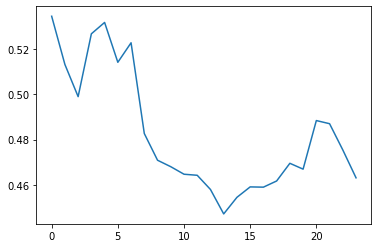

step: 0/4, D_loss: 1.922675, G_loss_U: 1.058513, G_loss_S: 0.007060361, E_loss_t0: 1.2297381


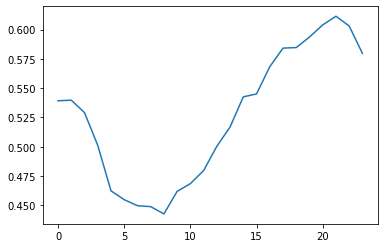

step: 0/4, D_loss: 1.9202127, G_loss_U: 1.0875442, G_loss_S: 0.007076015, E_loss_t0: 1.2261016


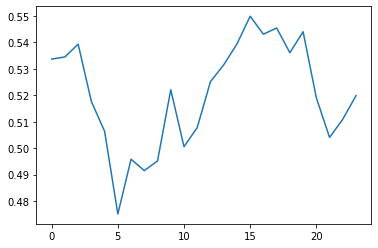

step: 0/4, D_loss: 1.9175916, G_loss_U: 1.1177326, G_loss_S: 0.007292952, E_loss_t0: 1.2445806


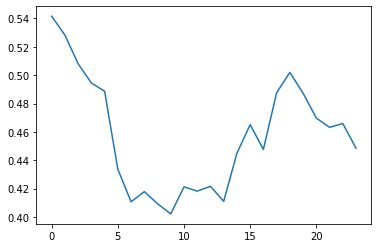

step: 0/4, D_loss: 1.9181752, G_loss_U: 1.1406795, G_loss_S: 0.007123969, E_loss_t0: 1.246129


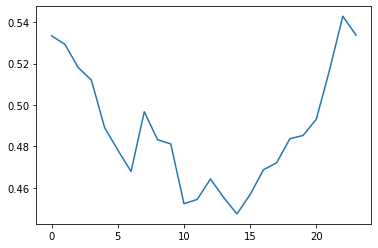

step: 0/4, D_loss: 1.9165797, G_loss_U: 1.1620078, G_loss_S: 0.0068930783, E_loss_t0: 1.2396826


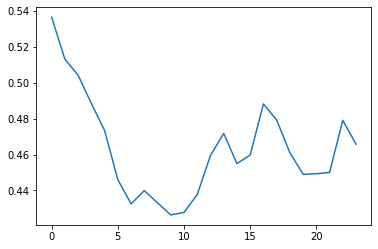

step: 0/4, D_loss: 1.9230958, G_loss_U: 1.177687, G_loss_S: 0.007201863, E_loss_t0: 1.2582905


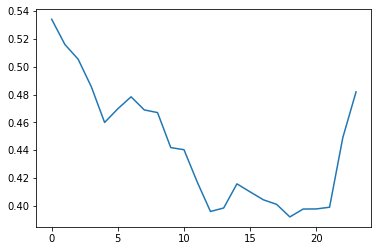

step: 0/4, D_loss: 1.9201306, G_loss_U: 1.1908551, G_loss_S: 0.007086156, E_loss_t0: 1.2177117


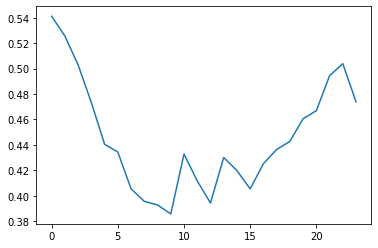

step: 0/4, D_loss: 1.9251466, G_loss_U: 1.1977555, G_loss_S: 0.0071924157, E_loss_t0: 1.2190123


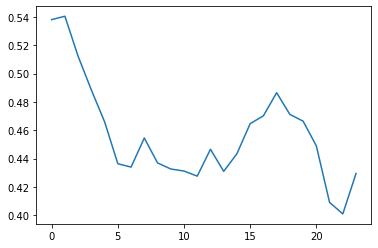

step: 0/4, D_loss: 1.9259611, G_loss_U: 1.2050468, G_loss_S: 0.0063612317, E_loss_t0: 1.2565994


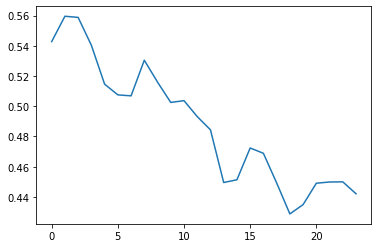

step: 0/4, D_loss: 1.9245347, G_loss_U: 1.206468, G_loss_S: 0.0061815185, E_loss_t0: 1.1856393


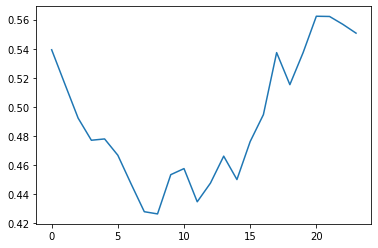

step: 0/4, D_loss: 1.9244592, G_loss_U: 1.2028803, G_loss_S: 0.005718868, E_loss_t0: 1.1920869


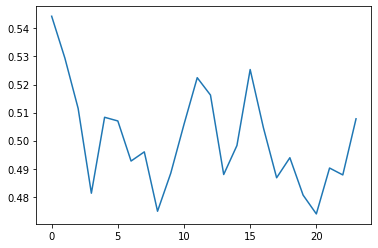

step: 0/4, D_loss: 1.9245992, G_loss_U: 1.1994768, G_loss_S: 0.005846189, E_loss_t0: 1.2091297


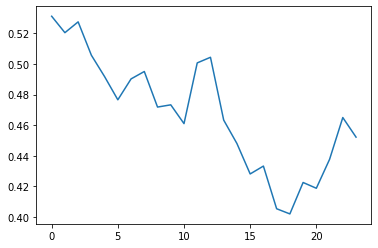

step: 0/4, D_loss: 1.9242198, G_loss_U: 1.1922616, G_loss_S: 0.0057460475, E_loss_t0: 1.2075243


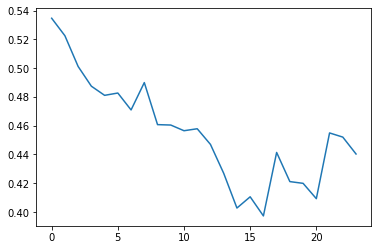

step: 0/4, D_loss: 1.9220749, G_loss_U: 1.1830963, G_loss_S: 0.006174004, E_loss_t0: 1.212619


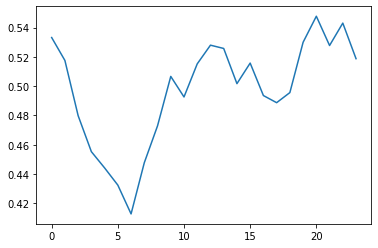

step: 0/4, D_loss: 1.9219974, G_loss_U: 1.1731449, G_loss_S: 0.0060445135, E_loss_t0: 1.2133268


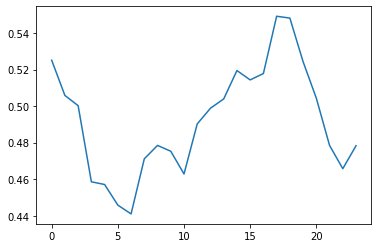

step: 0/4, D_loss: 1.9195998, G_loss_U: 1.1613212, G_loss_S: 0.0057189795, E_loss_t0: 1.224542


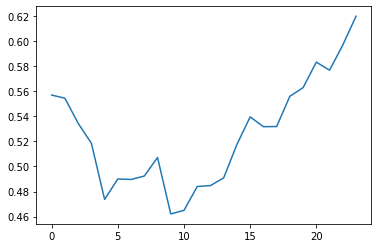

step: 0/4, D_loss: 1.9177873, G_loss_U: 1.1510876, G_loss_S: 0.0054375427, E_loss_t0: 1.2255876


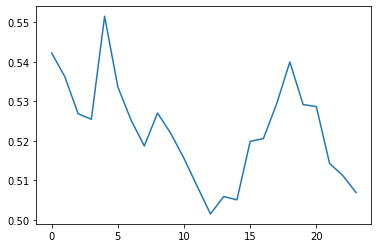

step: 0/4, D_loss: 1.9173222, G_loss_U: 1.1369649, G_loss_S: 0.0050164373, E_loss_t0: 1.175456


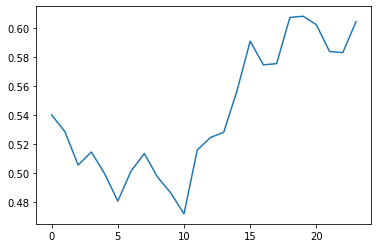

step: 0/4, D_loss: 1.916727, G_loss_U: 1.1263859, G_loss_S: 0.005051518, E_loss_t0: 1.1908044


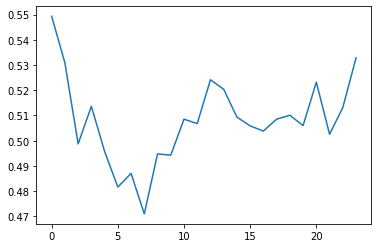

step: 0/4, D_loss: 1.9134884, G_loss_U: 1.1139897, G_loss_S: 0.0044547357, E_loss_t0: 1.1698112


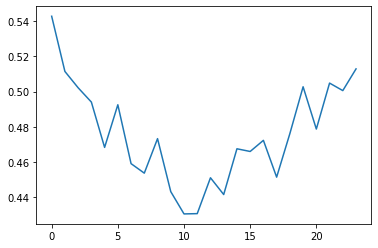

step: 0/4, D_loss: 1.9145632, G_loss_U: 1.1026407, G_loss_S: 0.004885774, E_loss_t0: 1.1933528


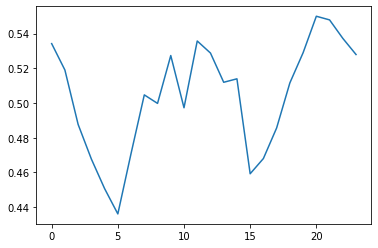

step: 0/4, D_loss: 1.9134243, G_loss_U: 1.0918111, G_loss_S: 0.0049769436, E_loss_t0: 1.1977267


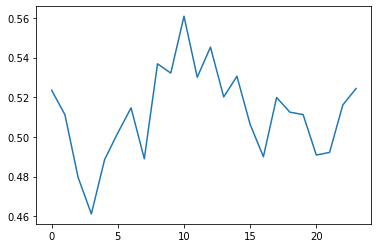

step: 0/4, D_loss: 1.9122366, G_loss_U: 1.0827409, G_loss_S: 0.00477445, E_loss_t0: 1.2036058


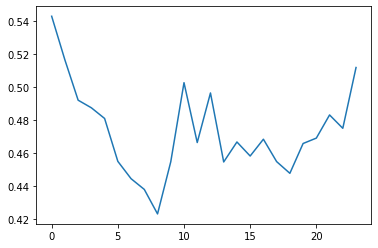

step: 0/4, D_loss: 1.9134877, G_loss_U: 1.0742267, G_loss_S: 0.0046744705, E_loss_t0: 1.1738161


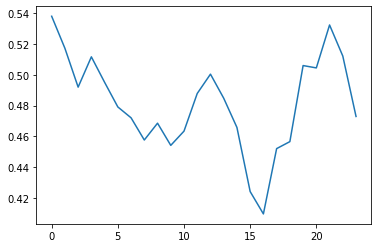

step: 0/4, D_loss: 1.9144404, G_loss_U: 1.0655571, G_loss_S: 0.00489276, E_loss_t0: 1.1892997


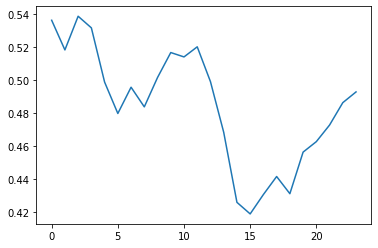

step: 0/4, D_loss: 1.911015, G_loss_U: 1.0620348, G_loss_S: 0.0044228863, E_loss_t0: 1.1593174


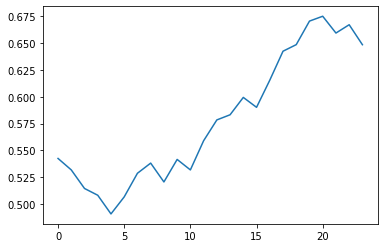

step: 0/4, D_loss: 1.9134772, G_loss_U: 1.0561241, G_loss_S: 0.0044000237, E_loss_t0: 1.1710366


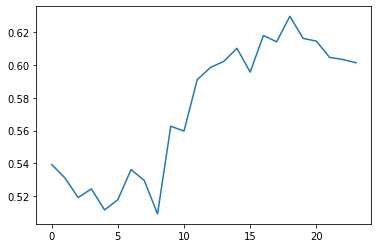

step: 0/4, D_loss: 1.9127337, G_loss_U: 1.0528232, G_loss_S: 0.004401745, E_loss_t0: 1.1872331


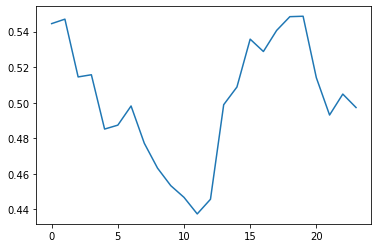

step: 0/4, D_loss: 1.912488, G_loss_U: 1.0524143, G_loss_S: 0.0045468295, E_loss_t0: 1.1933403


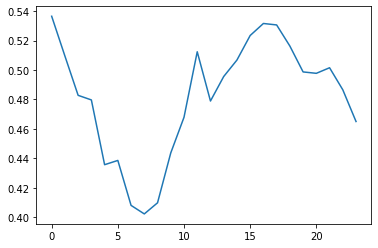

step: 0/4, D_loss: 1.9109997, G_loss_U: 1.0496485, G_loss_S: 0.0048032617, E_loss_t0: 1.1881496


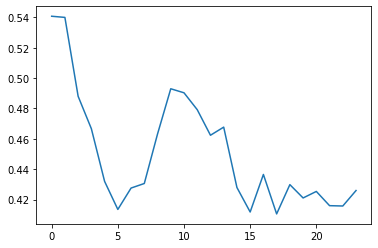

step: 0/4, D_loss: 1.9119922, G_loss_U: 1.0487647, G_loss_S: 0.0043929173, E_loss_t0: 1.1222794


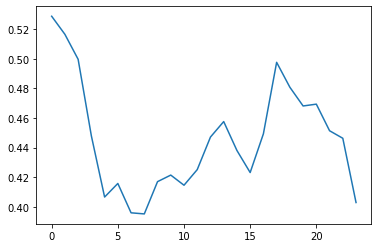

step: 0/4, D_loss: 1.9104139, G_loss_U: 1.0506278, G_loss_S: 0.004805242, E_loss_t0: 1.1800444


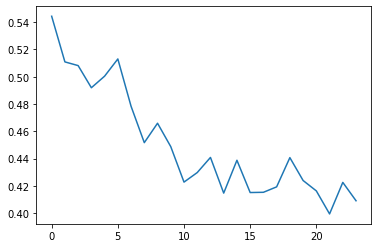

step: 0/4, D_loss: 1.9124055, G_loss_U: 1.0511947, G_loss_S: 0.004604112, E_loss_t0: 1.173621


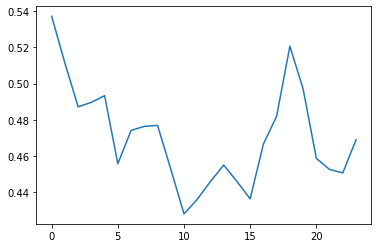

step: 0/4, D_loss: 1.9111441, G_loss_U: 1.0535344, G_loss_S: 0.0044793338, E_loss_t0: 1.1505731


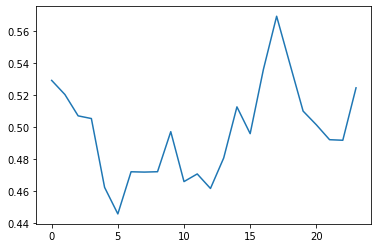

step: 0/4, D_loss: 1.9091971, G_loss_U: 1.0557286, G_loss_S: 0.0042590564, E_loss_t0: 1.1279423


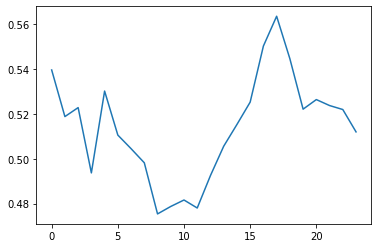

step: 0/4, D_loss: 1.9078183, G_loss_U: 1.0590459, G_loss_S: 0.004398578, E_loss_t0: 1.130738


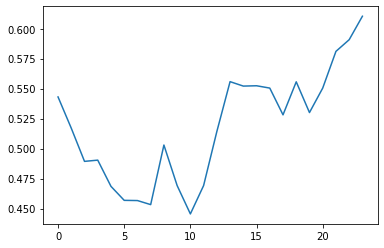

step: 0/4, D_loss: 1.9075323, G_loss_U: 1.0599159, G_loss_S: 0.0045143054, E_loss_t0: 1.1679673


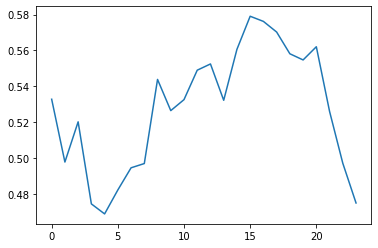

step: 0/4, D_loss: 1.9070872, G_loss_U: 1.0619655, G_loss_S: 0.004667246, E_loss_t0: 1.1704953


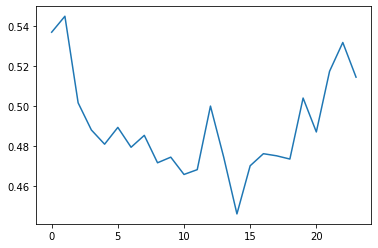

step: 0/4, D_loss: 1.9045275, G_loss_U: 1.0646758, G_loss_S: 0.0047836397, E_loss_t0: 1.1404226


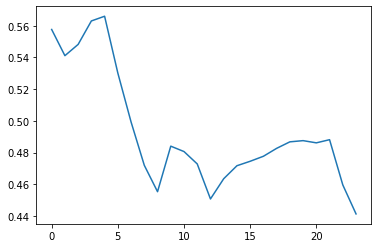

step: 0/4, D_loss: 1.9047647, G_loss_U: 1.0669597, G_loss_S: 0.0046367664, E_loss_t0: 1.1537756


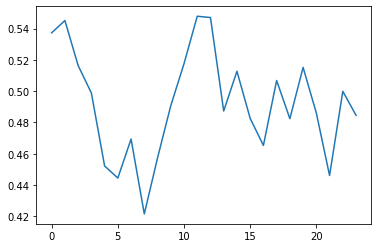

step: 0/4, D_loss: 1.9031763, G_loss_U: 1.0669463, G_loss_S: 0.0044344417, E_loss_t0: 1.1242535


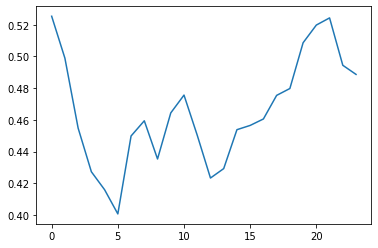

step: 0/4, D_loss: 1.9056356, G_loss_U: 1.0700866, G_loss_S: 0.0045940294, E_loss_t0: 1.1352601


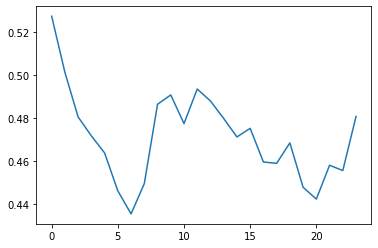

step: 0/4, D_loss: 1.9040917, G_loss_U: 1.0679178, G_loss_S: 0.00446487, E_loss_t0: 1.1311022


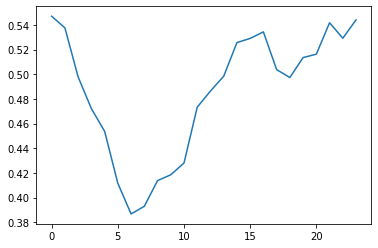

step: 0/4, D_loss: 1.8990921, G_loss_U: 1.0682402, G_loss_S: 0.004729549, E_loss_t0: 1.147066


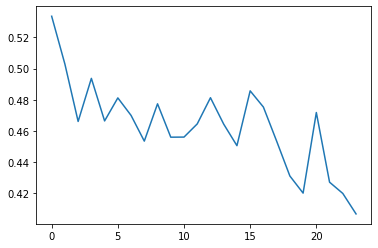

step: 0/4, D_loss: 1.8965408, G_loss_U: 1.0647012, G_loss_S: 0.004754395, E_loss_t0: 1.141906


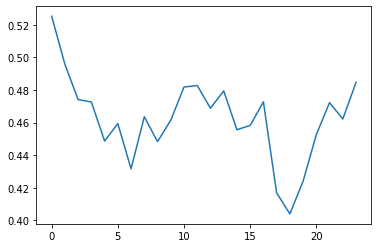

step: 0/4, D_loss: 1.8953084, G_loss_U: 1.0599108, G_loss_S: 0.004714498, E_loss_t0: 1.1305794


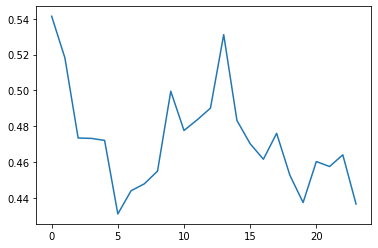

step: 0/4, D_loss: 1.8905549, G_loss_U: 1.053733, G_loss_S: 0.00452287, E_loss_t0: 1.1188915


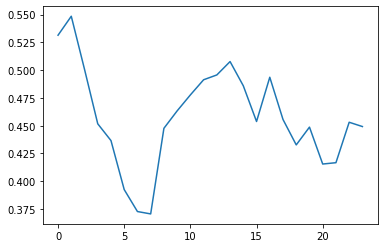

step: 0/4, D_loss: 1.8897464, G_loss_U: 1.0478307, G_loss_S: 0.0046490785, E_loss_t0: 1.140632


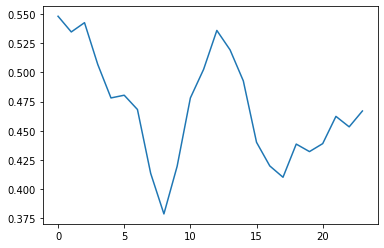

step: 0/4, D_loss: 1.8845222, G_loss_U: 1.0458285, G_loss_S: 0.004415291, E_loss_t0: 1.139232


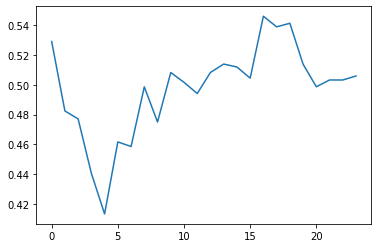

step: 0/4, D_loss: 1.8834482, G_loss_U: 1.0458902, G_loss_S: 0.0044895913, E_loss_t0: 1.1136316


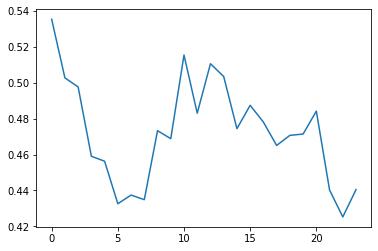

step: 0/4, D_loss: 1.8625698, G_loss_U: 1.0522782, G_loss_S: 0.0046107997, E_loss_t0: 1.1055969


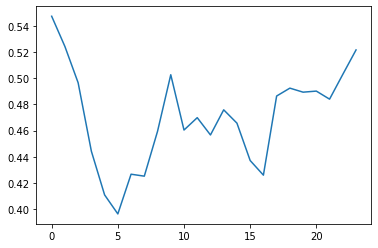

step: 0/4, D_loss: 1.846529, G_loss_U: 1.0525835, G_loss_S: 0.0046464023, E_loss_t0: 1.1010866


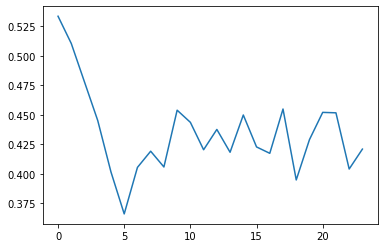

step: 0/4, D_loss: 1.8389772, G_loss_U: 1.0425783, G_loss_S: 0.004409726, E_loss_t0: 1.089955


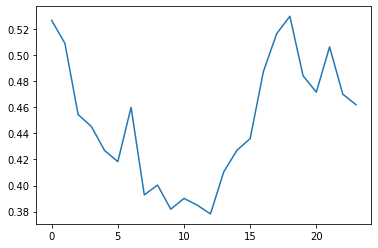

step: 0/4, D_loss: 1.8237208, G_loss_U: 1.0217885, G_loss_S: 0.004445564, E_loss_t0: 1.0785873


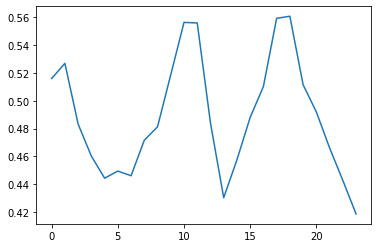

step: 0/4, D_loss: 1.8131272, G_loss_U: 1.0048667, G_loss_S: 0.0046749683, E_loss_t0: 1.1300665


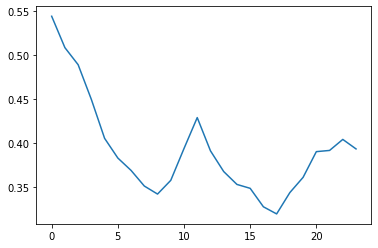

step: 0/4, D_loss: 1.7757126, G_loss_U: 0.99730873, G_loss_S: 0.0043453937, E_loss_t0: 1.0761827


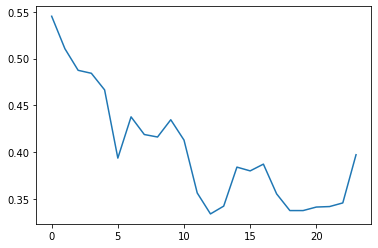

step: 0/4, D_loss: 1.7556795, G_loss_U: 1.0131128, G_loss_S: 0.0044205114, E_loss_t0: 1.1031039


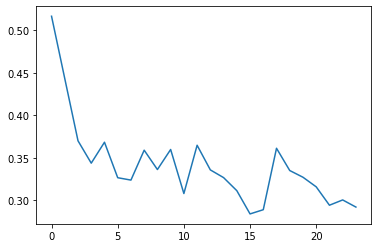

step: 0/4, D_loss: 1.7255526, G_loss_U: 1.0658066, G_loss_S: 0.004625417, E_loss_t0: 1.0843886


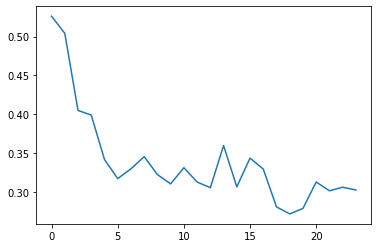

step: 0/4, D_loss: 1.6769545, G_loss_U: 1.0919577, G_loss_S: 0.0044068866, E_loss_t0: 1.0900313


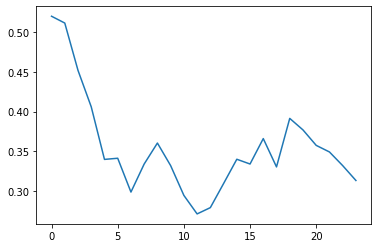

step: 0/4, D_loss: 1.6707265, G_loss_U: 1.1423926, G_loss_S: 0.0046461364, E_loss_t0: 1.1029538


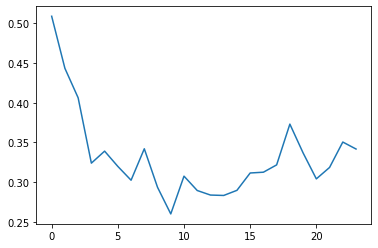

step: 0/4, D_loss: 1.6870456, G_loss_U: 1.2382507, G_loss_S: 0.0047418945, E_loss_t0: 1.1041906


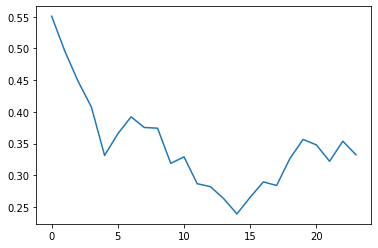

step: 0/4, D_loss: 1.6735288, G_loss_U: 1.2575711, G_loss_S: 0.0046333936, E_loss_t0: 1.1176972


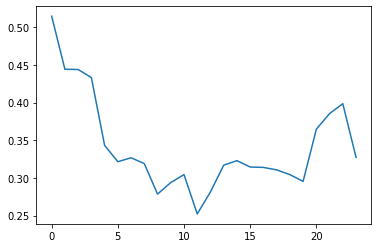

step: 0/4, D_loss: 1.6000516, G_loss_U: 1.2111617, G_loss_S: 0.004891913, E_loss_t0: 1.1065811


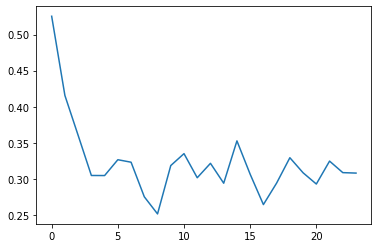

step: 0/4, D_loss: 1.5957991, G_loss_U: 1.2967417, G_loss_S: 0.0047939587, E_loss_t0: 1.1008339


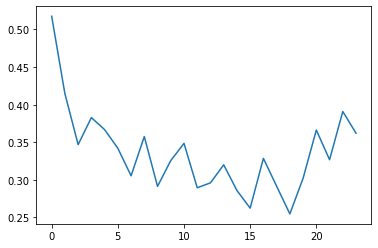

step: 0/4, D_loss: 1.534854, G_loss_U: 1.3790541, G_loss_S: 0.004815982, E_loss_t0: 1.0828264


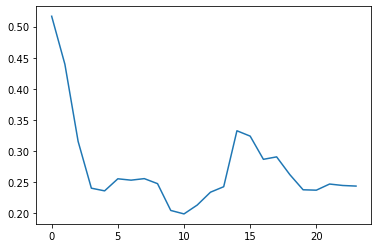

step: 0/4, D_loss: 1.534306, G_loss_U: 1.414555, G_loss_S: 0.0049321386, E_loss_t0: 1.0667542


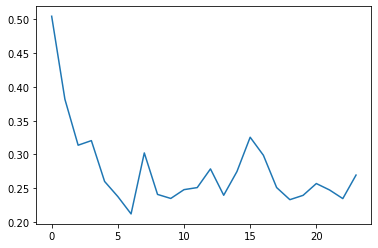

step: 0/4, D_loss: 1.6023962, G_loss_U: 1.42175, G_loss_S: 0.005067256, E_loss_t0: 1.0877527


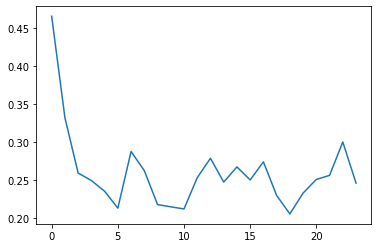

step: 0/4, D_loss: 1.5036156, G_loss_U: 1.512231, G_loss_S: 0.004965026, E_loss_t0: 1.0874319


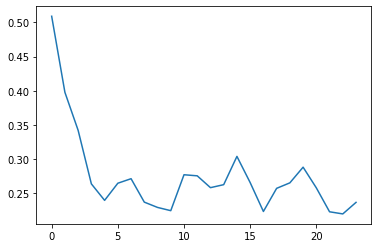

step: 0/4, D_loss: 1.515567, G_loss_U: 1.5142856, G_loss_S: 0.00532929, E_loss_t0: 1.0896096


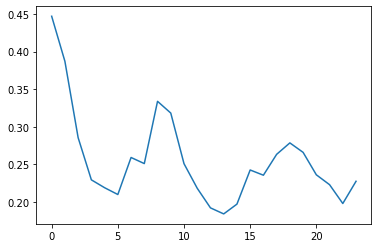

step: 0/4, D_loss: 1.5500444, G_loss_U: 1.4920124, G_loss_S: 0.0053575584, E_loss_t0: 1.0750798


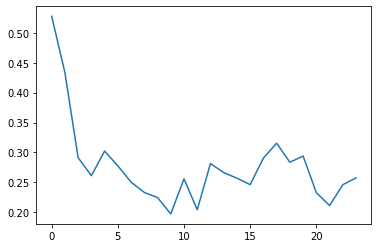

step: 0/4, D_loss: 1.4793173, G_loss_U: 1.5324532, G_loss_S: 0.005703884, E_loss_t0: 1.107575


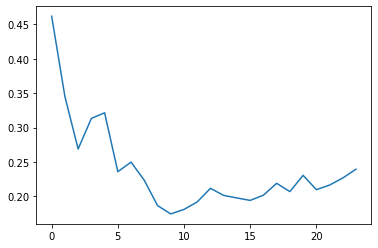

step: 0/4, D_loss: 1.3700503, G_loss_U: 1.5514346, G_loss_S: 0.006139444, E_loss_t0: 1.1007085


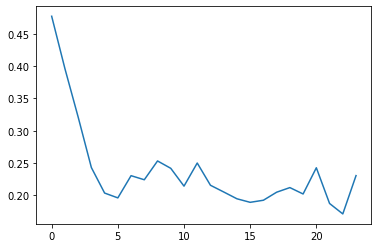

step: 0/4, D_loss: 1.4605464, G_loss_U: 1.519219, G_loss_S: 0.0059098983, E_loss_t0: 1.0924577


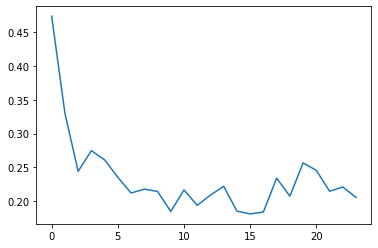

step: 0/4, D_loss: 1.4426341, G_loss_U: 1.556818, G_loss_S: 0.00609215, E_loss_t0: 1.0782264


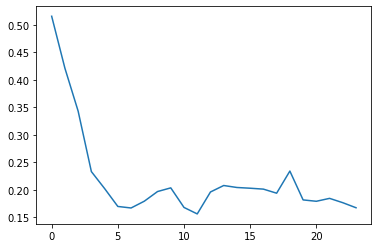

step: 0/4, D_loss: 1.3960183, G_loss_U: 1.5223141, G_loss_S: 0.006682201, E_loss_t0: 1.0856488


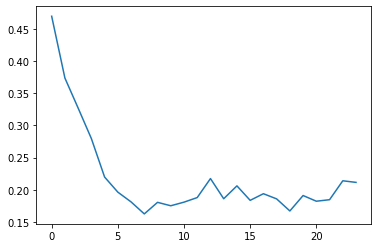

step: 0/4, D_loss: 1.3842099, G_loss_U: 1.4384866, G_loss_S: 0.0066040233, E_loss_t0: 1.1004778


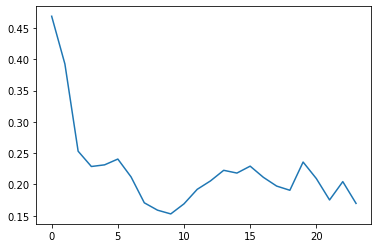

step: 0/4, D_loss: 1.4224634, G_loss_U: 1.4610416, G_loss_S: 0.0068344097, E_loss_t0: 1.0832345


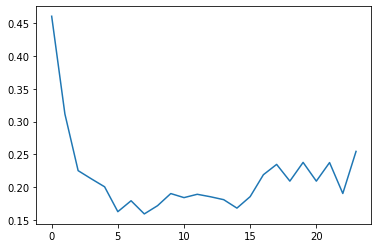

step: 0/4, D_loss: 1.3626034, G_loss_U: 1.5467647, G_loss_S: 0.006908119, E_loss_t0: 1.0809495


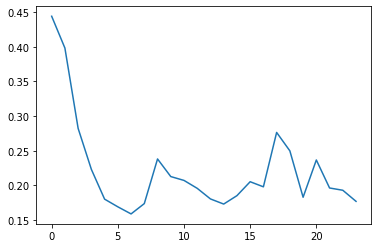

step: 0/4, D_loss: 1.4045857, G_loss_U: 1.5297384, G_loss_S: 0.007218906, E_loss_t0: 1.0555696


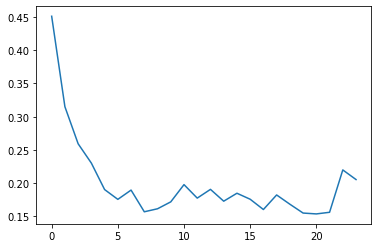

step: 1/4, D_loss: 2.2279854, G_loss_U: 0.30308226, G_loss_S: 0.008913331, E_loss_t0: 1.0574291


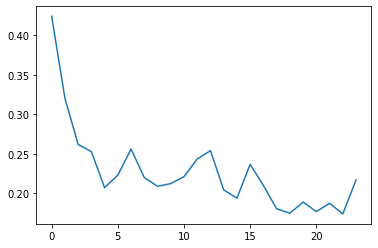

step: 1/4, D_loss: 2.2870123, G_loss_U: 0.250082, G_loss_S: 0.009074618, E_loss_t0: 1.0911877


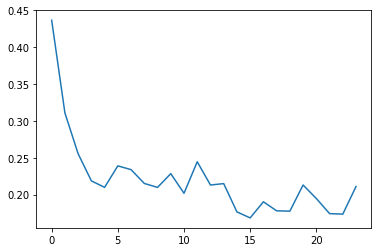

step: 1/4, D_loss: 2.3437915, G_loss_U: 0.22989072, G_loss_S: 0.008945053, E_loss_t0: 1.0759623


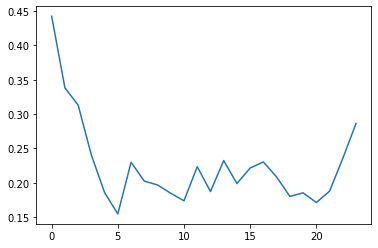

step: 1/4, D_loss: 2.369971, G_loss_U: 0.23461711, G_loss_S: 0.01054575, E_loss_t0: 1.084306


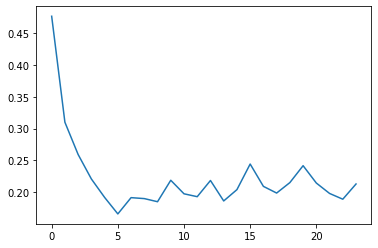

step: 1/4, D_loss: 2.2807984, G_loss_U: 0.24125154, G_loss_S: 0.00977733, E_loss_t0: 1.0793009


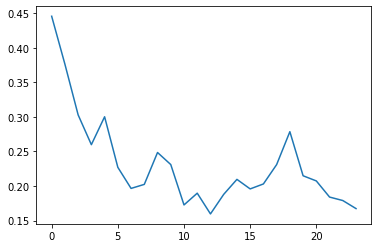

step: 1/4, D_loss: 2.2857432, G_loss_U: 0.25972417, G_loss_S: 0.009952538, E_loss_t0: 1.0818902


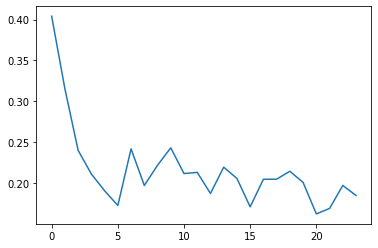

step: 1/4, D_loss: 2.2044, G_loss_U: 0.2844735, G_loss_S: 0.010542002, E_loss_t0: 1.0912485


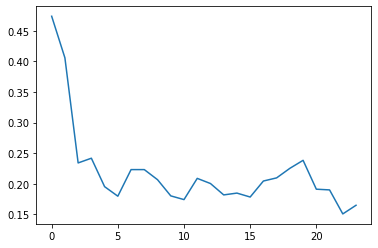

step: 1/4, D_loss: 2.1457326, G_loss_U: 0.3057974, G_loss_S: 0.0111662615, E_loss_t0: 1.078807


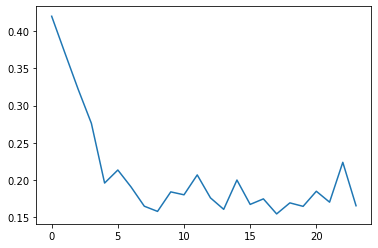

step: 1/4, D_loss: 2.053865, G_loss_U: 0.34030747, G_loss_S: 0.010076672, E_loss_t0: 1.101758


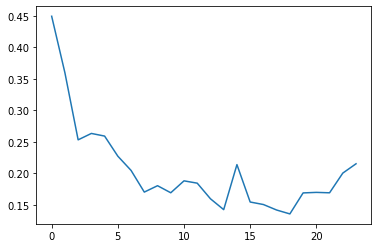

step: 1/4, D_loss: 2.0090702, G_loss_U: 0.37175167, G_loss_S: 0.010826511, E_loss_t0: 1.0819938


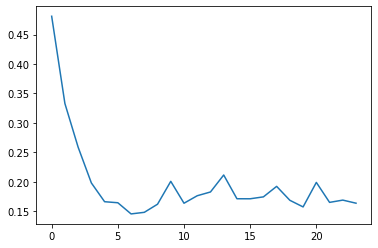

step: 1/4, D_loss: 1.9312806, G_loss_U: 0.40744662, G_loss_S: 0.011665608, E_loss_t0: 1.0921952


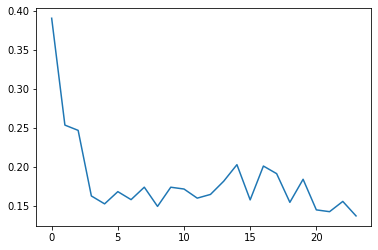

step: 1/4, D_loss: 1.9118166, G_loss_U: 0.439015, G_loss_S: 0.011203391, E_loss_t0: 1.0708094


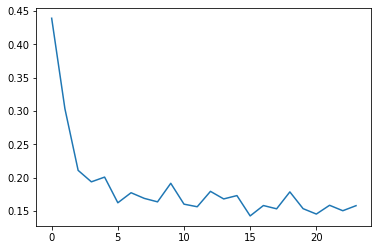

step: 1/4, D_loss: 1.8021073, G_loss_U: 0.48129883, G_loss_S: 0.010827854, E_loss_t0: 1.1050637


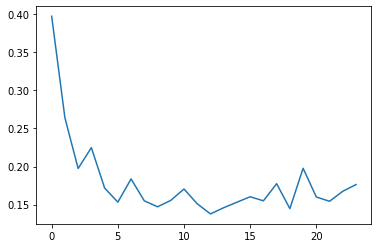

step: 1/4, D_loss: 1.760918, G_loss_U: 0.5217459, G_loss_S: 0.011100006, E_loss_t0: 1.0882132


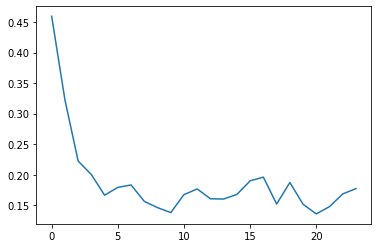

step: 1/4, D_loss: 1.7465578, G_loss_U: 0.5791035, G_loss_S: 0.010896042, E_loss_t0: 1.0709527


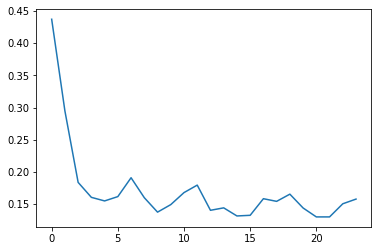

step: 1/4, D_loss: 1.7358438, G_loss_U: 0.6245536, G_loss_S: 0.011191788, E_loss_t0: 1.0627595


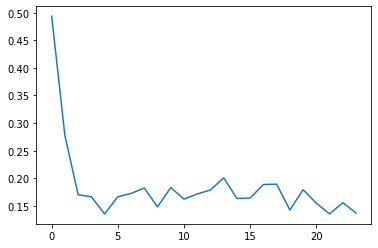

step: 1/4, D_loss: 1.7118145, G_loss_U: 0.67075324, G_loss_S: 0.011395696, E_loss_t0: 1.085725


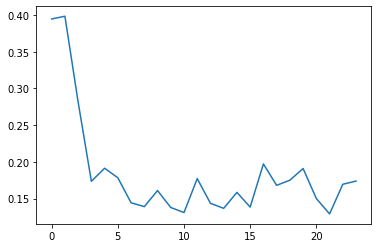

step: 1/4, D_loss: 1.6931981, G_loss_U: 0.73756623, G_loss_S: 0.010803862, E_loss_t0: 1.0579952


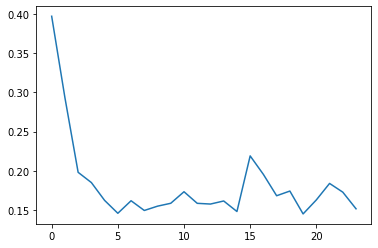

step: 1/4, D_loss: 1.6513822, G_loss_U: 0.81714755, G_loss_S: 0.011201862, E_loss_t0: 1.067088


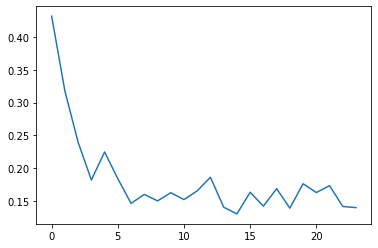

step: 1/4, D_loss: 1.637642, G_loss_U: 0.92281264, G_loss_S: 0.011908394, E_loss_t0: 1.0439718


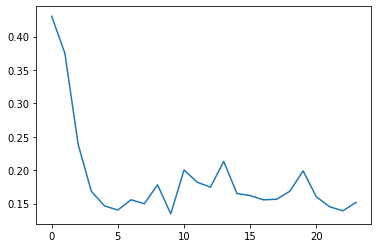

step: 1/4, D_loss: 1.5380667, G_loss_U: 1.0371755, G_loss_S: 0.010984194, E_loss_t0: 1.0499796


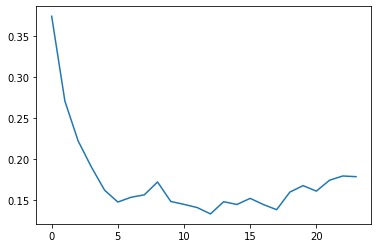

step: 1/4, D_loss: 1.5356374, G_loss_U: 1.146697, G_loss_S: 0.011821352, E_loss_t0: 1.0800737


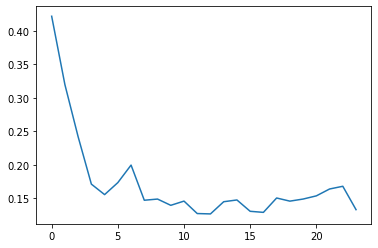

step: 1/4, D_loss: 1.5309489, G_loss_U: 1.2272735, G_loss_S: 0.011952767, E_loss_t0: 1.0420814


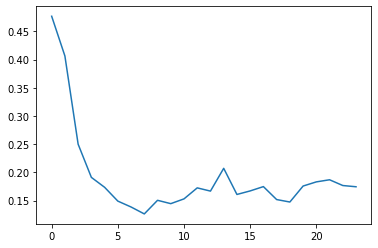

step: 1/4, D_loss: 1.5388573, G_loss_U: 1.2954384, G_loss_S: 0.011564436, E_loss_t0: 1.0461035


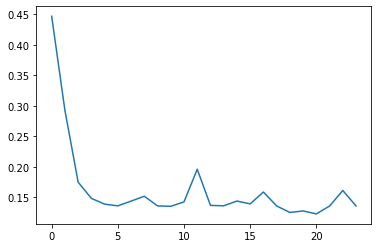

step: 1/4, D_loss: 1.5077162, G_loss_U: 1.3442326, G_loss_S: 0.012538248, E_loss_t0: 1.0474889


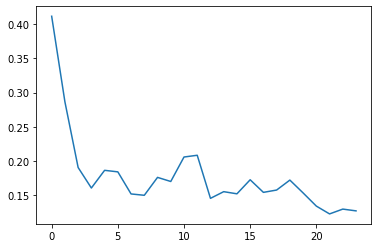

step: 1/4, D_loss: 1.5621057, G_loss_U: 1.383976, G_loss_S: 0.012433043, E_loss_t0: 1.0472045


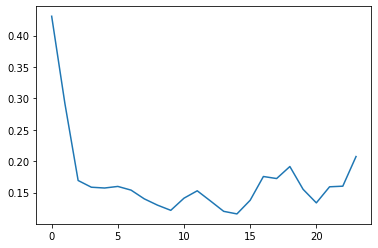

step: 1/4, D_loss: 1.5471556, G_loss_U: 1.4104644, G_loss_S: 0.013018733, E_loss_t0: 1.0526812


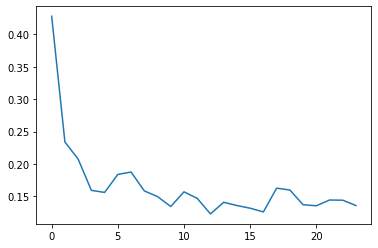

step: 1/4, D_loss: 1.5418913, G_loss_U: 1.426291, G_loss_S: 0.012864624, E_loss_t0: 1.0344783


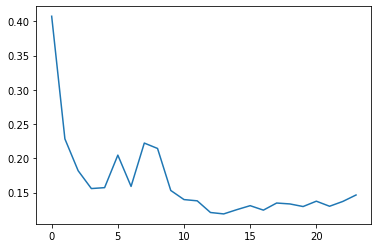

step: 1/4, D_loss: 1.4779327, G_loss_U: 1.4156662, G_loss_S: 0.012621161, E_loss_t0: 1.0382026


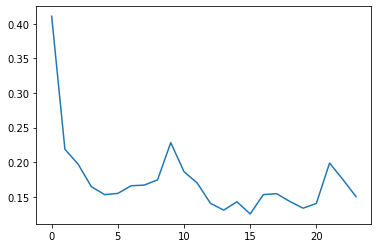

step: 1/4, D_loss: 1.3956021, G_loss_U: 1.3806329, G_loss_S: 0.012577056, E_loss_t0: 1.0368097


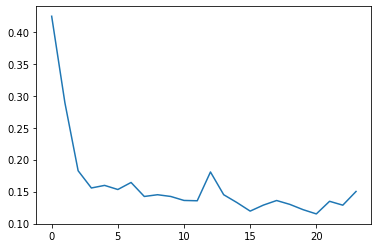

step: 1/4, D_loss: 1.3736979, G_loss_U: 1.3269218, G_loss_S: 0.013180729, E_loss_t0: 1.0302385


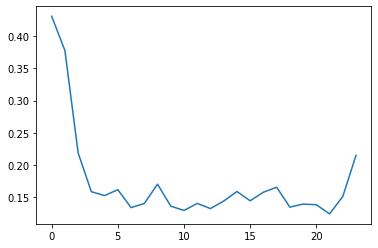

step: 1/4, D_loss: 1.3901896, G_loss_U: 1.2282076, G_loss_S: 0.01342117, E_loss_t0: 1.0567224


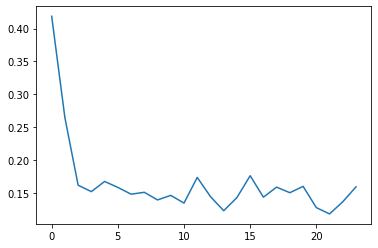

step: 1/4, D_loss: 1.3848993, G_loss_U: 1.1490355, G_loss_S: 0.013058803, E_loss_t0: 1.0494668


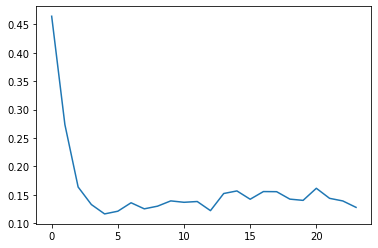

step: 1/4, D_loss: 1.4159148, G_loss_U: 1.1371502, G_loss_S: 0.013857105, E_loss_t0: 1.0631539


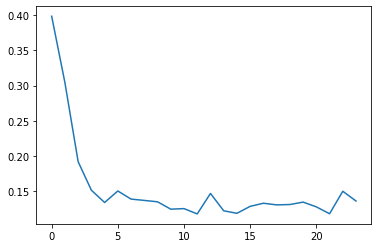

step: 1/4, D_loss: 1.3197448, G_loss_U: 1.198937, G_loss_S: 0.012882309, E_loss_t0: 1.0399693


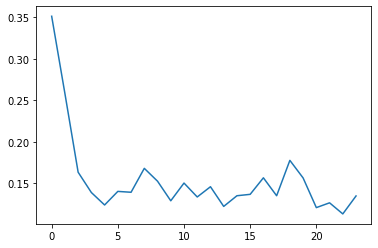

step: 1/4, D_loss: 1.3134719, G_loss_U: 1.3707892, G_loss_S: 0.012825536, E_loss_t0: 1.0319867


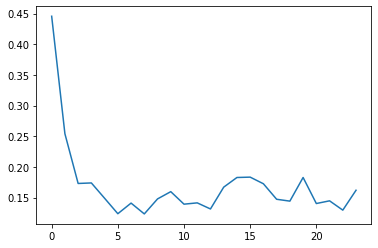

step: 1/4, D_loss: 1.2126071, G_loss_U: 1.5596622, G_loss_S: 0.012403064, E_loss_t0: 1.0650728


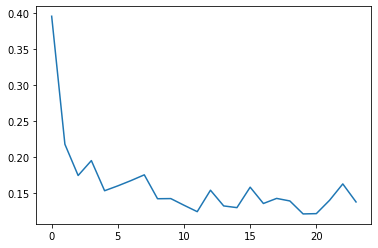

step: 1/4, D_loss: 1.2906004, G_loss_U: 1.7172176, G_loss_S: 0.013960978, E_loss_t0: 1.0486007


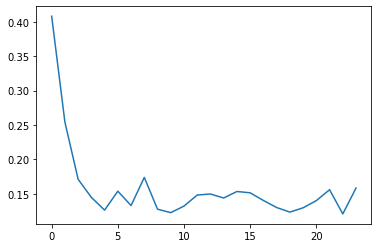

step: 1/4, D_loss: 1.2639792, G_loss_U: 1.813708, G_loss_S: 0.011645642, E_loss_t0: 1.024939


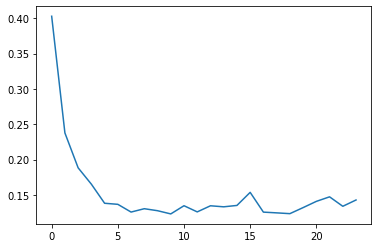

step: 1/4, D_loss: 1.3086433, G_loss_U: 1.8358499, G_loss_S: 0.01296178, E_loss_t0: 1.0609422


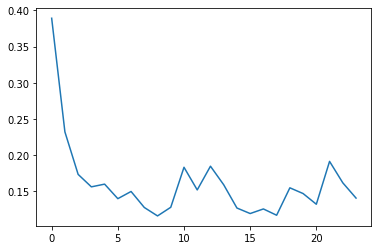

step: 1/4, D_loss: 1.2484578, G_loss_U: 1.831224, G_loss_S: 0.013036906, E_loss_t0: 1.0513164


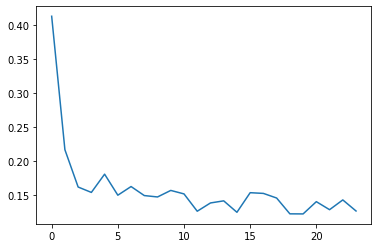

step: 1/4, D_loss: 1.2556195, G_loss_U: 1.7417173, G_loss_S: 0.013526438, E_loss_t0: 1.0541049


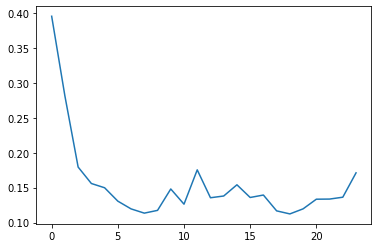

step: 1/4, D_loss: 1.1148378, G_loss_U: 1.5805392, G_loss_S: 0.012351586, E_loss_t0: 1.0360098


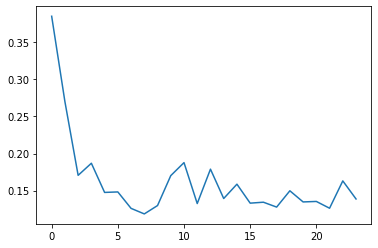

step: 1/4, D_loss: 1.1818391, G_loss_U: 1.5019208, G_loss_S: 0.012186143, E_loss_t0: 1.0655154


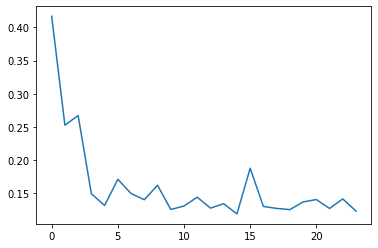

step: 1/4, D_loss: 1.1423314, G_loss_U: 1.6820216, G_loss_S: 0.011520176, E_loss_t0: 1.0353332


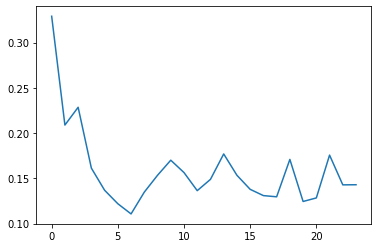

step: 1/4, D_loss: 1.1311065, G_loss_U: 1.887353, G_loss_S: 0.012535135, E_loss_t0: 1.0572993


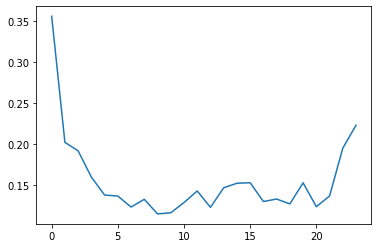

step: 1/4, D_loss: 0.9496681, G_loss_U: 2.0169148, G_loss_S: 0.011142411, E_loss_t0: 1.059966


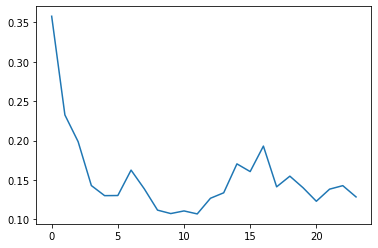

step: 1/4, D_loss: 1.1702427, G_loss_U: 2.0347188, G_loss_S: 0.012838176, E_loss_t0: 1.0704954


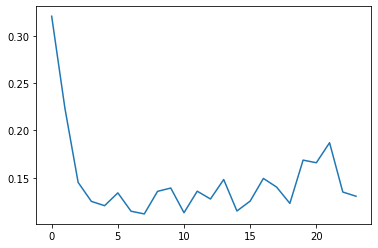

step: 1/4, D_loss: 0.98712456, G_loss_U: 1.9819694, G_loss_S: 0.012162179, E_loss_t0: 1.0850952


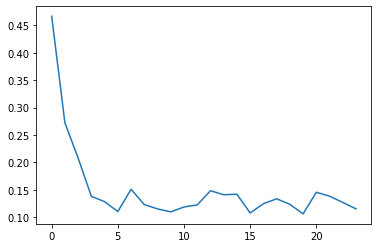

step: 1/4, D_loss: 0.9036372, G_loss_U: 1.7501696, G_loss_S: 0.010595424, E_loss_t0: 1.0518519


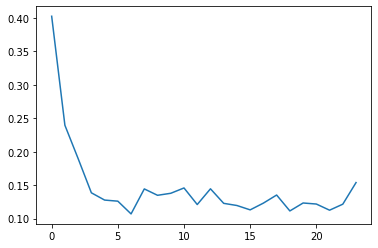

step: 1/4, D_loss: 0.9334551, G_loss_U: 1.6152884, G_loss_S: 0.011310661, E_loss_t0: 1.0629816


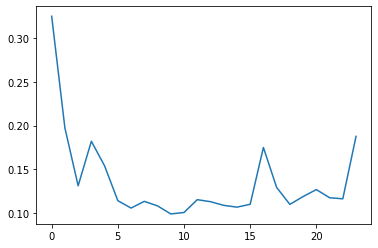

step: 1/4, D_loss: 0.91543156, G_loss_U: 1.9484411, G_loss_S: 0.011034183, E_loss_t0: 1.060873


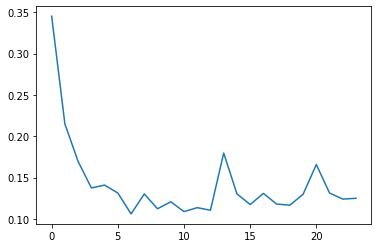

step: 1/4, D_loss: 0.8684113, G_loss_U: 2.0931933, G_loss_S: 0.011881561, E_loss_t0: 1.0669916


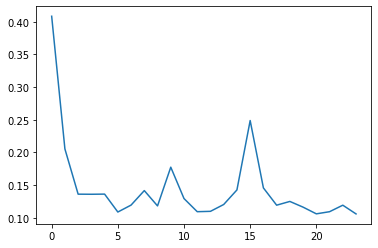

step: 1/4, D_loss: 0.78533787, G_loss_U: 2.1151679, G_loss_S: 0.010896289, E_loss_t0: 1.0609666


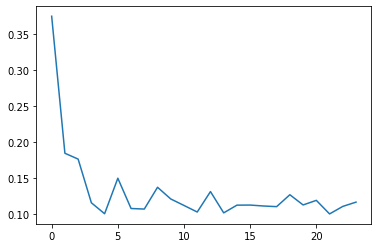

step: 1/4, D_loss: 0.617388, G_loss_U: 2.0526361, G_loss_S: 0.010168616, E_loss_t0: 1.0738869


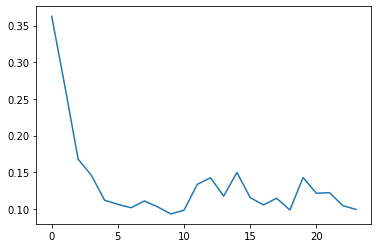

step: 1/4, D_loss: 0.63801134, G_loss_U: 1.8537513, G_loss_S: 0.01122209, E_loss_t0: 1.0893846


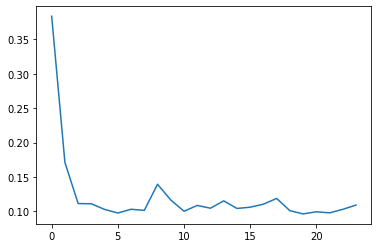

step: 1/4, D_loss: 0.5509522, G_loss_U: 2.0423393, G_loss_S: 0.009698162, E_loss_t0: 1.0883092


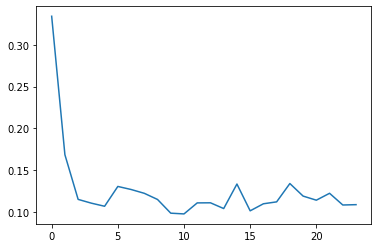

step: 1/4, D_loss: 0.5171514, G_loss_U: 2.2782104, G_loss_S: 0.010139807, E_loss_t0: 1.0706578


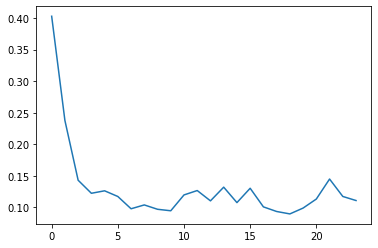

step: 1/4, D_loss: 0.48112687, G_loss_U: 2.420208, G_loss_S: 0.010247239, E_loss_t0: 1.0717274


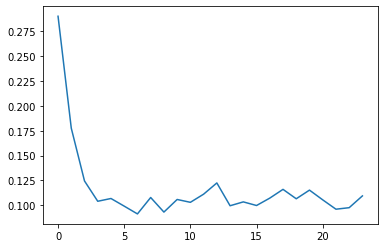

step: 1/4, D_loss: 0.46662667, G_loss_U: 2.4587643, G_loss_S: 0.009988951, E_loss_t0: 1.0997353


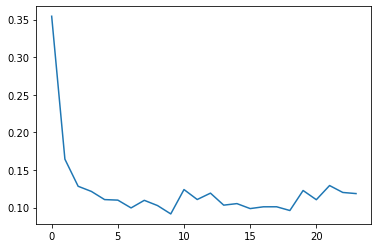

step: 1/4, D_loss: 0.39014587, G_loss_U: 2.4755604, G_loss_S: 0.009600365, E_loss_t0: 1.065748


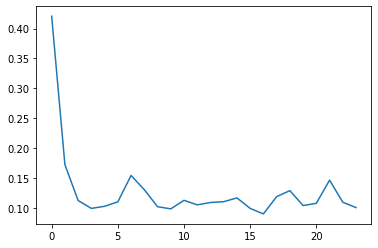

step: 1/4, D_loss: 0.3480196, G_loss_U: 2.466037, G_loss_S: 0.0091513675, E_loss_t0: 1.0738543


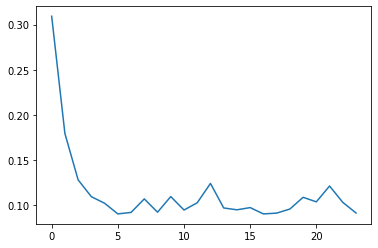

step: 1/4, D_loss: 0.38116056, G_loss_U: 2.5941317, G_loss_S: 0.009541953, E_loss_t0: 1.106392


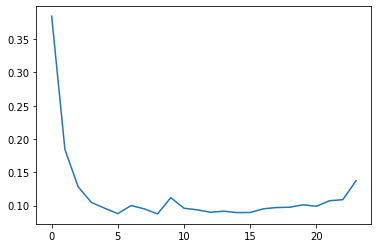

step: 1/4, D_loss: 0.32638583, G_loss_U: 2.756127, G_loss_S: 0.00960738, E_loss_t0: 1.1122872


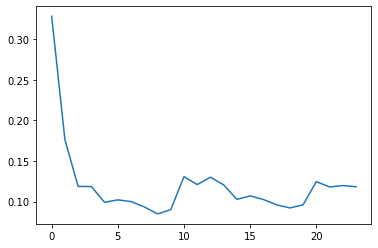

step: 1/4, D_loss: 0.300155, G_loss_U: 2.8154824, G_loss_S: 0.009427308, E_loss_t0: 1.0689226


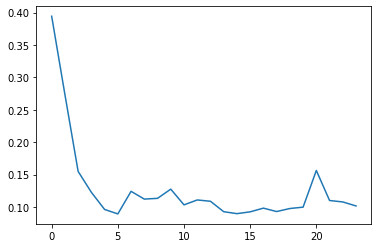

step: 1/4, D_loss: 0.26480204, G_loss_U: 2.8552742, G_loss_S: 0.008912673, E_loss_t0: 1.0729357


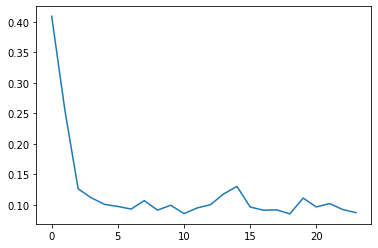

step: 1/4, D_loss: 0.2584197, G_loss_U: 2.9516907, G_loss_S: 0.008985233, E_loss_t0: 1.127832


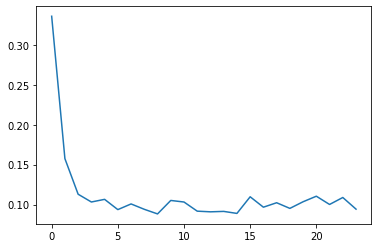

step: 1/4, D_loss: 0.23973835, G_loss_U: 3.0024707, G_loss_S: 0.009326592, E_loss_t0: 1.0784975


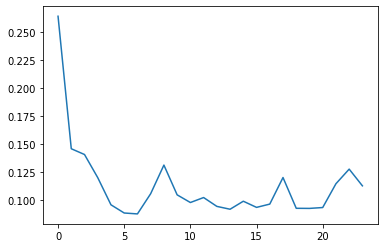

step: 1/4, D_loss: 0.23401362, G_loss_U: 3.107898, G_loss_S: 0.009144936, E_loss_t0: 1.0717709


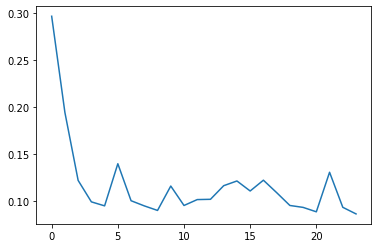

step: 1/4, D_loss: 0.25391072, G_loss_U: 3.1254184, G_loss_S: 0.008669313, E_loss_t0: 1.0707401


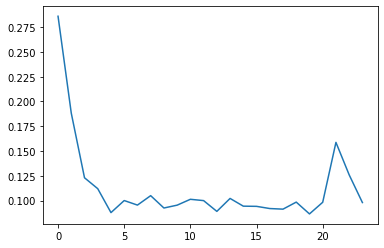

step: 1/4, D_loss: 0.22765803, G_loss_U: 3.222145, G_loss_S: 0.0088849915, E_loss_t0: 1.0829165


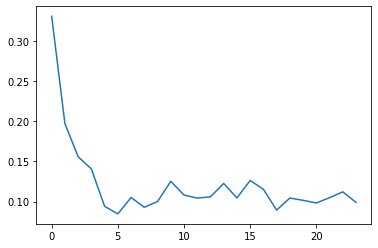

step: 1/4, D_loss: 0.29874218, G_loss_U: 3.2389297, G_loss_S: 0.008513705, E_loss_t0: 1.0638124


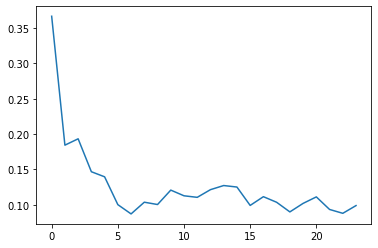

step: 1/4, D_loss: 0.24081978, G_loss_U: 3.3147528, G_loss_S: 0.008888904, E_loss_t0: 1.0991544


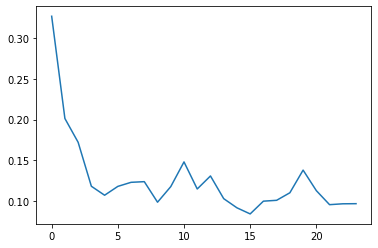

step: 1/4, D_loss: 0.28735563, G_loss_U: 3.0954735, G_loss_S: 0.0086275535, E_loss_t0: 1.0718569


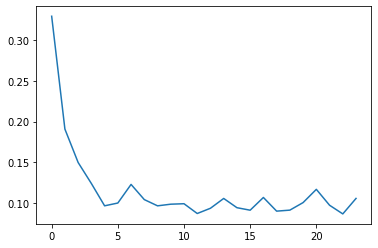

step: 1/4, D_loss: 0.49462947, G_loss_U: 3.4342535, G_loss_S: 0.008824906, E_loss_t0: 1.0573776


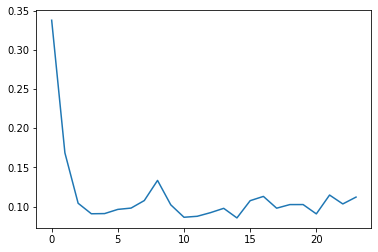

step: 1/4, D_loss: 0.80556136, G_loss_U: 3.4733398, G_loss_S: 0.008656125, E_loss_t0: 1.0806632


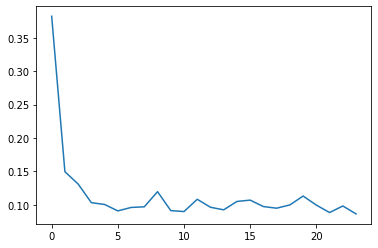

step: 1/4, D_loss: 1.2528124, G_loss_U: 3.4433887, G_loss_S: 0.008306543, E_loss_t0: 1.0752758


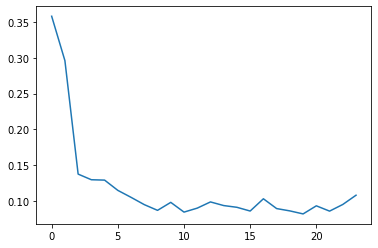

step: 1/4, D_loss: 0.26083687, G_loss_U: 3.2367895, G_loss_S: 0.008137899, E_loss_t0: 1.074066


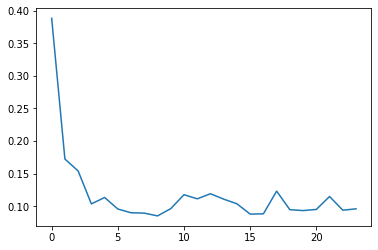

step: 1/4, D_loss: 0.224372, G_loss_U: 2.9764469, G_loss_S: 0.008048959, E_loss_t0: 1.1080537


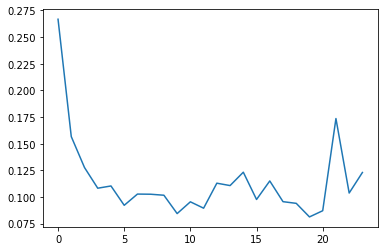

step: 1/4, D_loss: 0.57502186, G_loss_U: 3.4327881, G_loss_S: 0.0076535847, E_loss_t0: 1.0670662


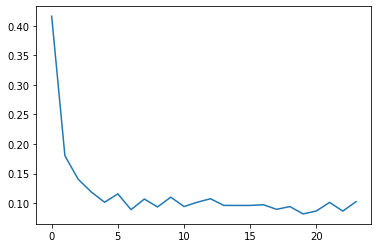

step: 1/4, D_loss: 0.16562784, G_loss_U: 3.5190856, G_loss_S: 0.008267457, E_loss_t0: 1.1010255


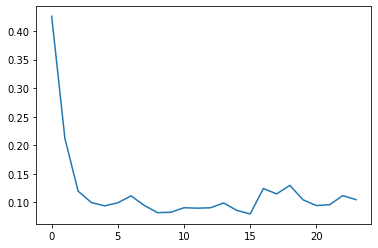

step: 1/4, D_loss: 0.2659798, G_loss_U: 3.5480785, G_loss_S: 0.0074537043, E_loss_t0: 1.0439544


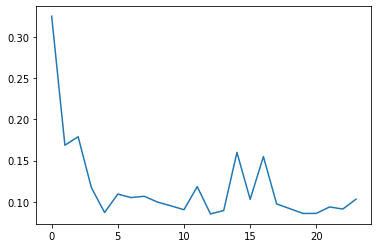

step: 1/4, D_loss: 0.4669618, G_loss_U: 3.5789893, G_loss_S: 0.007681689, E_loss_t0: 1.0667142


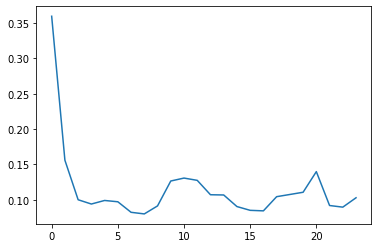

step: 1/4, D_loss: 0.6257059, G_loss_U: 3.5727403, G_loss_S: 0.00771131, E_loss_t0: 1.1196282


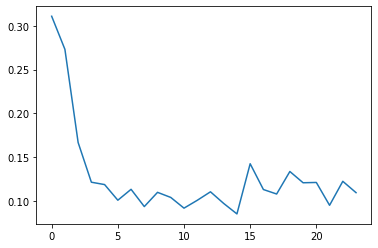

step: 1/4, D_loss: 0.18979028, G_loss_U: 3.5490656, G_loss_S: 0.007568719, E_loss_t0: 1.1226534


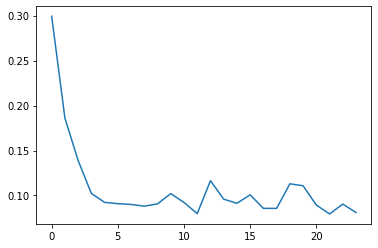

step: 1/4, D_loss: 0.13995197, G_loss_U: 3.5158541, G_loss_S: 0.0074313786, E_loss_t0: 1.1185099


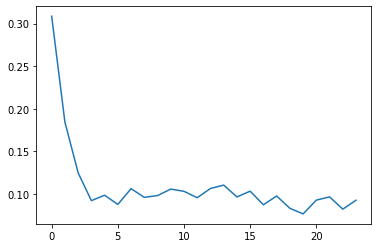

step: 1/4, D_loss: 0.12988806, G_loss_U: 3.512211, G_loss_S: 0.007664823, E_loss_t0: 1.0783819


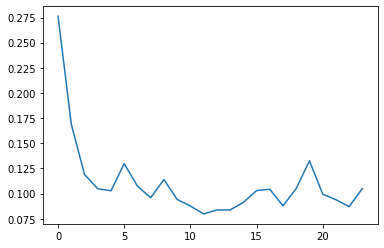

step: 1/4, D_loss: 0.14411475, G_loss_U: 3.5145442, G_loss_S: 0.0075917584, E_loss_t0: 1.0883411


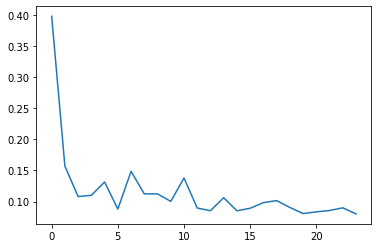

step: 1/4, D_loss: 0.14673829, G_loss_U: 3.5015056, G_loss_S: 0.0077454043, E_loss_t0: 1.1012684


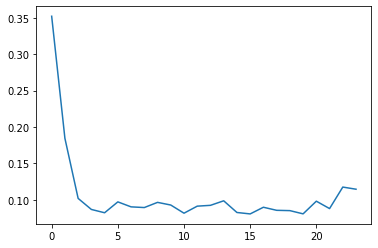

step: 1/4, D_loss: 0.14865115, G_loss_U: 3.5059907, G_loss_S: 0.0077611194, E_loss_t0: 1.0783412


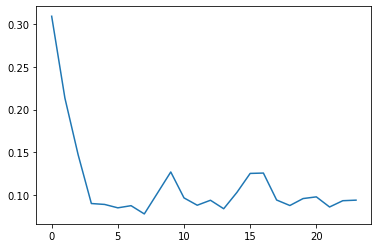

step: 1/4, D_loss: 0.14290862, G_loss_U: 3.4877682, G_loss_S: 0.008043392, E_loss_t0: 1.0996517


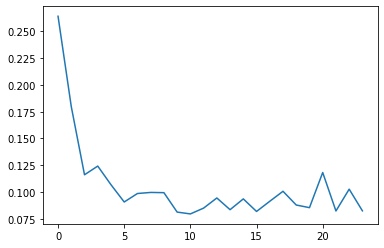

step: 1/4, D_loss: 0.15954833, G_loss_U: 3.377966, G_loss_S: 0.0077931085, E_loss_t0: 1.093066


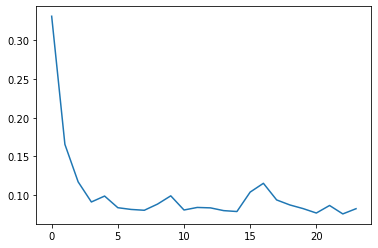

step: 1/4, D_loss: 0.19236255, G_loss_U: 3.2661905, G_loss_S: 0.007907311, E_loss_t0: 1.102004


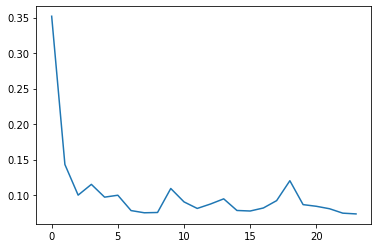

step: 1/4, D_loss: 0.28589147, G_loss_U: 3.2416973, G_loss_S: 0.008056533, E_loss_t0: 1.0653981


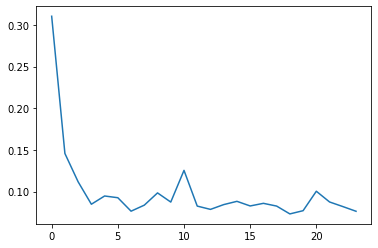

step: 1/4, D_loss: 0.32721817, G_loss_U: 3.4397695, G_loss_S: 0.008145677, E_loss_t0: 1.090494


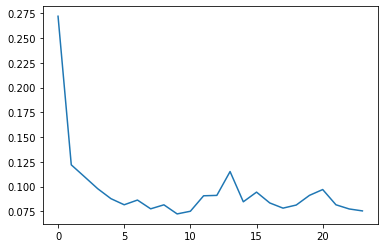

step: 1/4, D_loss: 0.18310928, G_loss_U: 3.5385683, G_loss_S: 0.008219697, E_loss_t0: 1.0786349


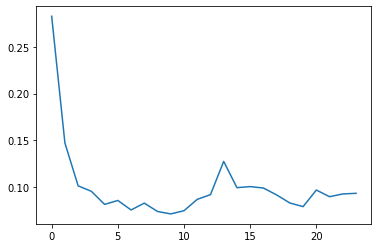

step: 1/4, D_loss: 0.14879741, G_loss_U: 3.5452144, G_loss_S: 0.00864427, E_loss_t0: 1.0675265


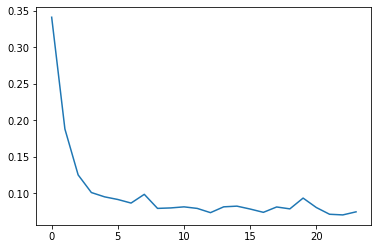

step: 1/4, D_loss: 0.14801495, G_loss_U: 3.5164635, G_loss_S: 0.00821328, E_loss_t0: 1.0811311


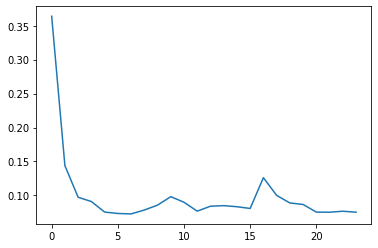

step: 1/4, D_loss: 0.15479597, G_loss_U: 3.615751, G_loss_S: 0.008555975, E_loss_t0: 1.0792764


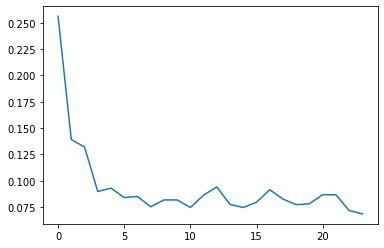

step: 1/4, D_loss: 0.13801, G_loss_U: 3.5936372, G_loss_S: 0.008243386, E_loss_t0: 1.067582


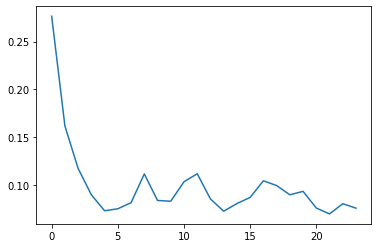

step: 2/4, D_loss: 0.170554, G_loss_U: 3.5469615, G_loss_S: 0.008155727, E_loss_t0: 1.0446359


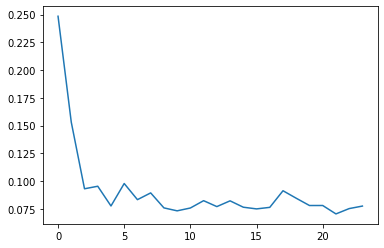

step: 2/4, D_loss: 0.20398065, G_loss_U: 3.531751, G_loss_S: 0.00773037, E_loss_t0: 1.0576662


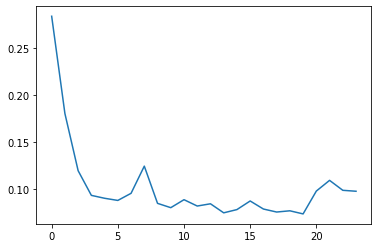

step: 2/4, D_loss: 0.17568956, G_loss_U: 3.5043619, G_loss_S: 0.007760955, E_loss_t0: 1.0441145


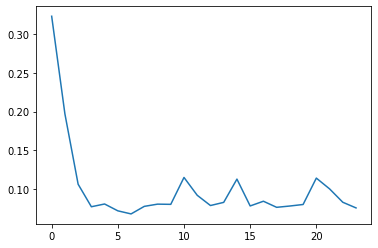

step: 2/4, D_loss: 0.1576015, G_loss_U: 3.4645593, G_loss_S: 0.0076333396, E_loss_t0: 1.0319306


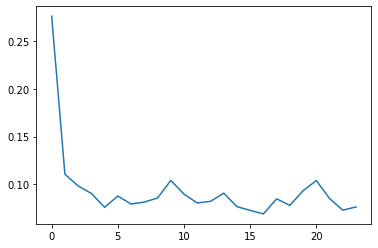

step: 2/4, D_loss: 0.15371789, G_loss_U: 3.4034054, G_loss_S: 0.0077541457, E_loss_t0: 1.041802


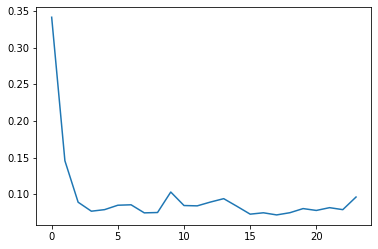

step: 2/4, D_loss: 0.15135463, G_loss_U: 3.410883, G_loss_S: 0.008015555, E_loss_t0: 1.0544404


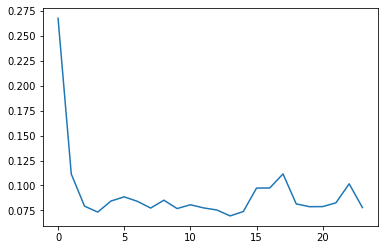

step: 2/4, D_loss: 0.1632548, G_loss_U: 3.3650296, G_loss_S: 0.007967471, E_loss_t0: 1.0360205


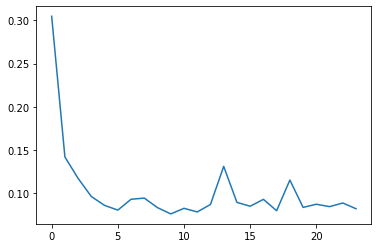

step: 2/4, D_loss: 0.16284667, G_loss_U: 3.363823, G_loss_S: 0.0075107687, E_loss_t0: 1.0419879


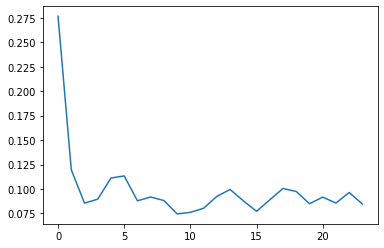

step: 2/4, D_loss: 0.16679668, G_loss_U: 3.3349426, G_loss_S: 0.00744682, E_loss_t0: 1.0291487


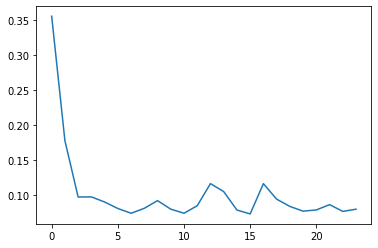

step: 2/4, D_loss: 0.1661255, G_loss_U: 3.325471, G_loss_S: 0.0077482676, E_loss_t0: 1.0290114


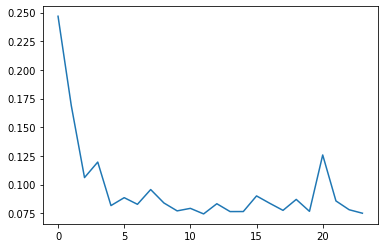

step: 2/4, D_loss: 0.18948306, G_loss_U: 3.341974, G_loss_S: 0.007701793, E_loss_t0: 1.0266612


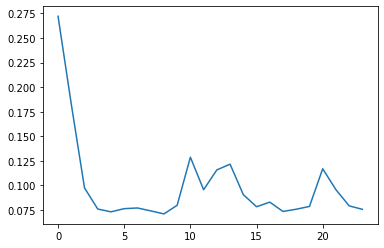

step: 2/4, D_loss: 0.18477188, G_loss_U: 3.3328388, G_loss_S: 0.007911778, E_loss_t0: 1.0339389


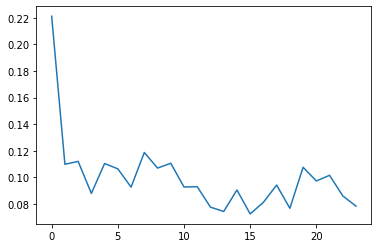

step: 2/4, D_loss: 0.1754563, G_loss_U: 3.2945464, G_loss_S: 0.007626195, E_loss_t0: 1.0302587


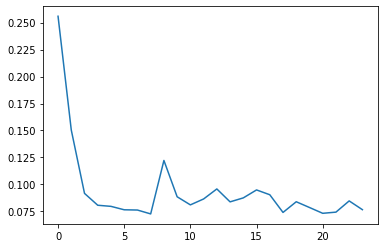

step: 2/4, D_loss: 0.18111326, G_loss_U: 3.3569193, G_loss_S: 0.008343597, E_loss_t0: 1.0285102


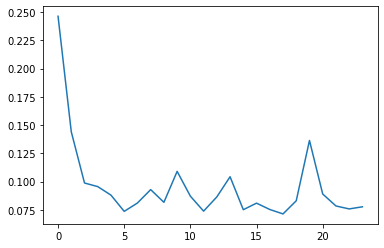

step: 2/4, D_loss: 0.1801852, G_loss_U: 3.4094322, G_loss_S: 0.007987065, E_loss_t0: 1.0253317


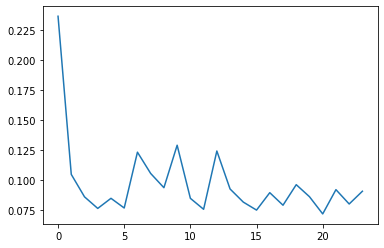

step: 2/4, D_loss: 0.1756241, G_loss_U: 3.4216034, G_loss_S: 0.008153303, E_loss_t0: 1.036771


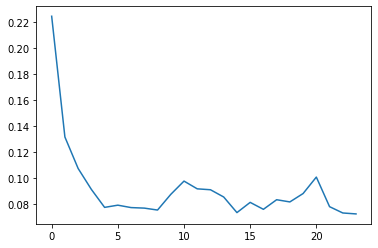

step: 2/4, D_loss: 0.16218317, G_loss_U: 3.445877, G_loss_S: 0.008066956, E_loss_t0: 1.0127457


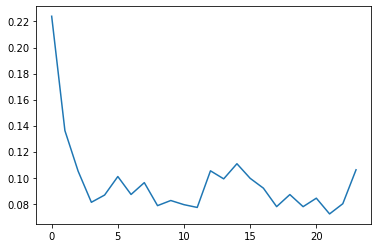

step: 2/4, D_loss: 0.17250232, G_loss_U: 3.4559405, G_loss_S: 0.007938559, E_loss_t0: 1.0278748


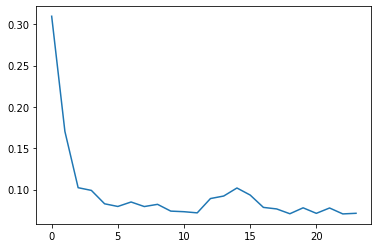

step: 2/4, D_loss: 0.17724594, G_loss_U: 3.444147, G_loss_S: 0.008374917, E_loss_t0: 1.0061821


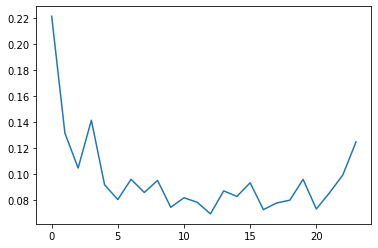

step: 2/4, D_loss: 0.19907665, G_loss_U: 3.4528532, G_loss_S: 0.008330494, E_loss_t0: 1.0187306


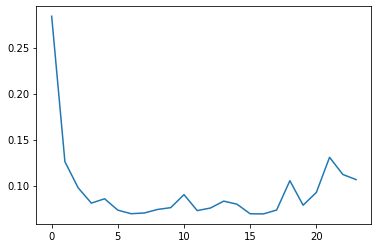

step: 2/4, D_loss: 0.18087295, G_loss_U: 3.4596527, G_loss_S: 0.008527122, E_loss_t0: 1.0390638


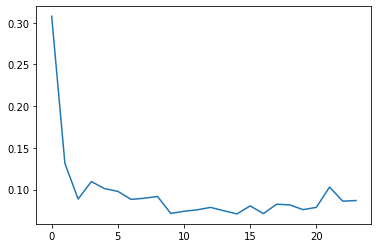

step: 2/4, D_loss: 0.17992662, G_loss_U: 3.4657414, G_loss_S: 0.008081761, E_loss_t0: 1.0013423


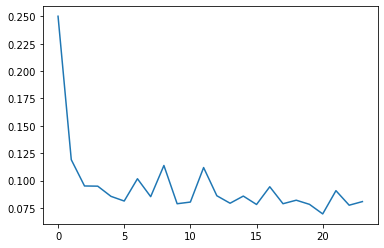

step: 2/4, D_loss: 0.17334206, G_loss_U: 3.4685593, G_loss_S: 0.0073675117, E_loss_t0: 0.99760985


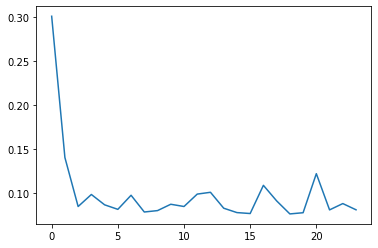

step: 2/4, D_loss: 0.18541797, G_loss_U: 3.4640331, G_loss_S: 0.008088136, E_loss_t0: 1.0154922


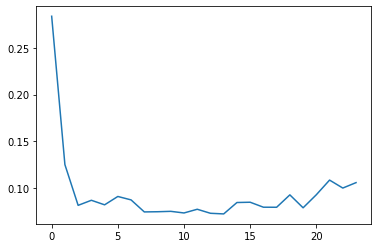

step: 2/4, D_loss: 0.1783627, G_loss_U: 3.5007582, G_loss_S: 0.007843568, E_loss_t0: 1.0105554


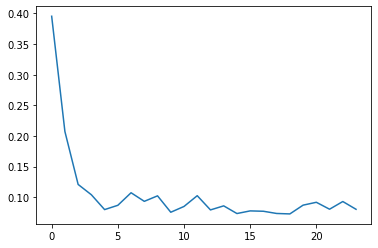

step: 2/4, D_loss: 0.18058075, G_loss_U: 3.5006964, G_loss_S: 0.0072705005, E_loss_t0: 1.0263262


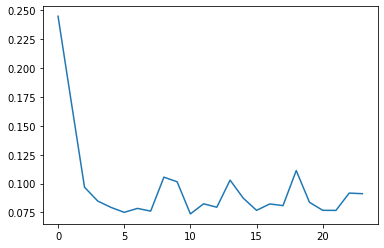

step: 2/4, D_loss: 0.1859354, G_loss_U: 3.5526912, G_loss_S: 0.0080941515, E_loss_t0: 1.0082998


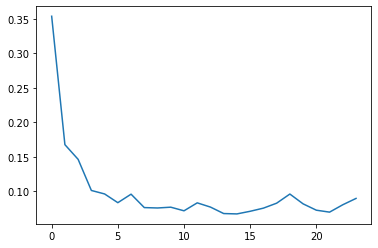

step: 2/4, D_loss: 0.1929415, G_loss_U: 3.5596025, G_loss_S: 0.0073545887, E_loss_t0: 1.0048072


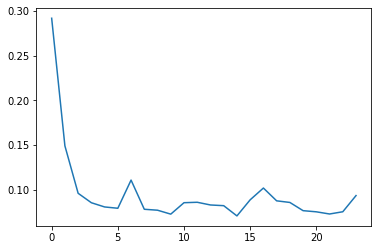

step: 2/4, D_loss: 0.19136387, G_loss_U: 3.5901566, G_loss_S: 0.007542421, E_loss_t0: 0.99776083


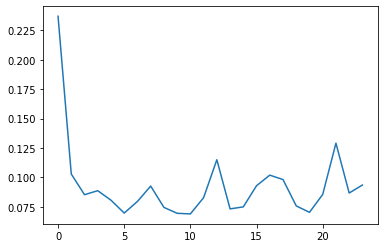

step: 2/4, D_loss: 0.17935812, G_loss_U: 3.5944881, G_loss_S: 0.0070806886, E_loss_t0: 1.0013317


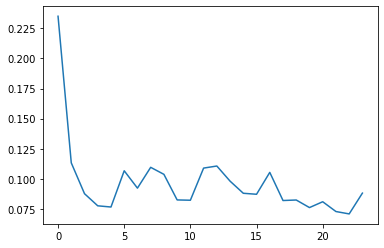

step: 2/4, D_loss: 0.19071917, G_loss_U: 3.577884, G_loss_S: 0.007969781, E_loss_t0: 1.013729


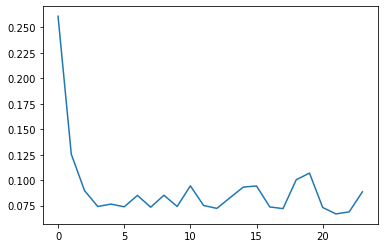

step: 2/4, D_loss: 0.22423384, G_loss_U: 3.6015818, G_loss_S: 0.007959516, E_loss_t0: 1.0011977


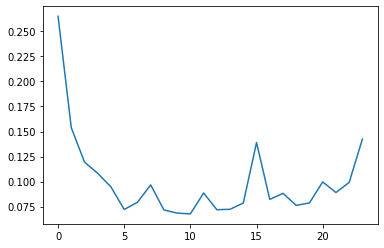

step: 2/4, D_loss: 0.18723635, G_loss_U: 3.587925, G_loss_S: 0.007393653, E_loss_t0: 1.0074841


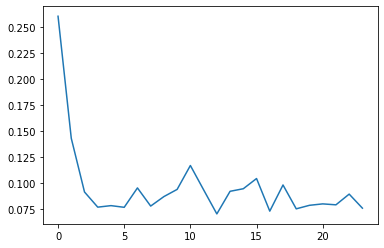

step: 2/4, D_loss: 0.22676875, G_loss_U: 3.569377, G_loss_S: 0.007488855, E_loss_t0: 0.9984592


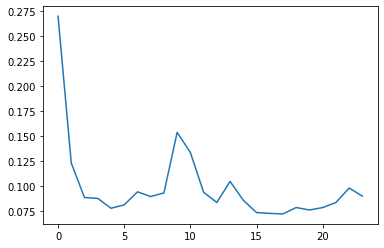

step: 2/4, D_loss: 0.19057311, G_loss_U: 3.5437438, G_loss_S: 0.0073305243, E_loss_t0: 1.0056677


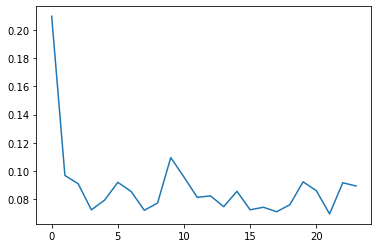

step: 2/4, D_loss: 0.19694343, G_loss_U: 3.5228322, G_loss_S: 0.008429978, E_loss_t0: 1.0037645


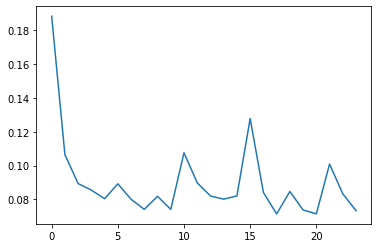

step: 2/4, D_loss: 0.2966743, G_loss_U: 3.7813618, G_loss_S: 0.00794986, E_loss_t0: 0.9934931


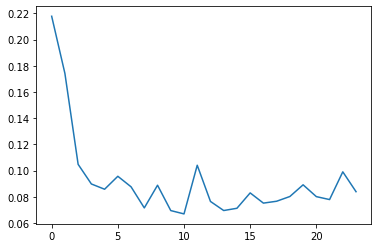

step: 2/4, D_loss: 0.40850973, G_loss_U: 3.819684, G_loss_S: 0.0076339557, E_loss_t0: 0.98059374


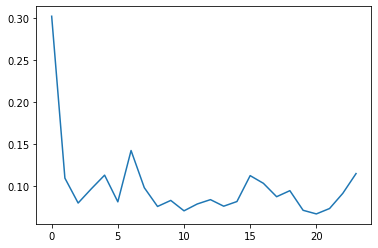

step: 2/4, D_loss: 0.7162366, G_loss_U: 3.7747777, G_loss_S: 0.007684892, E_loss_t0: 0.9972092


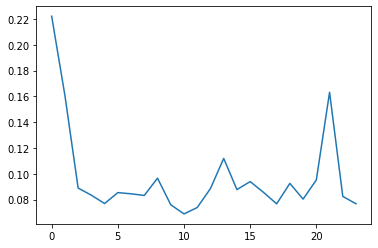

step: 2/4, D_loss: 0.32599428, G_loss_U: 3.6012409, G_loss_S: 0.0070409863, E_loss_t0: 1.0149647


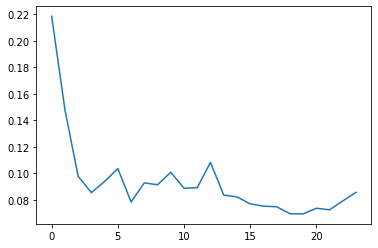

step: 2/4, D_loss: 0.18449831, G_loss_U: 1.6121879, G_loss_S: 0.007244621, E_loss_t0: 1.0257016


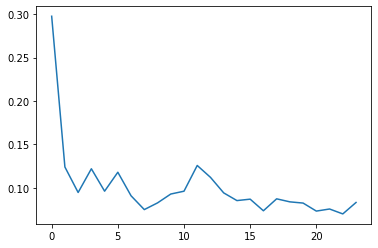

step: 2/4, D_loss: 2.0598752, G_loss_U: 3.5756931, G_loss_S: 0.006141248, E_loss_t0: 1.0383263


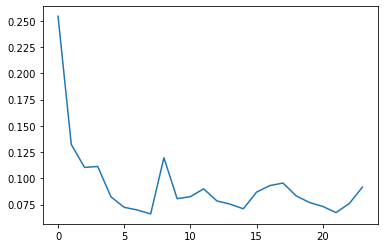

step: 2/4, D_loss: 0.19382502, G_loss_U: 3.7479837, G_loss_S: 0.006218824, E_loss_t0: 1.0359609


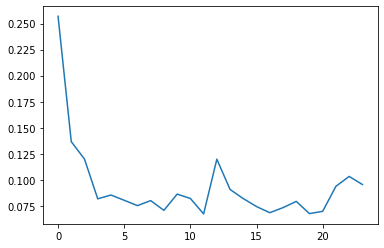

step: 2/4, D_loss: 0.18715574, G_loss_U: 3.8173668, G_loss_S: 0.006979658, E_loss_t0: 1.0115019


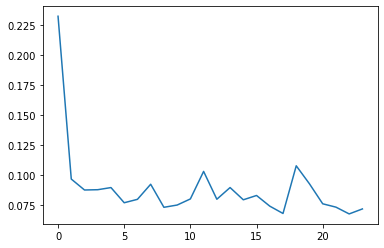

step: 2/4, D_loss: 0.38765424, G_loss_U: 3.833626, G_loss_S: 0.006314514, E_loss_t0: 1.0175502


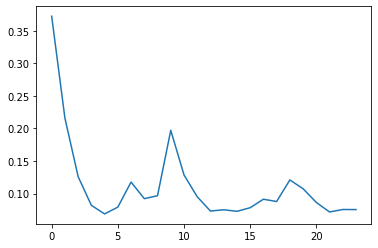

step: 2/4, D_loss: 0.5052275, G_loss_U: 3.8258832, G_loss_S: 0.005811963, E_loss_t0: 1.0082229


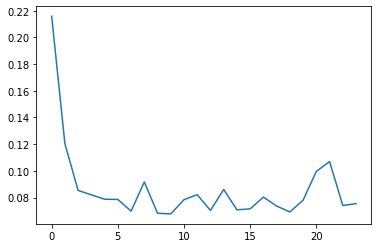

step: 2/4, D_loss: 0.4048903, G_loss_U: 3.766638, G_loss_S: 0.00568725, E_loss_t0: 0.99611306


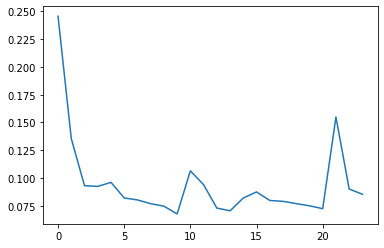

step: 2/4, D_loss: 0.18259382, G_loss_U: 3.7065344, G_loss_S: 0.006232943, E_loss_t0: 1.0023147


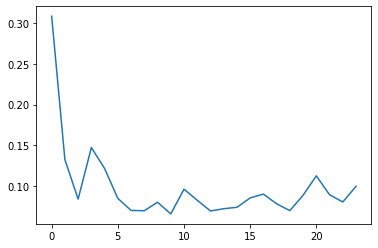

step: 2/4, D_loss: 0.15723409, G_loss_U: 3.5469894, G_loss_S: 0.005895985, E_loss_t0: 1.0200437


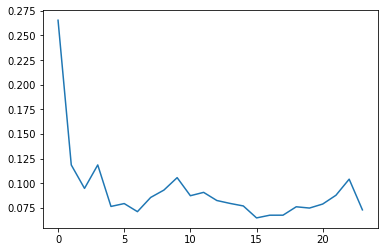

step: 2/4, D_loss: 0.17463219, G_loss_U: 3.4386616, G_loss_S: 0.006056825, E_loss_t0: 1.0396183


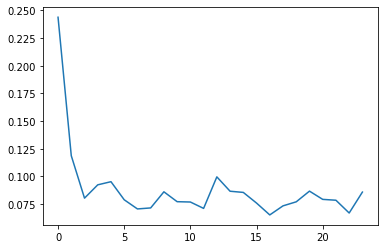

step: 2/4, D_loss: 0.19840862, G_loss_U: 3.2875602, G_loss_S: 0.00602056, E_loss_t0: 1.0195377


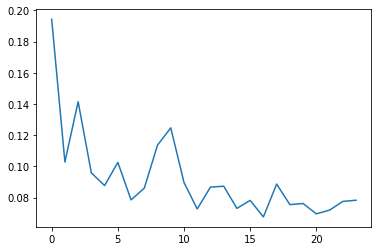

step: 2/4, D_loss: 0.24003002, G_loss_U: 3.050171, G_loss_S: 0.0058035497, E_loss_t0: 1.0164459


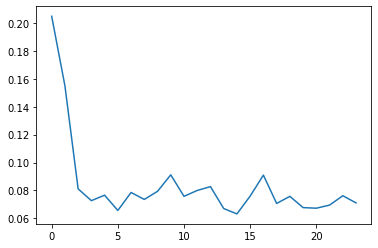

step: 2/4, D_loss: 0.30284196, G_loss_U: 3.1060905, G_loss_S: 0.0059956284, E_loss_t0: 1.0185254


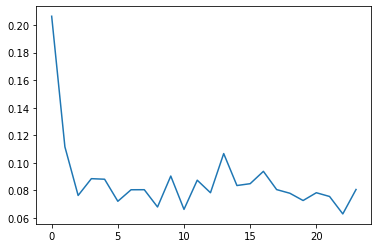

step: 2/4, D_loss: 0.2690426, G_loss_U: 3.3052986, G_loss_S: 0.006006783, E_loss_t0: 1.0073751


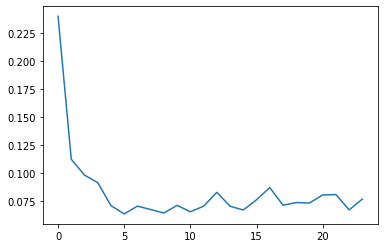

step: 2/4, D_loss: 0.2266872, G_loss_U: 3.4808018, G_loss_S: 0.0061067054, E_loss_t0: 1.0068673


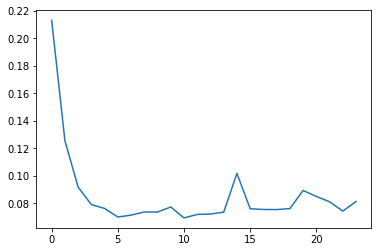

step: 2/4, D_loss: 0.20112747, G_loss_U: 3.6050313, G_loss_S: 0.005982761, E_loss_t0: 0.999612


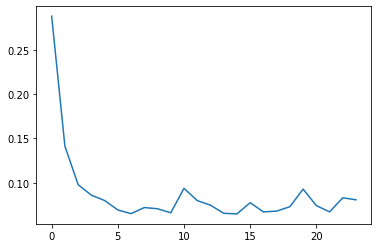

step: 2/4, D_loss: 0.1745922, G_loss_U: 3.6753407, G_loss_S: 0.0063704043, E_loss_t0: 0.99397993


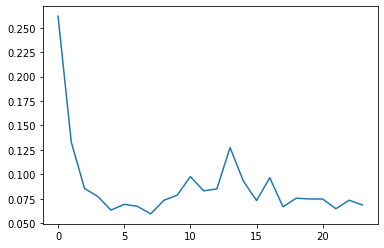

step: 2/4, D_loss: 0.1653929, G_loss_U: 3.7209642, G_loss_S: 0.006215307, E_loss_t0: 1.0091807


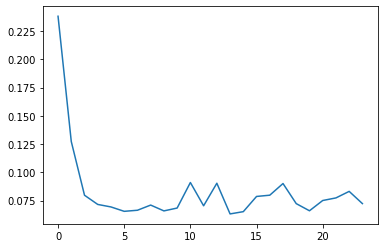

step: 2/4, D_loss: 0.17028606, G_loss_U: 3.7992, G_loss_S: 0.006285132, E_loss_t0: 0.97857064


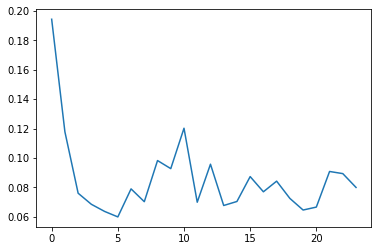

step: 2/4, D_loss: 0.1941142, G_loss_U: 3.80918, G_loss_S: 0.006153901, E_loss_t0: 1.0163993


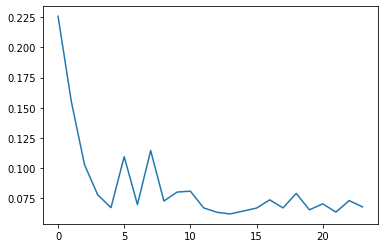

step: 2/4, D_loss: 0.24224584, G_loss_U: 3.8239117, G_loss_S: 0.0068848534, E_loss_t0: 0.9995029


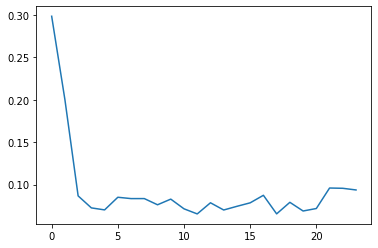

step: 2/4, D_loss: 0.21980879, G_loss_U: 3.8248968, G_loss_S: 0.0065536816, E_loss_t0: 1.0079179


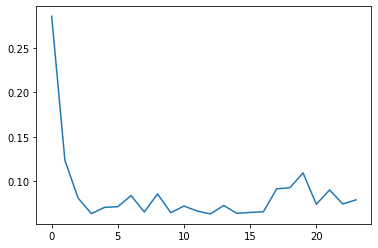

step: 2/4, D_loss: 0.21299464, G_loss_U: 3.8311539, G_loss_S: 0.0060586683, E_loss_t0: 1.004766


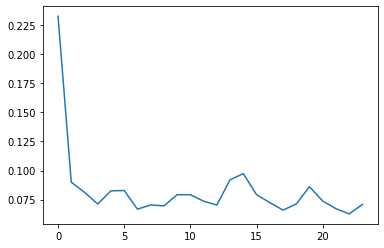

step: 2/4, D_loss: 0.19146208, G_loss_U: 3.7991457, G_loss_S: 0.006650868, E_loss_t0: 0.9907969


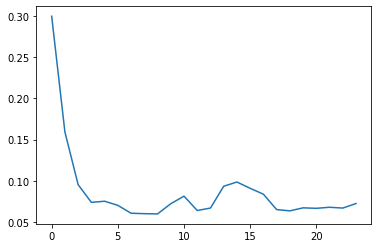

step: 2/4, D_loss: 0.18171272, G_loss_U: 3.7577393, G_loss_S: 0.006209019, E_loss_t0: 0.9959841


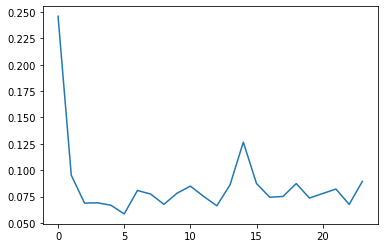

step: 2/4, D_loss: 0.17314777, G_loss_U: 3.7088168, G_loss_S: 0.006726888, E_loss_t0: 1.0080914


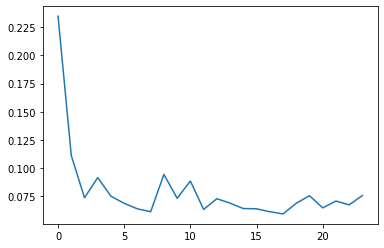

step: 2/4, D_loss: 0.16346133, G_loss_U: 3.6976855, G_loss_S: 0.0063587013, E_loss_t0: 0.99650496


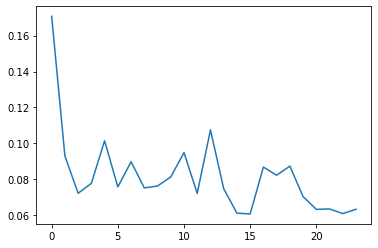

step: 2/4, D_loss: 0.16222838, G_loss_U: 3.5926774, G_loss_S: 0.0065046162, E_loss_t0: 0.9973603


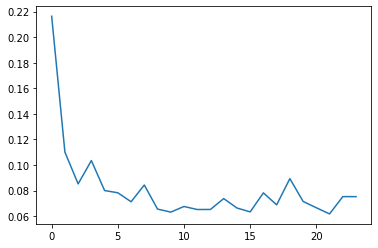

step: 2/4, D_loss: 0.1766019, G_loss_U: 3.5345643, G_loss_S: 0.005644431, E_loss_t0: 0.98867


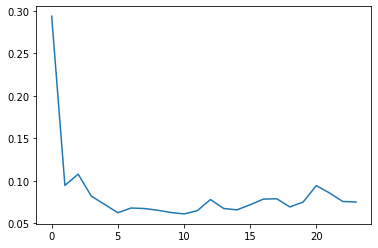

step: 2/4, D_loss: 0.18971263, G_loss_U: 3.470435, G_loss_S: 0.0058568777, E_loss_t0: 0.9920796


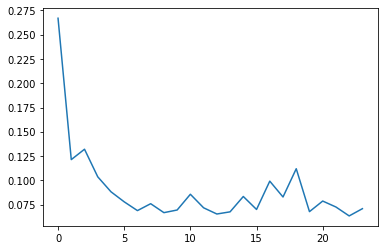

step: 2/4, D_loss: 0.19117267, G_loss_U: 3.4196815, G_loss_S: 0.0059267073, E_loss_t0: 0.9732024


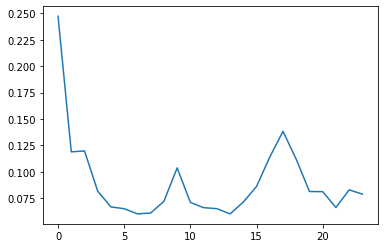

step: 2/4, D_loss: 0.19255331, G_loss_U: 3.4421732, G_loss_S: 0.0065070647, E_loss_t0: 0.99311924


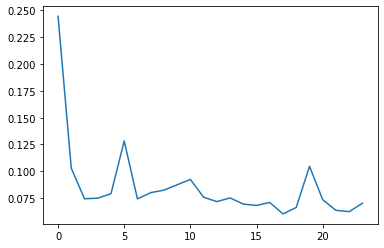

step: 2/4, D_loss: 0.19556563, G_loss_U: 3.5546143, G_loss_S: 0.006234186, E_loss_t0: 0.98024666


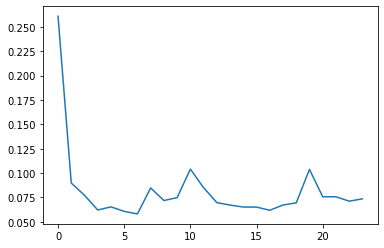

step: 2/4, D_loss: 0.20197807, G_loss_U: 3.5927927, G_loss_S: 0.005783345, E_loss_t0: 0.9769377


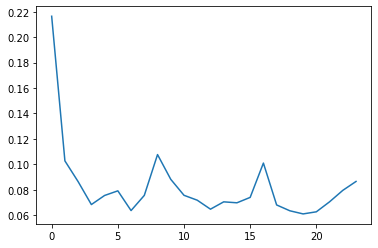

step: 2/4, D_loss: 0.19767089, G_loss_U: 3.7157881, G_loss_S: 0.005882226, E_loss_t0: 0.98846024


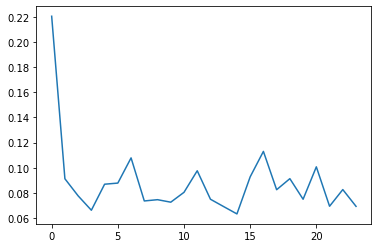

step: 2/4, D_loss: 0.17672041, G_loss_U: 3.7807548, G_loss_S: 0.0056718057, E_loss_t0: 0.98324496


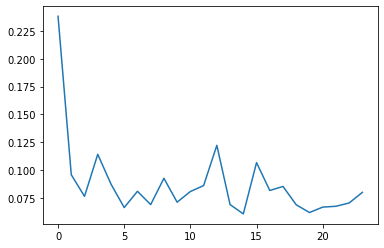

step: 2/4, D_loss: 0.19397591, G_loss_U: 3.835685, G_loss_S: 0.00531958, E_loss_t0: 0.9713469


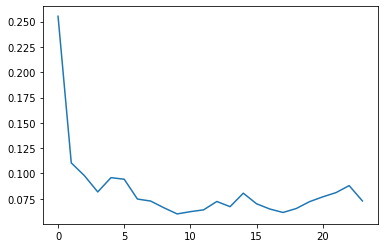

step: 2/4, D_loss: 0.18901965, G_loss_U: 3.8687155, G_loss_S: 0.0059616505, E_loss_t0: 0.9821956


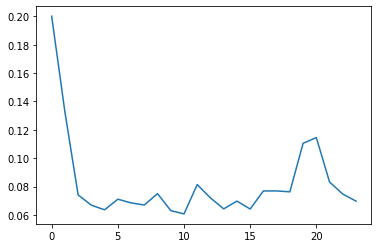

step: 2/4, D_loss: 0.2036554, G_loss_U: 3.8769646, G_loss_S: 0.0062713404, E_loss_t0: 0.9851617


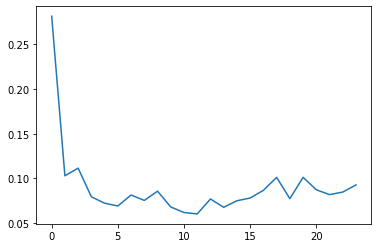

step: 2/4, D_loss: 0.19598123, G_loss_U: 3.9063733, G_loss_S: 0.006481554, E_loss_t0: 0.9738743


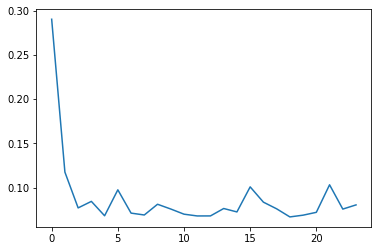

step: 2/4, D_loss: 0.2190858, G_loss_U: 3.8927548, G_loss_S: 0.0065618223, E_loss_t0: 0.9918464


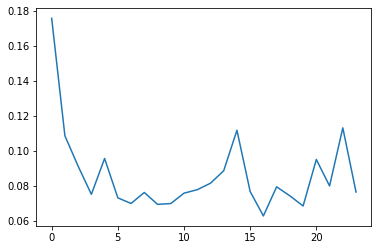

step: 2/4, D_loss: 0.22800931, G_loss_U: 3.8427703, G_loss_S: 0.006218957, E_loss_t0: 0.9604643


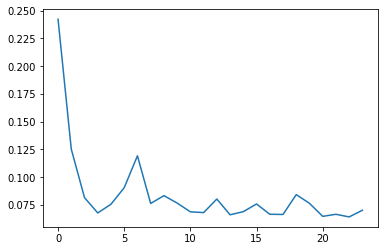

step: 2/4, D_loss: 0.21222137, G_loss_U: 3.8300304, G_loss_S: 0.0056149447, E_loss_t0: 0.96668524


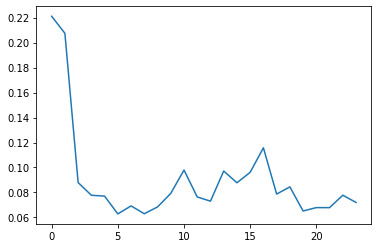

step: 2/4, D_loss: 0.22930393, G_loss_U: 3.7705934, G_loss_S: 0.005910858, E_loss_t0: 0.9698491


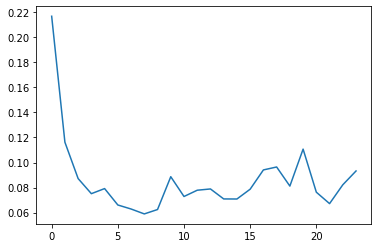

step: 2/4, D_loss: 0.21765676, G_loss_U: 3.6719124, G_loss_S: 0.0057664067, E_loss_t0: 0.98581403


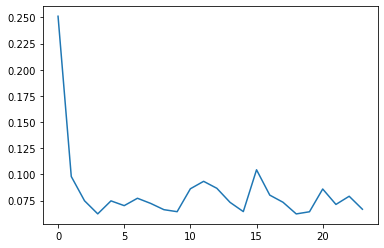

step: 2/4, D_loss: 0.2545743, G_loss_U: 3.588067, G_loss_S: 0.006284764, E_loss_t0: 0.9825426


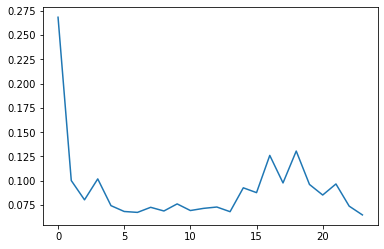

step: 2/4, D_loss: 0.2585649, G_loss_U: 3.5616026, G_loss_S: 0.006376314, E_loss_t0: 0.9791617


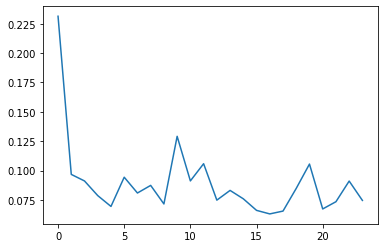

step: 2/4, D_loss: 0.2572455, G_loss_U: 3.6517837, G_loss_S: 0.006121705, E_loss_t0: 0.98474354


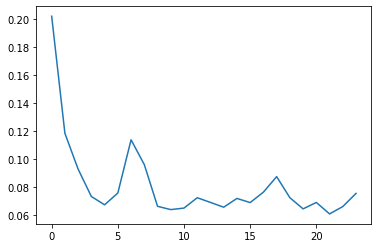

step: 2/4, D_loss: 0.2729416, G_loss_U: 3.7682602, G_loss_S: 0.006187544, E_loss_t0: 0.98642194


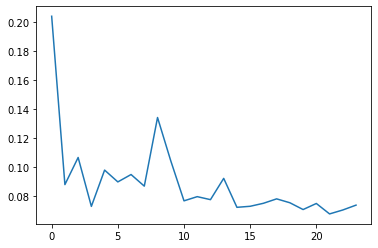

step: 2/4, D_loss: 0.253444, G_loss_U: 3.809358, G_loss_S: 0.006304581, E_loss_t0: 0.97322494


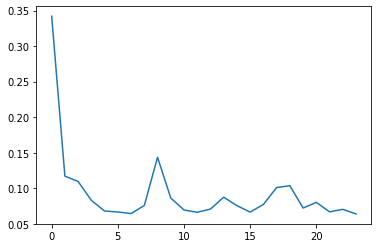

step: 2/4, D_loss: 0.25513023, G_loss_U: 3.842322, G_loss_S: 0.005662177, E_loss_t0: 0.97040814


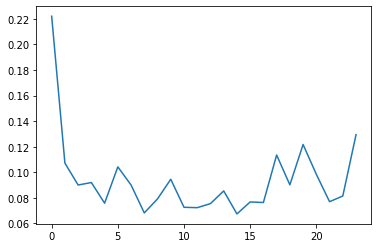

step: 2/4, D_loss: 0.2625911, G_loss_U: 3.8339682, G_loss_S: 0.0059195748, E_loss_t0: 0.95014477


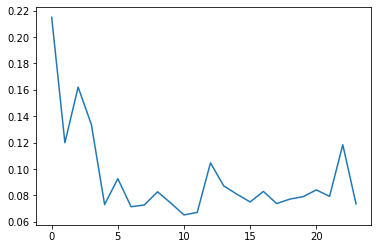

step: 2/4, D_loss: 0.29166213, G_loss_U: 3.777914, G_loss_S: 0.006611175, E_loss_t0: 0.9476647


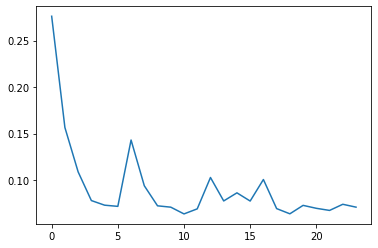

step: 2/4, D_loss: 0.2976438, G_loss_U: 3.6919613, G_loss_S: 0.0072586713, E_loss_t0: 0.9798507


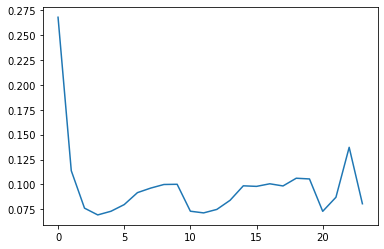

step: 2/4, D_loss: 0.31291458, G_loss_U: 3.5330336, G_loss_S: 0.0056475373, E_loss_t0: 0.9792438


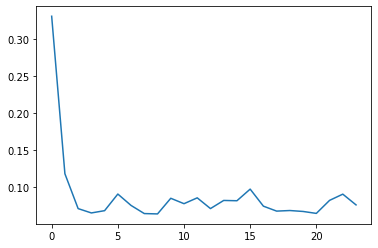

step: 2/4, D_loss: 0.30924618, G_loss_U: 3.3776057, G_loss_S: 0.0056226533, E_loss_t0: 0.95559925


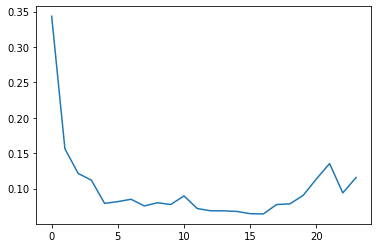

step: 2/4, D_loss: 0.33156726, G_loss_U: 3.4107602, G_loss_S: 0.0059317243, E_loss_t0: 0.96462303


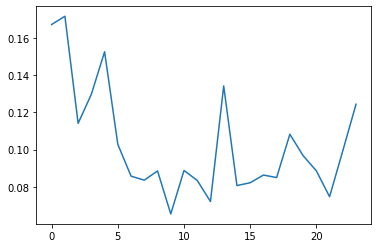

step: 2/4, D_loss: 0.36178657, G_loss_U: 3.492426, G_loss_S: 0.0062227766, E_loss_t0: 0.96886295


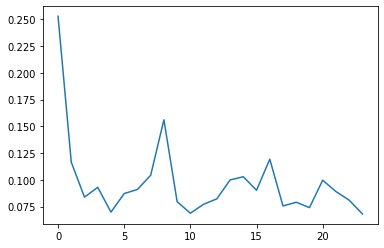

step: 2/4, D_loss: 0.382391, G_loss_U: 3.586894, G_loss_S: 0.006638711, E_loss_t0: 0.96661574


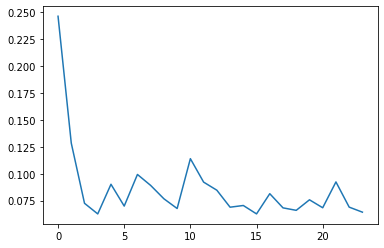

step: 2/4, D_loss: 0.40928334, G_loss_U: 3.5977116, G_loss_S: 0.006617793, E_loss_t0: 0.9671071


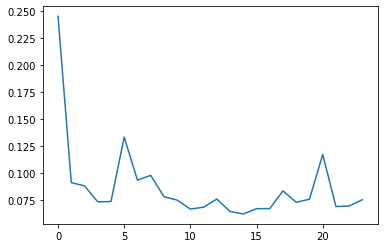

step: 3/4, D_loss: 4.158373, G_loss_U: 0.04128113, G_loss_S: 0.0064552426, E_loss_t0: 0.9787355


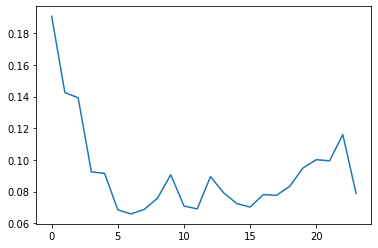

step: 3/4, D_loss: 4.2578235, G_loss_U: 0.038263537, G_loss_S: 0.0073487633, E_loss_t0: 0.97888005


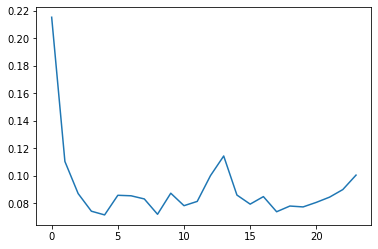

step: 3/4, D_loss: 4.2038827, G_loss_U: 0.037737153, G_loss_S: 0.006280987, E_loss_t0: 0.9616795


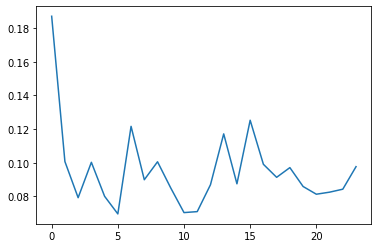

step: 3/4, D_loss: 4.1415935, G_loss_U: 0.03674889, G_loss_S: 0.0070265704, E_loss_t0: 0.9934016


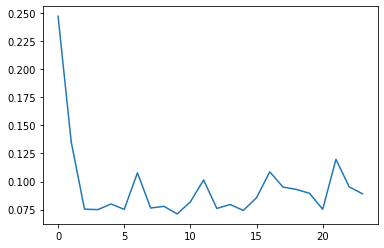

step: 3/4, D_loss: 4.019481, G_loss_U: 0.04031874, G_loss_S: 0.0065308884, E_loss_t0: 0.986589


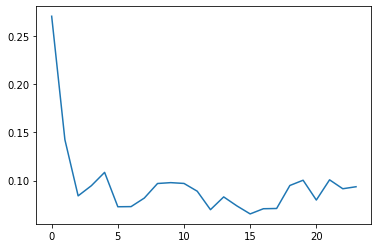

step: 3/4, D_loss: 3.8544457, G_loss_U: 0.051452618, G_loss_S: 0.007478452, E_loss_t0: 0.9717762


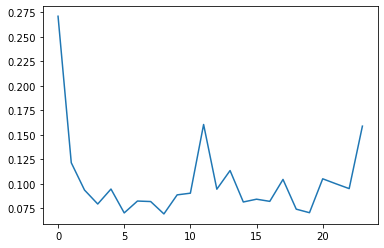

step: 3/4, D_loss: 3.6577287, G_loss_U: 0.05579616, G_loss_S: 0.006624821, E_loss_t0: 0.9576646


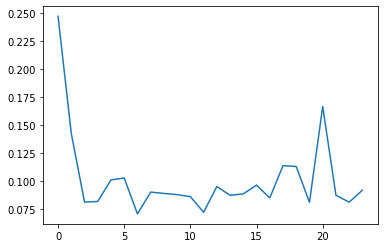

step: 3/4, D_loss: 3.432742, G_loss_U: 0.07206553, G_loss_S: 0.007365402, E_loss_t0: 0.97449636


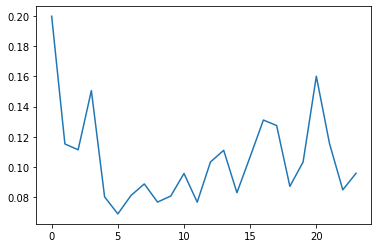

step: 3/4, D_loss: 3.1576798, G_loss_U: 0.0895876, G_loss_S: 0.0068940576, E_loss_t0: 0.9749731


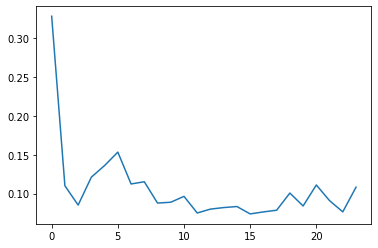

step: 3/4, D_loss: 2.8472428, G_loss_U: 0.11975815, G_loss_S: 0.0076457867, E_loss_t0: 0.95461535


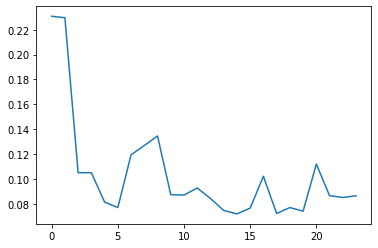

step: 3/4, D_loss: 2.5149388, G_loss_U: 0.17051257, G_loss_S: 0.007289895, E_loss_t0: 0.9743318


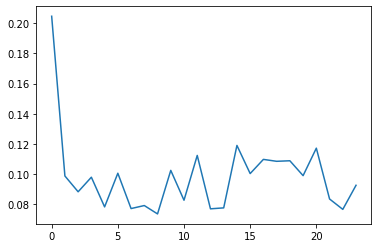

step: 3/4, D_loss: 2.1993282, G_loss_U: 0.24336101, G_loss_S: 0.008065333, E_loss_t0: 0.9551954


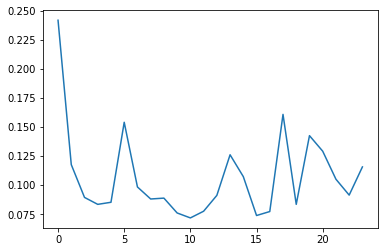

step: 3/4, D_loss: 1.9166143, G_loss_U: 0.34000134, G_loss_S: 0.007479654, E_loss_t0: 0.9577465


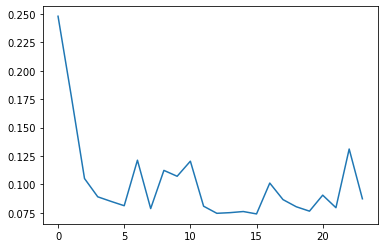

step: 3/4, D_loss: 1.6812539, G_loss_U: 0.45805132, G_loss_S: 0.0076264734, E_loss_t0: 0.97691387


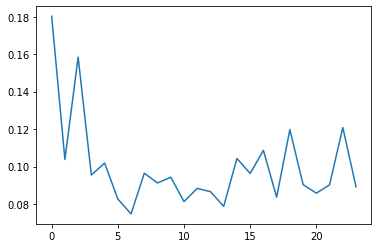

step: 3/4, D_loss: 1.5335747, G_loss_U: 0.5793223, G_loss_S: 0.0076632984, E_loss_t0: 0.9620502


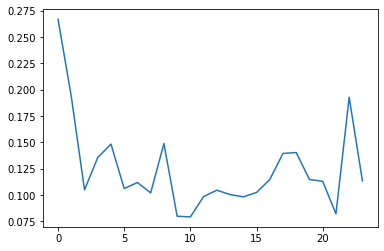

step: 3/4, D_loss: 1.4485034, G_loss_U: 0.69860345, G_loss_S: 0.007560467, E_loss_t0: 0.97000945


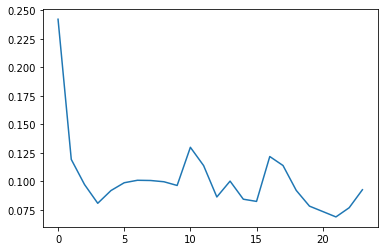

step: 3/4, D_loss: 1.4426169, G_loss_U: 0.8204301, G_loss_S: 0.007836542, E_loss_t0: 0.9536058


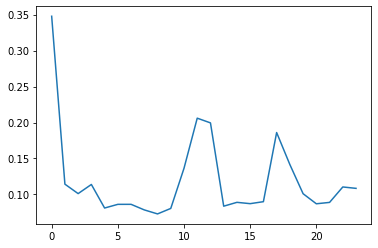

step: 3/4, D_loss: 1.4447961, G_loss_U: 0.91076213, G_loss_S: 0.0069858716, E_loss_t0: 0.94724476


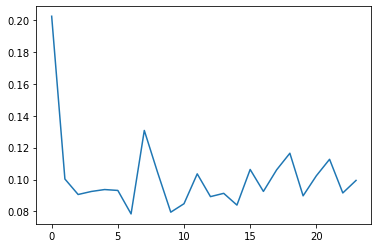

step: 3/4, D_loss: 1.4781287, G_loss_U: 0.9875471, G_loss_S: 0.00729002, E_loss_t0: 0.9528725


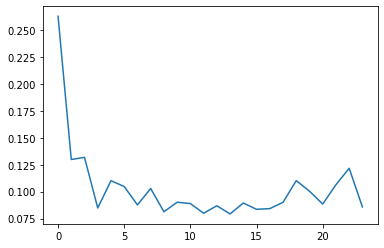

step: 3/4, D_loss: 1.4935737, G_loss_U: 1.0378708, G_loss_S: 0.0072561456, E_loss_t0: 0.96558124


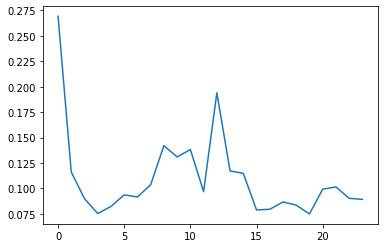

step: 3/4, D_loss: 1.5077627, G_loss_U: 1.074684, G_loss_S: 0.0069510257, E_loss_t0: 0.956207


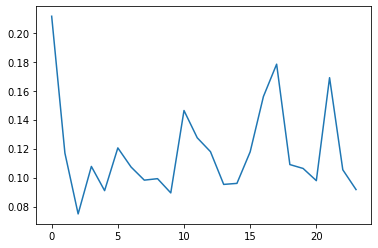

step: 3/4, D_loss: 1.5367566, G_loss_U: 1.088496, G_loss_S: 0.007309597, E_loss_t0: 0.96137726


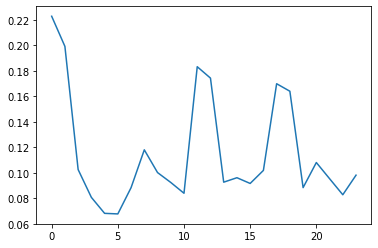

step: 3/4, D_loss: 1.550051, G_loss_U: 1.093169, G_loss_S: 0.008740811, E_loss_t0: 0.9545711


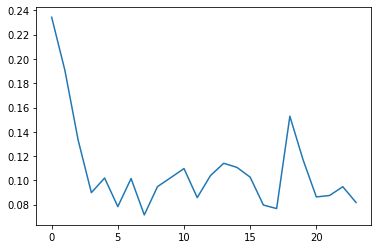

step: 3/4, D_loss: 1.5548763, G_loss_U: 1.0898634, G_loss_S: 0.008430439, E_loss_t0: 0.9569984


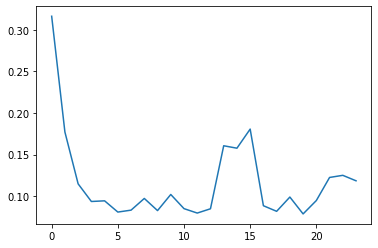

step: 3/4, D_loss: 1.5406351, G_loss_U: 1.0723432, G_loss_S: 0.008178385, E_loss_t0: 0.9527401


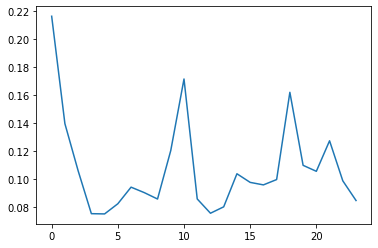

step: 3/4, D_loss: 1.5409838, G_loss_U: 1.0525025, G_loss_S: 0.0075166314, E_loss_t0: 0.95718366


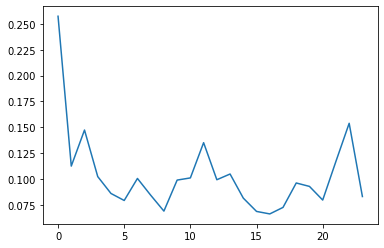

step: 3/4, D_loss: 1.5072863, G_loss_U: 1.0264701, G_loss_S: 0.007529212, E_loss_t0: 0.9306246


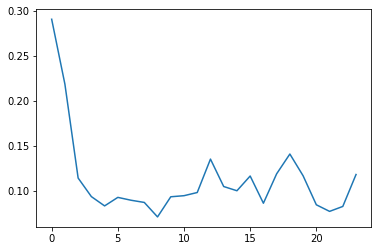

step: 3/4, D_loss: 1.5088015, G_loss_U: 1.0020279, G_loss_S: 0.008149506, E_loss_t0: 0.94856316


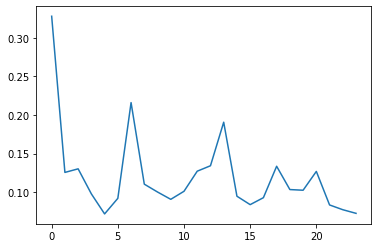

step: 3/4, D_loss: 1.4831216, G_loss_U: 0.97633225, G_loss_S: 0.008279931, E_loss_t0: 0.9446165


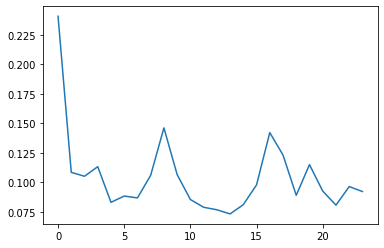

step: 3/4, D_loss: 1.4769522, G_loss_U: 0.94693136, G_loss_S: 0.0075165182, E_loss_t0: 0.9686351


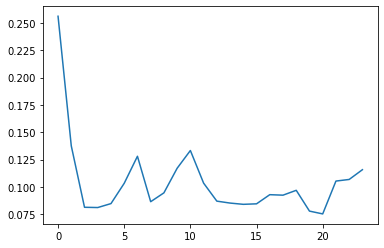

step: 3/4, D_loss: 1.4710547, G_loss_U: 0.9177106, G_loss_S: 0.008628541, E_loss_t0: 0.9325192


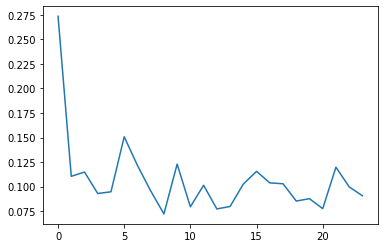

step: 3/4, D_loss: 1.4717892, G_loss_U: 0.8982127, G_loss_S: 0.009400297, E_loss_t0: 0.9334154


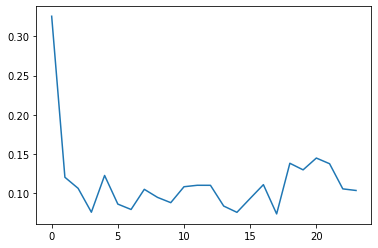

step: 3/4, D_loss: 1.4563352, G_loss_U: 0.8792284, G_loss_S: 0.009712604, E_loss_t0: 0.9300399


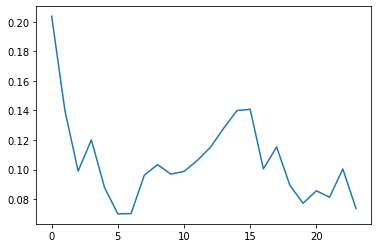

step: 3/4, D_loss: 1.4288545, G_loss_U: 0.84806234, G_loss_S: 0.009375125, E_loss_t0: 0.96606845


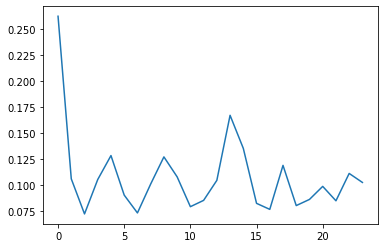

step: 3/4, D_loss: 1.4232512, G_loss_U: 0.8314982, G_loss_S: 0.009581013, E_loss_t0: 0.92401177


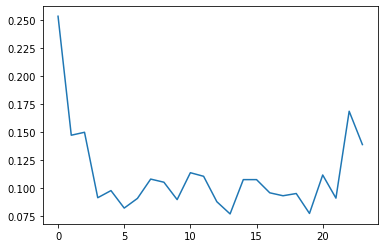

step: 3/4, D_loss: 1.4242176, G_loss_U: 0.8142143, G_loss_S: 0.01181449, E_loss_t0: 0.94232357


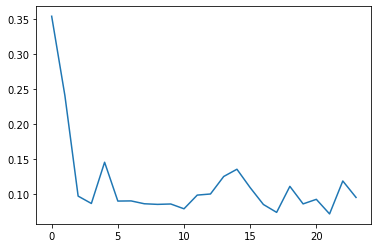

step: 3/4, D_loss: 1.3822505, G_loss_U: 0.79607314, G_loss_S: 0.0087949, E_loss_t0: 0.91003215


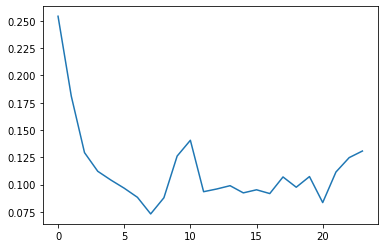

step: 3/4, D_loss: 1.3927624, G_loss_U: 0.78457075, G_loss_S: 0.008247014, E_loss_t0: 0.94329524


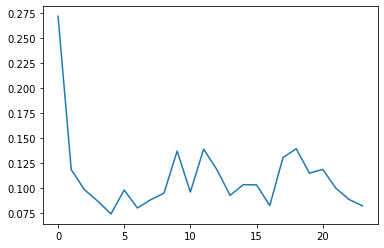

step: 3/4, D_loss: 1.3866615, G_loss_U: 0.76909536, G_loss_S: 0.009588101, E_loss_t0: 0.93098974


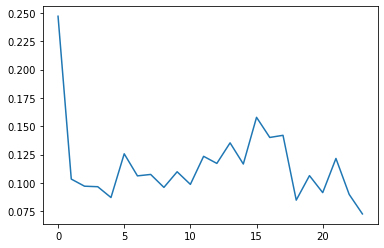

step: 3/4, D_loss: 1.3808621, G_loss_U: 0.7603654, G_loss_S: 0.010584131, E_loss_t0: 0.92646956


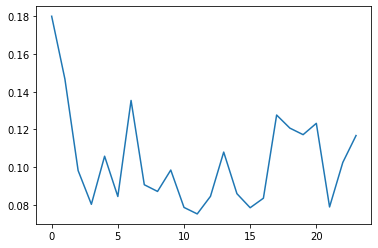

step: 3/4, D_loss: 1.383073, G_loss_U: 0.7533335, G_loss_S: 0.011692128, E_loss_t0: 0.91655767


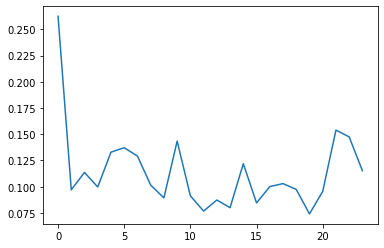

step: 3/4, D_loss: 1.367809, G_loss_U: 0.74541396, G_loss_S: 0.009395061, E_loss_t0: 0.9387155


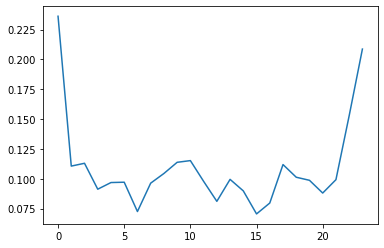

step: 3/4, D_loss: 1.3581878, G_loss_U: 0.7403808, G_loss_S: 0.0109583065, E_loss_t0: 0.9229952


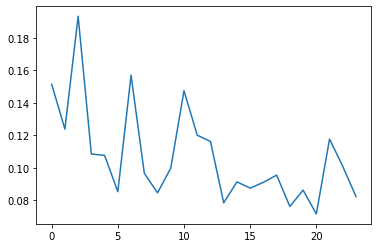

step: 3/4, D_loss: 1.3661115, G_loss_U: 0.7384744, G_loss_S: 0.010022852, E_loss_t0: 0.9296499


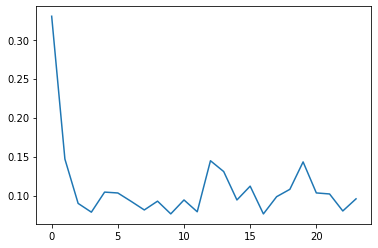

step: 3/4, D_loss: 1.3779771, G_loss_U: 0.7373371, G_loss_S: 0.011192757, E_loss_t0: 0.9177911


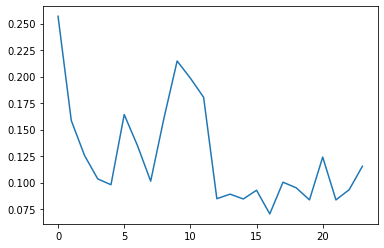

step: 3/4, D_loss: 1.3393817, G_loss_U: 0.73927873, G_loss_S: 0.011329617, E_loss_t0: 0.9223948


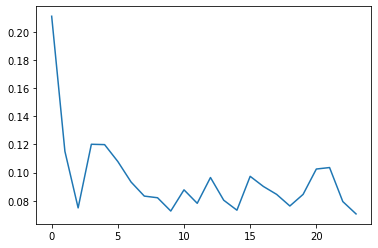

step: 3/4, D_loss: 1.3495383, G_loss_U: 0.7474839, G_loss_S: 0.010014289, E_loss_t0: 0.932405


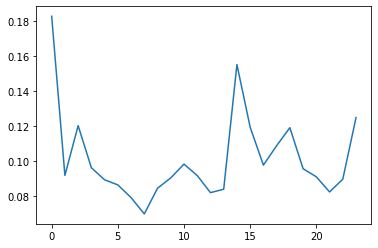

step: 3/4, D_loss: 1.3210967, G_loss_U: 0.7568316, G_loss_S: 0.009878104, E_loss_t0: 0.89811534


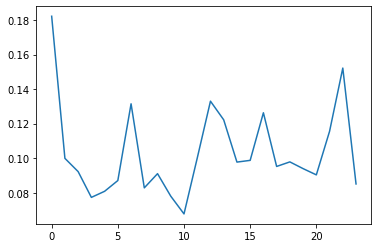

step: 3/4, D_loss: 1.3289032, G_loss_U: 0.76806194, G_loss_S: 0.010957912, E_loss_t0: 0.91781145


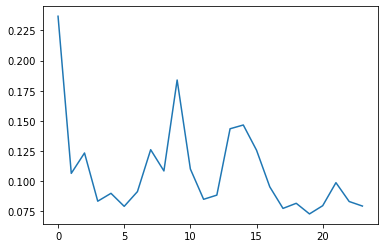

step: 3/4, D_loss: 1.3132992, G_loss_U: 0.78041023, G_loss_S: 0.010488319, E_loss_t0: 0.92599696


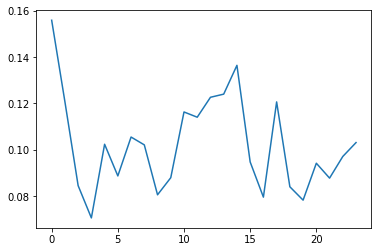

step: 3/4, D_loss: 1.3024507, G_loss_U: 0.80156654, G_loss_S: 0.009912797, E_loss_t0: 0.92593783


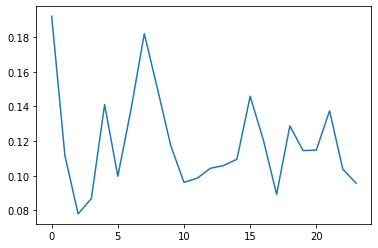

step: 3/4, D_loss: 1.2527838, G_loss_U: 0.82545775, G_loss_S: 0.010848263, E_loss_t0: 0.8946059


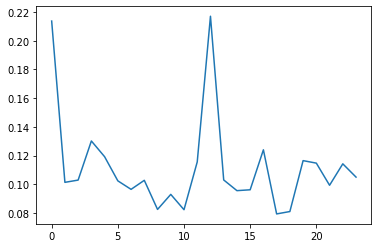

step: 3/4, D_loss: 1.3010101, G_loss_U: 0.8444955, G_loss_S: 0.012941132, E_loss_t0: 0.9116608


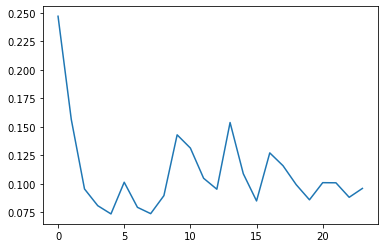

step: 3/4, D_loss: 1.2289213, G_loss_U: 0.872803, G_loss_S: 0.0112186, E_loss_t0: 0.9117092


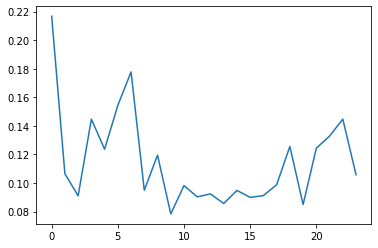

step: 3/4, D_loss: 1.2516133, G_loss_U: 0.8997286, G_loss_S: 0.011848345, E_loss_t0: 0.91317236


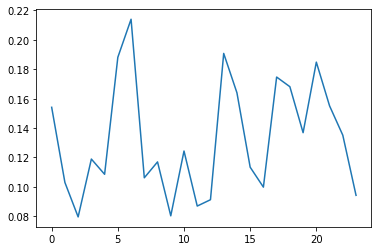

step: 3/4, D_loss: 1.236924, G_loss_U: 0.9299788, G_loss_S: 0.011080922, E_loss_t0: 0.9183832


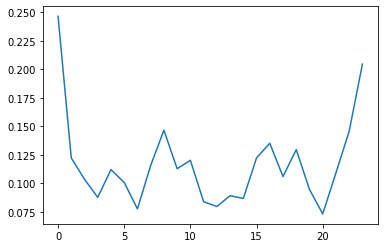

step: 3/4, D_loss: 1.2002404, G_loss_U: 0.96723276, G_loss_S: 0.009878059, E_loss_t0: 0.88927996


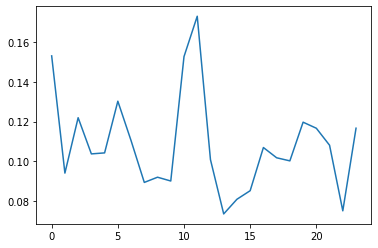

step: 3/4, D_loss: 1.1518835, G_loss_U: 1.0077342, G_loss_S: 0.01113184, E_loss_t0: 0.90902954


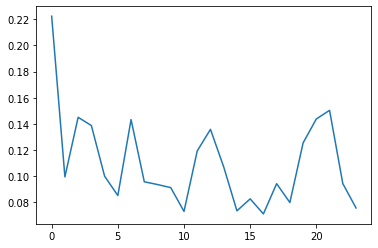

step: 3/4, D_loss: 1.2151496, G_loss_U: 1.031715, G_loss_S: 0.011720481, E_loss_t0: 0.9146217


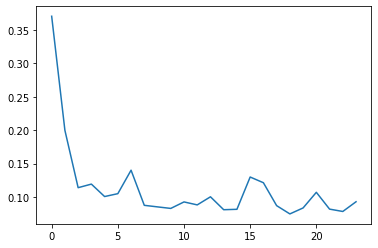

step: 3/4, D_loss: 1.1298558, G_loss_U: 1.0701731, G_loss_S: 0.01076802, E_loss_t0: 0.91432786


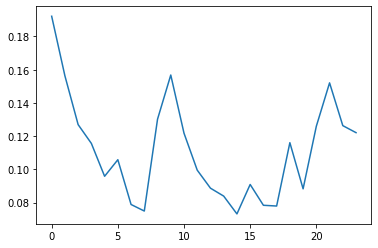

step: 3/4, D_loss: 1.132168, G_loss_U: 1.1026921, G_loss_S: 0.01132418, E_loss_t0: 0.8954295


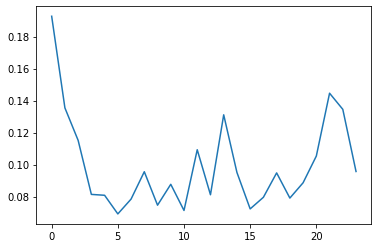

step: 3/4, D_loss: 1.1219136, G_loss_U: 1.1293131, G_loss_S: 0.012324323, E_loss_t0: 0.89647156


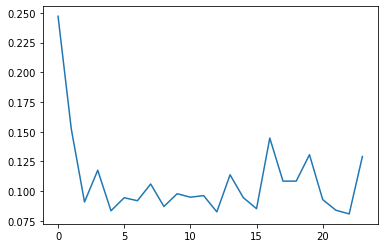

step: 3/4, D_loss: 1.1164036, G_loss_U: 1.1534467, G_loss_S: 0.010870723, E_loss_t0: 0.9049878


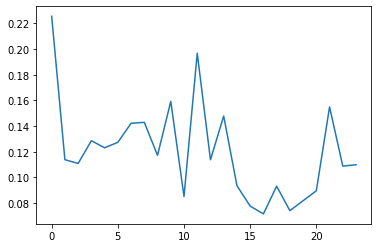

step: 3/4, D_loss: 1.1127776, G_loss_U: 1.1775919, G_loss_S: 0.012589759, E_loss_t0: 0.9001892


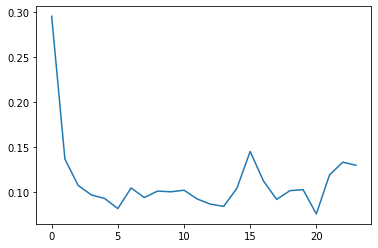

step: 3/4, D_loss: 1.0040619, G_loss_U: 1.216328, G_loss_S: 0.012152138, E_loss_t0: 0.90978926


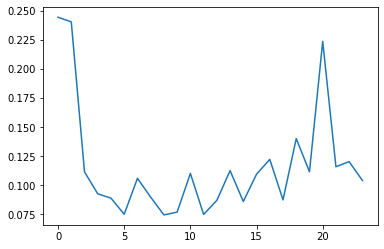

step: 3/4, D_loss: 1.0337878, G_loss_U: 1.2414047, G_loss_S: 0.011356596, E_loss_t0: 0.8885583


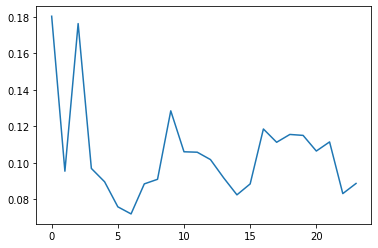

step: 3/4, D_loss: 0.96404773, G_loss_U: 1.2682055, G_loss_S: 0.011085191, E_loss_t0: 0.90952593


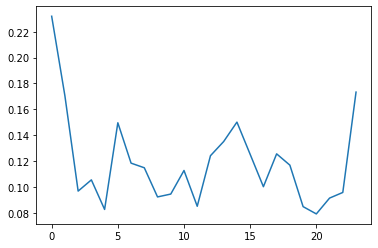

step: 3/4, D_loss: 0.92854613, G_loss_U: 1.2880102, G_loss_S: 0.011442873, E_loss_t0: 0.9122051


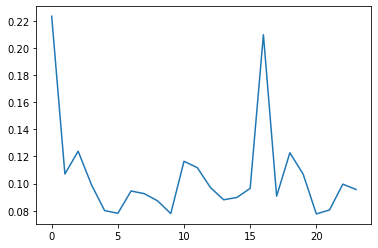

step: 3/4, D_loss: 0.88041294, G_loss_U: 1.3381358, G_loss_S: 0.0141653195, E_loss_t0: 0.909504


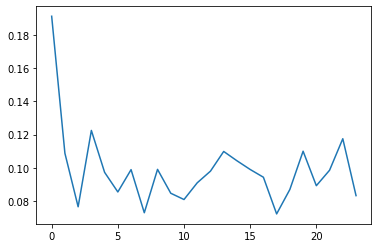

step: 3/4, D_loss: 0.85038245, G_loss_U: 1.4236122, G_loss_S: 0.011807929, E_loss_t0: 0.88643616


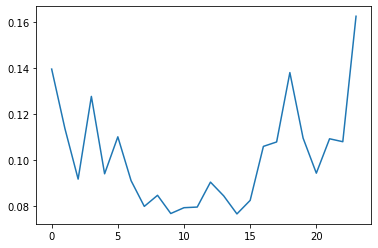

step: 3/4, D_loss: 0.8942974, G_loss_U: 1.5191975, G_loss_S: 0.0134943295, E_loss_t0: 0.88992006


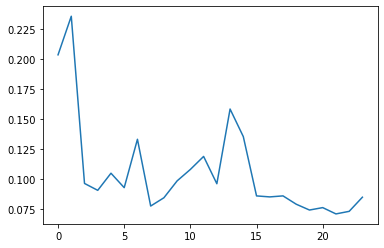

step: 3/4, D_loss: 0.8179101, G_loss_U: 1.6158419, G_loss_S: 0.012871496, E_loss_t0: 0.8857532


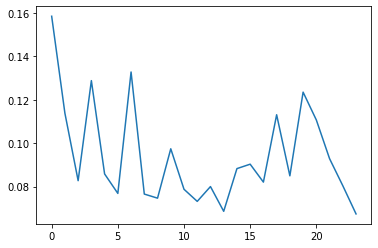

step: 3/4, D_loss: 0.8711214, G_loss_U: 1.6996168, G_loss_S: 0.013855447, E_loss_t0: 0.86675704


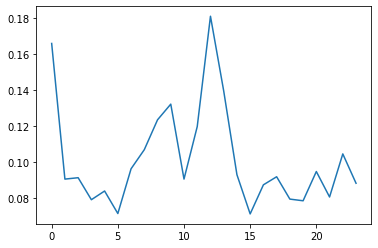

step: 3/4, D_loss: 0.70248836, G_loss_U: 1.7945925, G_loss_S: 0.013307717, E_loss_t0: 0.90503114


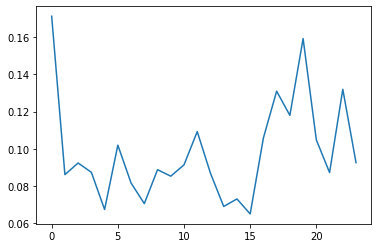

step: 3/4, D_loss: 0.7402409, G_loss_U: 1.8187166, G_loss_S: 0.01207209, E_loss_t0: 0.9002461


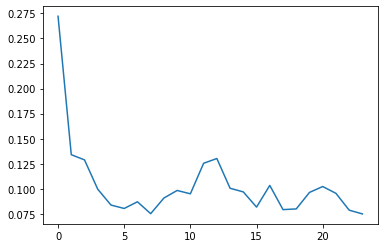

step: 3/4, D_loss: 0.6418336, G_loss_U: 1.9451343, G_loss_S: 0.014656755, E_loss_t0: 0.8860112


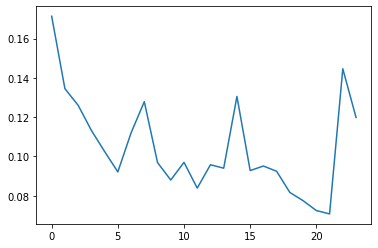

step: 3/4, D_loss: 0.7366943, G_loss_U: 1.9522594, G_loss_S: 0.013146971, E_loss_t0: 0.88749385


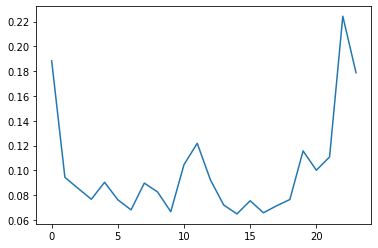

step: 3/4, D_loss: 0.6623693, G_loss_U: 2.019121, G_loss_S: 0.012342673, E_loss_t0: 0.89977723


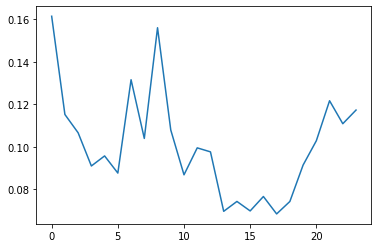

step: 3/4, D_loss: 0.6675815, G_loss_U: 2.0084069, G_loss_S: 0.0127648655, E_loss_t0: 0.8959825


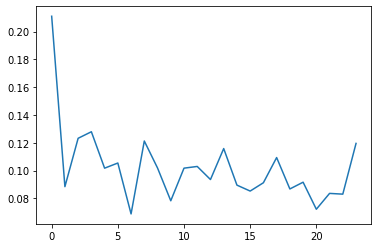

step: 3/4, D_loss: 0.7079398, G_loss_U: 2.0680404, G_loss_S: 0.013286904, E_loss_t0: 0.88731295


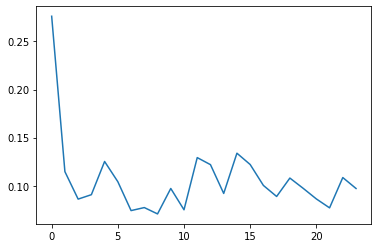

step: 3/4, D_loss: 0.64312357, G_loss_U: 2.1028168, G_loss_S: 0.0123923225, E_loss_t0: 0.8838343


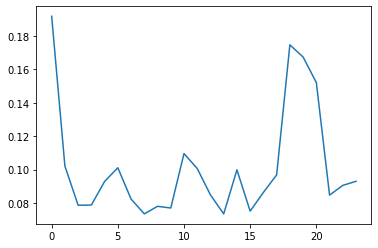

step: 3/4, D_loss: 0.6262576, G_loss_U: 2.2039516, G_loss_S: 0.013600781, E_loss_t0: 0.892597


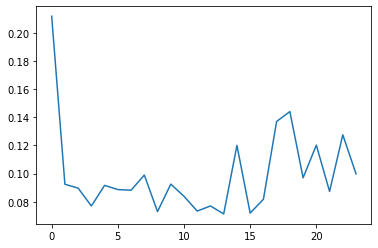

step: 3/4, D_loss: 0.5763172, G_loss_U: 2.2634773, G_loss_S: 0.013406631, E_loss_t0: 0.88387537


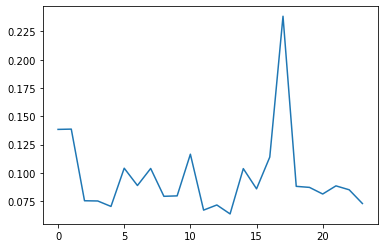

step: 3/4, D_loss: 0.5502265, G_loss_U: 2.3149207, G_loss_S: 0.013085427, E_loss_t0: 0.8869952


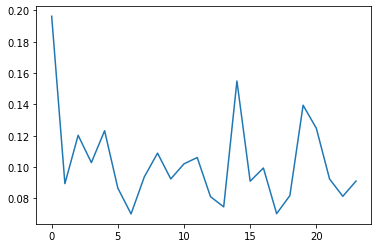

step: 3/4, D_loss: 0.6161545, G_loss_U: 2.3331456, G_loss_S: 0.012763316, E_loss_t0: 0.8795078


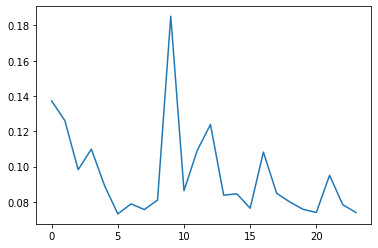

step: 3/4, D_loss: 0.57132673, G_loss_U: 2.3716476, G_loss_S: 0.013604054, E_loss_t0: 0.90875405


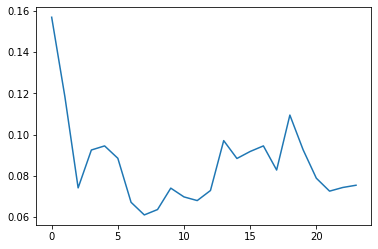

step: 3/4, D_loss: 0.49147314, G_loss_U: 2.3942473, G_loss_S: 0.013450134, E_loss_t0: 0.8963006


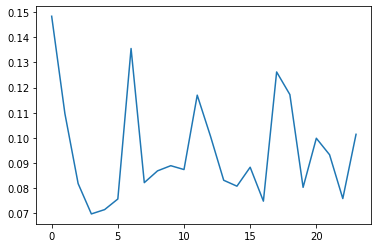

step: 3/4, D_loss: 0.555965, G_loss_U: 2.4086237, G_loss_S: 0.013965486, E_loss_t0: 0.9074039


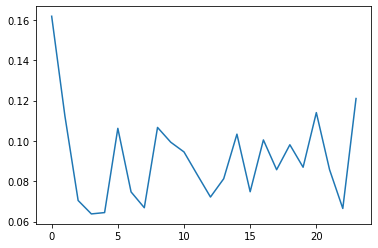

step: 3/4, D_loss: 0.48322123, G_loss_U: 2.436882, G_loss_S: 0.014292471, E_loss_t0: 0.90471596


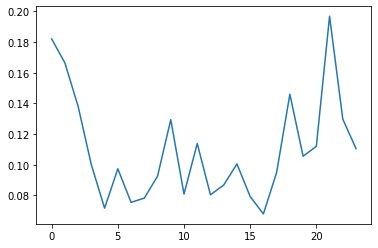

step: 3/4, D_loss: 0.4422452, G_loss_U: 2.4118721, G_loss_S: 0.012677779, E_loss_t0: 0.88248235


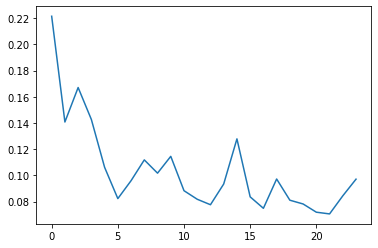

step: 3/4, D_loss: 0.4435464, G_loss_U: 2.4718473, G_loss_S: 0.013765182, E_loss_t0: 0.882264


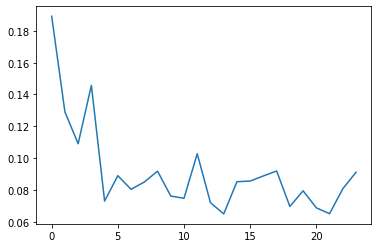

step: 3/4, D_loss: 0.44208738, G_loss_U: 2.5752156, G_loss_S: 0.01488511, E_loss_t0: 0.9034154


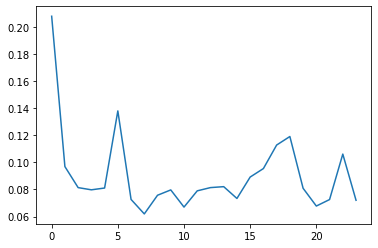

step: 3/4, D_loss: 0.418196, G_loss_U: 2.6650915, G_loss_S: 0.014118409, E_loss_t0: 0.8726216


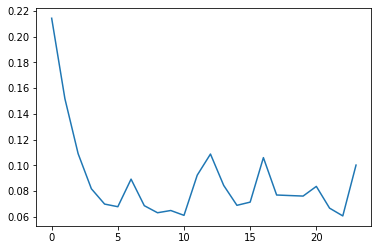

step: 3/4, D_loss: 0.44015744, G_loss_U: 2.748285, G_loss_S: 0.014577128, E_loss_t0: 0.8928454


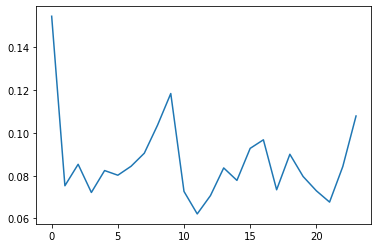

step: 3/4, D_loss: 0.40296668, G_loss_U: 2.7949755, G_loss_S: 0.013403984, E_loss_t0: 0.8934696


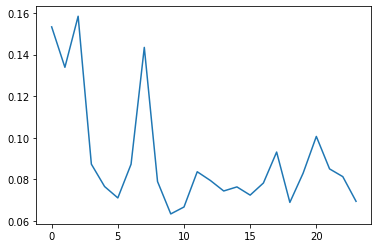

step: 3/4, D_loss: 0.36720222, G_loss_U: 2.8410265, G_loss_S: 0.013725411, E_loss_t0: 0.88224614


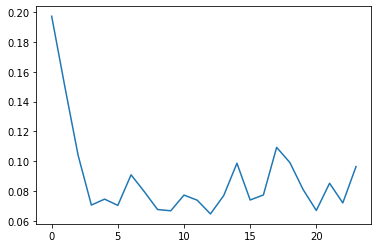

step: 3/4, D_loss: 0.40416512, G_loss_U: 2.852092, G_loss_S: 0.013253376, E_loss_t0: 0.90558565


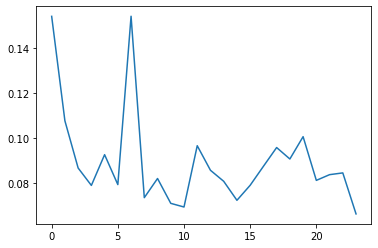

step: 3/4, D_loss: 0.3812314, G_loss_U: 2.8667812, G_loss_S: 0.014104259, E_loss_t0: 0.8935441


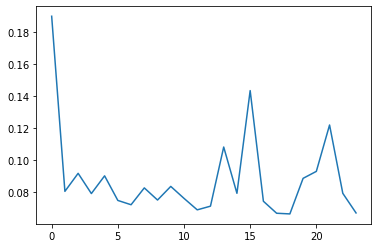

step: 3/4, D_loss: 0.35351512, G_loss_U: 2.842971, G_loss_S: 0.0134761045, E_loss_t0: 0.8860448


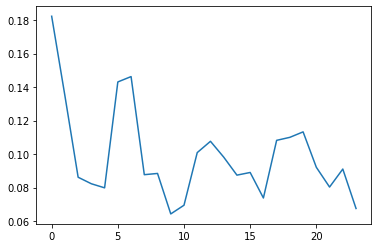

step: 3/4, D_loss: 0.35625696, G_loss_U: 2.814884, G_loss_S: 0.012933116, E_loss_t0: 0.8894338


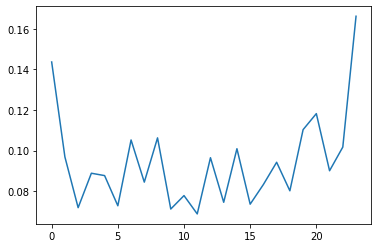

Finish Joint Training


In [34]:
Generator, Embedder, Supervisor, Recovery, Discriminator, checkpoints, generated = TimeGAN(data, parameters)

In [35]:
# Save Generator and Recovery for Reproducibility
torch.save(Generator.state_dict(), "../generator_ada_fnn")
torch.save(Recovery.state_dict(), "../recovery_ada_fnn")

It seems that the curves tend to smooth over time (if trainings time is long enough). However, in some test runs the training routine without the ada fnn layer achieved similiar curve forms for one dimensional data. Change dim in the first parameter cell to 1 to compare.